In [30]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shap

from ast import literal_eval
from dateutil.relativedelta import relativedelta
from scipy.stats import kurtosis, skew
from shapely.geometry import Point
from shapely.wkt import loads
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier

In [8]:
path = '../data/processed/drought_melted_data_with_target_and_weights_and_features.csv'
drought_melted_data_with_target_and_weights_and_features = pd.read_csv(path, index_col=0)
drought_melted_data_with_target_and_weights_and_features.date = pd.to_datetime(
    drought_melted_data_with_target_and_weights_and_features.date
)

In [9]:
features = [
    col for col 
    in drought_melted_data_with_target_and_weights_and_features.columns 
    if 'last' in col
]

In [10]:
feature_columns = [
    'mean_drought_level_coef_neighbours1',
    'mean_drought_level_coef_neighbours2',
    'gradient_mean_drought_level_neighbours',
] + features
target = 'next_month_drought_level_coef'
weight = 'grad'

In [11]:
start_train, end_train = pd.to_datetime('2010-01-01'), pd.to_datetime('2020-01-01')
start_oot, end_oot = pd.to_datetime('2020-01-01'), pd.to_datetime('2023-01-01')

window_train = drought_melted_data_with_target_and_weights_and_features.date.between(start_train, end_train)
window_oot = drought_melted_data_with_target_and_weights_and_features.date.between(start_oot, end_oot)

In [12]:
data_train = drought_melted_data_with_target_and_weights_and_features[window_train]
data_train_with_weight = data_train[data_train[weight] != 0]
x_train, y_train = data_train_with_weight[feature_columns], data_train_with_weight[target] >= 2

x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.20, random_state=42)
x_train, x_dev, y_train, y_dev = train_test_split(x_train, y_train, test_size=0.20, random_state=42)

data_oot = drought_melted_data_with_target_and_weights_and_features[window_oot]
data_oot_with_weight = data_oot[data_oot[weight] != 0]

x_oot, y_oot = data_oot_with_weight[feature_columns], data_oot_with_weight[target] >= 2

w_train = np.exp(data_train_with_weight.loc[x_train.index][weight])
w_test = np.exp(data_train_with_weight.loc[x_test.index][weight])
w_dev = np.exp(data_train_with_weight.loc[x_dev.index][weight])
w_oot = np.exp(data_oot_with_weight.loc[x_oot.index][weight])

In [13]:
model = XGBClassifier(
    n_estimators=100000,
    max_depth=5,
    max_leaves=0,
    learning_rate=0.01,
    gamma=0.1,
    subsample=0.8,
    colsample_bytree=0.7,
    colsample_bylevel=0.7,
    colsample_bynode=0.7,
    random_state=42,
)

In [14]:
model.fit(
    x_train, y_train, 
    sample_weight=abs(w_train),
    eval_set=[(x_train, y_train), (x_test, y_test), (x_dev, y_dev)],
    sample_weight_eval_set = [abs(w_train), abs(w_test), abs(w_dev)],
    eval_metric=['aucpr', 'auc'],
    early_stopping_rounds=100,
)

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[0]	validation_0-aucpr:0.70682	validation_0-auc:0.82663	validation_1-aucpr:0.68718	validation_1-auc:0.80868	validation_2-aucpr:0.66943	validation_2-auc:0.80187
[1]	validation_0-aucpr:0.74755	validation_0-auc:0.85189	validation_1-aucpr:0.72667	validation_1-auc:0.83649	validation_2-aucpr:0.71891	validation_2-auc:0.82757
[2]	validation_0-aucpr:0.75988	validation_0-auc:0.86077	validation_1-aucpr:0.74157	validation_1-auc:0.84566	validation_2-aucpr:0.72961	validation_2-auc:0.83686
[3]	validation_0-aucpr:0.76485	validation_0-auc:0.86232	validation_1-aucpr:0.74711	validation_1-auc:0.84669	validation_2-aucpr:0.73670	validation_2-auc:0.84061
[4]	validation_0-aucpr:0.76545	validation_0-auc:0.86248	validation_1-aucpr:0.74719	validation_1-auc:0.84707	validation_2-aucpr:0.73798	validation_2-auc:0.84149
[5]	validation_0-aucpr:0.76560	validation_0-auc:0.86286	validation_1-aucpr:0.74443	validation_1-auc:0.84492	validation_2-aucpr:0.73735	validation_2-auc:0.84194
[6]	validation_0-aucpr:0.76473	validatio

[51]	validation_0-aucpr:0.78021	validation_0-auc:0.87413	validation_1-aucpr:0.75808	validation_1-auc:0.85655	validation_2-aucpr:0.74697	validation_2-auc:0.84860
[52]	validation_0-aucpr:0.78037	validation_0-auc:0.87425	validation_1-aucpr:0.75800	validation_1-auc:0.85643	validation_2-aucpr:0.74723	validation_2-auc:0.84892
[53]	validation_0-aucpr:0.78069	validation_0-auc:0.87460	validation_1-aucpr:0.75811	validation_1-auc:0.85646	validation_2-aucpr:0.74744	validation_2-auc:0.84901
[54]	validation_0-aucpr:0.78081	validation_0-auc:0.87476	validation_1-aucpr:0.75826	validation_1-auc:0.85664	validation_2-aucpr:0.74744	validation_2-auc:0.84906
[55]	validation_0-aucpr:0.78091	validation_0-auc:0.87476	validation_1-aucpr:0.75816	validation_1-auc:0.85659	validation_2-aucpr:0.74742	validation_2-auc:0.84895
[56]	validation_0-aucpr:0.78107	validation_0-auc:0.87483	validation_1-aucpr:0.75830	validation_1-auc:0.85666	validation_2-aucpr:0.74746	validation_2-auc:0.84883
[57]	validation_0-aucpr:0.78122	va

[102]	validation_0-aucpr:0.78895	validation_0-auc:0.88034	validation_1-aucpr:0.76406	validation_1-auc:0.86080	validation_2-aucpr:0.75443	validation_2-auc:0.85322
[103]	validation_0-aucpr:0.78907	validation_0-auc:0.88033	validation_1-aucpr:0.76416	validation_1-auc:0.86077	validation_2-aucpr:0.75446	validation_2-auc:0.85321
[104]	validation_0-aucpr:0.78921	validation_0-auc:0.88045	validation_1-aucpr:0.76431	validation_1-auc:0.86095	validation_2-aucpr:0.75446	validation_2-auc:0.85321
[105]	validation_0-aucpr:0.78934	validation_0-auc:0.88047	validation_1-aucpr:0.76426	validation_1-auc:0.86090	validation_2-aucpr:0.75462	validation_2-auc:0.85330
[106]	validation_0-aucpr:0.78936	validation_0-auc:0.88050	validation_1-aucpr:0.76428	validation_1-auc:0.86088	validation_2-aucpr:0.75459	validation_2-auc:0.85329
[107]	validation_0-aucpr:0.78955	validation_0-auc:0.88061	validation_1-aucpr:0.76441	validation_1-auc:0.86101	validation_2-aucpr:0.75477	validation_2-auc:0.85336
[108]	validation_0-aucpr:0.7

[153]	validation_0-aucpr:0.79688	validation_0-auc:0.88509	validation_1-aucpr:0.76943	validation_1-auc:0.86406	validation_2-aucpr:0.76016	validation_2-auc:0.85602
[154]	validation_0-aucpr:0.79699	validation_0-auc:0.88517	validation_1-aucpr:0.76955	validation_1-auc:0.86412	validation_2-aucpr:0.76036	validation_2-auc:0.85622
[155]	validation_0-aucpr:0.79716	validation_0-auc:0.88529	validation_1-aucpr:0.76967	validation_1-auc:0.86419	validation_2-aucpr:0.76055	validation_2-auc:0.85640
[156]	validation_0-aucpr:0.79728	validation_0-auc:0.88536	validation_1-aucpr:0.76974	validation_1-auc:0.86428	validation_2-aucpr:0.76079	validation_2-auc:0.85674
[157]	validation_0-aucpr:0.79738	validation_0-auc:0.88536	validation_1-aucpr:0.76992	validation_1-auc:0.86432	validation_2-aucpr:0.76093	validation_2-auc:0.85676
[158]	validation_0-aucpr:0.79761	validation_0-auc:0.88552	validation_1-aucpr:0.77005	validation_1-auc:0.86442	validation_2-aucpr:0.76116	validation_2-auc:0.85692
[159]	validation_0-aucpr:0.7

[204]	validation_0-aucpr:0.80492	validation_0-auc:0.89071	validation_1-aucpr:0.77449	validation_1-auc:0.86729	validation_2-aucpr:0.76704	validation_2-auc:0.86136
[205]	validation_0-aucpr:0.80509	validation_0-auc:0.89080	validation_1-aucpr:0.77461	validation_1-auc:0.86736	validation_2-aucpr:0.76713	validation_2-auc:0.86139
[206]	validation_0-aucpr:0.80523	validation_0-auc:0.89088	validation_1-aucpr:0.77462	validation_1-auc:0.86734	validation_2-aucpr:0.76722	validation_2-auc:0.86141
[207]	validation_0-aucpr:0.80549	validation_0-auc:0.89111	validation_1-aucpr:0.77473	validation_1-auc:0.86745	validation_2-aucpr:0.76747	validation_2-auc:0.86170
[208]	validation_0-aucpr:0.80564	validation_0-auc:0.89127	validation_1-aucpr:0.77484	validation_1-auc:0.86748	validation_2-aucpr:0.76756	validation_2-auc:0.86177
[209]	validation_0-aucpr:0.80573	validation_0-auc:0.89134	validation_1-aucpr:0.77492	validation_1-auc:0.86762	validation_2-aucpr:0.76753	validation_2-auc:0.86179
[210]	validation_0-aucpr:0.8

[255]	validation_0-aucpr:0.81297	validation_0-auc:0.89691	validation_1-aucpr:0.77883	validation_1-auc:0.87057	validation_2-aucpr:0.77191	validation_2-auc:0.86553
[256]	validation_0-aucpr:0.81307	validation_0-auc:0.89699	validation_1-aucpr:0.77883	validation_1-auc:0.87058	validation_2-aucpr:0.77191	validation_2-auc:0.86549
[257]	validation_0-aucpr:0.81323	validation_0-auc:0.89720	validation_1-aucpr:0.77885	validation_1-auc:0.87065	validation_2-aucpr:0.77198	validation_2-auc:0.86560
[258]	validation_0-aucpr:0.81336	validation_0-auc:0.89732	validation_1-aucpr:0.77893	validation_1-auc:0.87076	validation_2-aucpr:0.77207	validation_2-auc:0.86570
[259]	validation_0-aucpr:0.81350	validation_0-auc:0.89748	validation_1-aucpr:0.77906	validation_1-auc:0.87091	validation_2-aucpr:0.77204	validation_2-auc:0.86577
[260]	validation_0-aucpr:0.81366	validation_0-auc:0.89759	validation_1-aucpr:0.77917	validation_1-auc:0.87099	validation_2-aucpr:0.77213	validation_2-auc:0.86587
[261]	validation_0-aucpr:0.8

[306]	validation_0-aucpr:0.82096	validation_0-auc:0.90289	validation_1-aucpr:0.78304	validation_1-auc:0.87425	validation_2-aucpr:0.77662	validation_2-auc:0.86994
[307]	validation_0-aucpr:0.82115	validation_0-auc:0.90299	validation_1-aucpr:0.78318	validation_1-auc:0.87431	validation_2-aucpr:0.77674	validation_2-auc:0.87000
[308]	validation_0-aucpr:0.82129	validation_0-auc:0.90308	validation_1-aucpr:0.78321	validation_1-auc:0.87433	validation_2-aucpr:0.77670	validation_2-auc:0.86995
[309]	validation_0-aucpr:0.82140	validation_0-auc:0.90314	validation_1-aucpr:0.78327	validation_1-auc:0.87439	validation_2-aucpr:0.77668	validation_2-auc:0.86995
[310]	validation_0-aucpr:0.82154	validation_0-auc:0.90322	validation_1-aucpr:0.78336	validation_1-auc:0.87441	validation_2-aucpr:0.77674	validation_2-auc:0.87003
[311]	validation_0-aucpr:0.82162	validation_0-auc:0.90330	validation_1-aucpr:0.78339	validation_1-auc:0.87445	validation_2-aucpr:0.77679	validation_2-auc:0.87010
[312]	validation_0-aucpr:0.8

[357]	validation_0-aucpr:0.82816	validation_0-auc:0.90820	validation_1-aucpr:0.78717	validation_1-auc:0.87761	validation_2-aucpr:0.78074	validation_2-auc:0.87378
[358]	validation_0-aucpr:0.82832	validation_0-auc:0.90829	validation_1-aucpr:0.78728	validation_1-auc:0.87767	validation_2-aucpr:0.78085	validation_2-auc:0.87386
[359]	validation_0-aucpr:0.82854	validation_0-auc:0.90842	validation_1-aucpr:0.78739	validation_1-auc:0.87770	validation_2-aucpr:0.78109	validation_2-auc:0.87409
[360]	validation_0-aucpr:0.82878	validation_0-auc:0.90856	validation_1-aucpr:0.78753	validation_1-auc:0.87780	validation_2-aucpr:0.78129	validation_2-auc:0.87420
[361]	validation_0-aucpr:0.82892	validation_0-auc:0.90865	validation_1-aucpr:0.78759	validation_1-auc:0.87786	validation_2-aucpr:0.78133	validation_2-auc:0.87421
[362]	validation_0-aucpr:0.82908	validation_0-auc:0.90876	validation_1-aucpr:0.78763	validation_1-auc:0.87791	validation_2-aucpr:0.78138	validation_2-auc:0.87421
[363]	validation_0-aucpr:0.8

[408]	validation_0-aucpr:0.83547	validation_0-auc:0.91351	validation_1-aucpr:0.79087	validation_1-auc:0.88059	validation_2-aucpr:0.78516	validation_2-auc:0.87748
[409]	validation_0-aucpr:0.83563	validation_0-auc:0.91360	validation_1-aucpr:0.79097	validation_1-auc:0.88071	validation_2-aucpr:0.78527	validation_2-auc:0.87752
[410]	validation_0-aucpr:0.83574	validation_0-auc:0.91370	validation_1-aucpr:0.79109	validation_1-auc:0.88088	validation_2-aucpr:0.78530	validation_2-auc:0.87756
[411]	validation_0-aucpr:0.83585	validation_0-auc:0.91375	validation_1-aucpr:0.79119	validation_1-auc:0.88094	validation_2-aucpr:0.78542	validation_2-auc:0.87764
[412]	validation_0-aucpr:0.83607	validation_0-auc:0.91389	validation_1-aucpr:0.79131	validation_1-auc:0.88099	validation_2-aucpr:0.78552	validation_2-auc:0.87773
[413]	validation_0-aucpr:0.83615	validation_0-auc:0.91396	validation_1-aucpr:0.79145	validation_1-auc:0.88112	validation_2-aucpr:0.78562	validation_2-auc:0.87782
[414]	validation_0-aucpr:0.8

[459]	validation_0-aucpr:0.84121	validation_0-auc:0.91741	validation_1-aucpr:0.79430	validation_1-auc:0.88386	validation_2-aucpr:0.78841	validation_2-auc:0.87989
[460]	validation_0-aucpr:0.84129	validation_0-auc:0.91750	validation_1-aucpr:0.79438	validation_1-auc:0.88397	validation_2-aucpr:0.78843	validation_2-auc:0.87995
[461]	validation_0-aucpr:0.84144	validation_0-auc:0.91761	validation_1-aucpr:0.79442	validation_1-auc:0.88400	validation_2-aucpr:0.78849	validation_2-auc:0.88002
[462]	validation_0-aucpr:0.84162	validation_0-auc:0.91777	validation_1-aucpr:0.79453	validation_1-auc:0.88409	validation_2-aucpr:0.78857	validation_2-auc:0.88009
[463]	validation_0-aucpr:0.84174	validation_0-auc:0.91784	validation_1-aucpr:0.79455	validation_1-auc:0.88407	validation_2-aucpr:0.78862	validation_2-auc:0.88011
[464]	validation_0-aucpr:0.84188	validation_0-auc:0.91798	validation_1-aucpr:0.79463	validation_1-auc:0.88417	validation_2-aucpr:0.78870	validation_2-auc:0.88020
[465]	validation_0-aucpr:0.8

[510]	validation_0-aucpr:0.84722	validation_0-auc:0.92173	validation_1-aucpr:0.79712	validation_1-auc:0.88622	validation_2-aucpr:0.79132	validation_2-auc:0.88235
[511]	validation_0-aucpr:0.84736	validation_0-auc:0.92183	validation_1-aucpr:0.79709	validation_1-auc:0.88616	validation_2-aucpr:0.79135	validation_2-auc:0.88236
[512]	validation_0-aucpr:0.84748	validation_0-auc:0.92189	validation_1-aucpr:0.79716	validation_1-auc:0.88621	validation_2-aucpr:0.79142	validation_2-auc:0.88242
[513]	validation_0-aucpr:0.84765	validation_0-auc:0.92205	validation_1-aucpr:0.79720	validation_1-auc:0.88624	validation_2-aucpr:0.79149	validation_2-auc:0.88252
[514]	validation_0-aucpr:0.84778	validation_0-auc:0.92214	validation_1-aucpr:0.79726	validation_1-auc:0.88629	validation_2-aucpr:0.79155	validation_2-auc:0.88254
[515]	validation_0-aucpr:0.84786	validation_0-auc:0.92218	validation_1-aucpr:0.79729	validation_1-auc:0.88629	validation_2-aucpr:0.79160	validation_2-auc:0.88259
[516]	validation_0-aucpr:0.8

[561]	validation_0-aucpr:0.85250	validation_0-auc:0.92531	validation_1-aucpr:0.79973	validation_1-auc:0.88825	validation_2-aucpr:0.79396	validation_2-auc:0.88432
[562]	validation_0-aucpr:0.85260	validation_0-auc:0.92536	validation_1-aucpr:0.79983	validation_1-auc:0.88831	validation_2-aucpr:0.79399	validation_2-auc:0.88433
[563]	validation_0-aucpr:0.85269	validation_0-auc:0.92540	validation_1-aucpr:0.79990	validation_1-auc:0.88833	validation_2-aucpr:0.79408	validation_2-auc:0.88438
[564]	validation_0-aucpr:0.85281	validation_0-auc:0.92548	validation_1-aucpr:0.79997	validation_1-auc:0.88839	validation_2-aucpr:0.79414	validation_2-auc:0.88440
[565]	validation_0-aucpr:0.85297	validation_0-auc:0.92558	validation_1-aucpr:0.80008	validation_1-auc:0.88851	validation_2-aucpr:0.79424	validation_2-auc:0.88450
[566]	validation_0-aucpr:0.85309	validation_0-auc:0.92567	validation_1-aucpr:0.80009	validation_1-auc:0.88851	validation_2-aucpr:0.79424	validation_2-auc:0.88452
[567]	validation_0-aucpr:0.8

[612]	validation_0-aucpr:0.85768	validation_0-auc:0.92860	validation_1-aucpr:0.80232	validation_1-auc:0.89006	validation_2-aucpr:0.79641	validation_2-auc:0.88612
[613]	validation_0-aucpr:0.85773	validation_0-auc:0.92863	validation_1-aucpr:0.80232	validation_1-auc:0.89008	validation_2-aucpr:0.79644	validation_2-auc:0.88615
[614]	validation_0-aucpr:0.85789	validation_0-auc:0.92872	validation_1-aucpr:0.80238	validation_1-auc:0.89011	validation_2-aucpr:0.79656	validation_2-auc:0.88622
[615]	validation_0-aucpr:0.85795	validation_0-auc:0.92875	validation_1-aucpr:0.80240	validation_1-auc:0.89013	validation_2-aucpr:0.79655	validation_2-auc:0.88621
[616]	validation_0-aucpr:0.85804	validation_0-auc:0.92881	validation_1-aucpr:0.80244	validation_1-auc:0.89016	validation_2-aucpr:0.79659	validation_2-auc:0.88625
[617]	validation_0-aucpr:0.85811	validation_0-auc:0.92889	validation_1-aucpr:0.80250	validation_1-auc:0.89026	validation_2-aucpr:0.79668	validation_2-auc:0.88640
[618]	validation_0-aucpr:0.8

[663]	validation_0-aucpr:0.86251	validation_0-auc:0.93166	validation_1-aucpr:0.80449	validation_1-auc:0.89167	validation_2-aucpr:0.79897	validation_2-auc:0.88801
[664]	validation_0-aucpr:0.86256	validation_0-auc:0.93167	validation_1-aucpr:0.80451	validation_1-auc:0.89167	validation_2-aucpr:0.79893	validation_2-auc:0.88799
[665]	validation_0-aucpr:0.86266	validation_0-auc:0.93175	validation_1-aucpr:0.80457	validation_1-auc:0.89172	validation_2-aucpr:0.79897	validation_2-auc:0.88802
[666]	validation_0-aucpr:0.86277	validation_0-auc:0.93181	validation_1-aucpr:0.80461	validation_1-auc:0.89175	validation_2-aucpr:0.79903	validation_2-auc:0.88807
[667]	validation_0-aucpr:0.86288	validation_0-auc:0.93187	validation_1-aucpr:0.80462	validation_1-auc:0.89177	validation_2-aucpr:0.79915	validation_2-auc:0.88814
[668]	validation_0-aucpr:0.86303	validation_0-auc:0.93198	validation_1-aucpr:0.80471	validation_1-auc:0.89188	validation_2-aucpr:0.79919	validation_2-auc:0.88814
[669]	validation_0-aucpr:0.8

[714]	validation_0-aucpr:0.86717	validation_0-auc:0.93450	validation_1-aucpr:0.80684	validation_1-auc:0.89351	validation_2-aucpr:0.80095	validation_2-auc:0.88928
[715]	validation_0-aucpr:0.86728	validation_0-auc:0.93456	validation_1-aucpr:0.80684	validation_1-auc:0.89351	validation_2-aucpr:0.80096	validation_2-auc:0.88927
[716]	validation_0-aucpr:0.86741	validation_0-auc:0.93463	validation_1-aucpr:0.80691	validation_1-auc:0.89355	validation_2-aucpr:0.80103	validation_2-auc:0.88930
[717]	validation_0-aucpr:0.86750	validation_0-auc:0.93469	validation_1-aucpr:0.80693	validation_1-auc:0.89358	validation_2-aucpr:0.80108	validation_2-auc:0.88937
[718]	validation_0-aucpr:0.86756	validation_0-auc:0.93471	validation_1-aucpr:0.80697	validation_1-auc:0.89361	validation_2-aucpr:0.80111	validation_2-auc:0.88940
[719]	validation_0-aucpr:0.86763	validation_0-auc:0.93477	validation_1-aucpr:0.80702	validation_1-auc:0.89368	validation_2-aucpr:0.80114	validation_2-auc:0.88941
[720]	validation_0-aucpr:0.8

[765]	validation_0-aucpr:0.87150	validation_0-auc:0.93700	validation_1-aucpr:0.80876	validation_1-auc:0.89496	validation_2-aucpr:0.80258	validation_2-auc:0.89034
[766]	validation_0-aucpr:0.87156	validation_0-auc:0.93704	validation_1-aucpr:0.80878	validation_1-auc:0.89498	validation_2-aucpr:0.80263	validation_2-auc:0.89038
[767]	validation_0-aucpr:0.87168	validation_0-auc:0.93710	validation_1-aucpr:0.80881	validation_1-auc:0.89501	validation_2-aucpr:0.80271	validation_2-auc:0.89045
[768]	validation_0-aucpr:0.87174	validation_0-auc:0.93713	validation_1-aucpr:0.80885	validation_1-auc:0.89503	validation_2-aucpr:0.80276	validation_2-auc:0.89046
[769]	validation_0-aucpr:0.87180	validation_0-auc:0.93716	validation_1-aucpr:0.80887	validation_1-auc:0.89504	validation_2-aucpr:0.80272	validation_2-auc:0.89041
[770]	validation_0-aucpr:0.87190	validation_0-auc:0.93722	validation_1-aucpr:0.80894	validation_1-auc:0.89508	validation_2-aucpr:0.80280	validation_2-auc:0.89043
[771]	validation_0-aucpr:0.8

[816]	validation_0-aucpr:0.87602	validation_0-auc:0.93961	validation_1-aucpr:0.81045	validation_1-auc:0.89616	validation_2-aucpr:0.80437	validation_2-auc:0.89159
[817]	validation_0-aucpr:0.87605	validation_0-auc:0.93962	validation_1-aucpr:0.81046	validation_1-auc:0.89617	validation_2-aucpr:0.80441	validation_2-auc:0.89161
[818]	validation_0-aucpr:0.87613	validation_0-auc:0.93967	validation_1-aucpr:0.81049	validation_1-auc:0.89618	validation_2-aucpr:0.80445	validation_2-auc:0.89164
[819]	validation_0-aucpr:0.87622	validation_0-auc:0.93972	validation_1-aucpr:0.81056	validation_1-auc:0.89624	validation_2-aucpr:0.80447	validation_2-auc:0.89167
[820]	validation_0-aucpr:0.87629	validation_0-auc:0.93975	validation_1-aucpr:0.81054	validation_1-auc:0.89619	validation_2-aucpr:0.80450	validation_2-auc:0.89168
[821]	validation_0-aucpr:0.87632	validation_0-auc:0.93974	validation_1-aucpr:0.81054	validation_1-auc:0.89619	validation_2-aucpr:0.80454	validation_2-auc:0.89175
[822]	validation_0-aucpr:0.8

[867]	validation_0-aucpr:0.87962	validation_0-auc:0.94160	validation_1-aucpr:0.81176	validation_1-auc:0.89695	validation_2-aucpr:0.80592	validation_2-auc:0.89263
[868]	validation_0-aucpr:0.87966	validation_0-auc:0.94161	validation_1-aucpr:0.81172	validation_1-auc:0.89688	validation_2-aucpr:0.80597	validation_2-auc:0.89267
[869]	validation_0-aucpr:0.87981	validation_0-auc:0.94168	validation_1-aucpr:0.81180	validation_1-auc:0.89692	validation_2-aucpr:0.80602	validation_2-auc:0.89270
[870]	validation_0-aucpr:0.87990	validation_0-auc:0.94174	validation_1-aucpr:0.81183	validation_1-auc:0.89696	validation_2-aucpr:0.80600	validation_2-auc:0.89269
[871]	validation_0-aucpr:0.87999	validation_0-auc:0.94179	validation_1-aucpr:0.81186	validation_1-auc:0.89698	validation_2-aucpr:0.80602	validation_2-auc:0.89271
[872]	validation_0-aucpr:0.88010	validation_0-auc:0.94184	validation_1-aucpr:0.81188	validation_1-auc:0.89699	validation_2-aucpr:0.80607	validation_2-auc:0.89273
[873]	validation_0-aucpr:0.8

[918]	validation_0-aucpr:0.88334	validation_0-auc:0.94360	validation_1-aucpr:0.81314	validation_1-auc:0.89781	validation_2-aucpr:0.80751	validation_2-auc:0.89349
[919]	validation_0-aucpr:0.88342	validation_0-auc:0.94365	validation_1-aucpr:0.81313	validation_1-auc:0.89782	validation_2-aucpr:0.80753	validation_2-auc:0.89352
[920]	validation_0-aucpr:0.88348	validation_0-auc:0.94370	validation_1-aucpr:0.81316	validation_1-auc:0.89785	validation_2-aucpr:0.80755	validation_2-auc:0.89353
[921]	validation_0-aucpr:0.88353	validation_0-auc:0.94375	validation_1-aucpr:0.81316	validation_1-auc:0.89788	validation_2-aucpr:0.80762	validation_2-auc:0.89356
[922]	validation_0-aucpr:0.88363	validation_0-auc:0.94380	validation_1-aucpr:0.81317	validation_1-auc:0.89788	validation_2-aucpr:0.80762	validation_2-auc:0.89358
[923]	validation_0-aucpr:0.88370	validation_0-auc:0.94384	validation_1-aucpr:0.81320	validation_1-auc:0.89790	validation_2-aucpr:0.80770	validation_2-auc:0.89361
[924]	validation_0-aucpr:0.8

[969]	validation_0-aucpr:0.88698	validation_0-auc:0.94556	validation_1-aucpr:0.81466	validation_1-auc:0.89889	validation_2-aucpr:0.80916	validation_2-auc:0.89446
[970]	validation_0-aucpr:0.88707	validation_0-auc:0.94560	validation_1-aucpr:0.81466	validation_1-auc:0.89888	validation_2-aucpr:0.80916	validation_2-auc:0.89444
[971]	validation_0-aucpr:0.88708	validation_0-auc:0.94561	validation_1-aucpr:0.81465	validation_1-auc:0.89887	validation_2-aucpr:0.80915	validation_2-auc:0.89443
[972]	validation_0-aucpr:0.88714	validation_0-auc:0.94563	validation_1-aucpr:0.81468	validation_1-auc:0.89888	validation_2-aucpr:0.80919	validation_2-auc:0.89443
[973]	validation_0-aucpr:0.88722	validation_0-auc:0.94567	validation_1-aucpr:0.81468	validation_1-auc:0.89890	validation_2-aucpr:0.80921	validation_2-auc:0.89443
[974]	validation_0-aucpr:0.88733	validation_0-auc:0.94575	validation_1-aucpr:0.81470	validation_1-auc:0.89894	validation_2-aucpr:0.80923	validation_2-auc:0.89448
[975]	validation_0-aucpr:0.8

[1020]	validation_0-aucpr:0.89069	validation_0-auc:0.94750	validation_1-aucpr:0.81593	validation_1-auc:0.89962	validation_2-aucpr:0.81060	validation_2-auc:0.89519
[1021]	validation_0-aucpr:0.89077	validation_0-auc:0.94755	validation_1-aucpr:0.81597	validation_1-auc:0.89963	validation_2-aucpr:0.81075	validation_2-auc:0.89537
[1022]	validation_0-aucpr:0.89085	validation_0-auc:0.94759	validation_1-aucpr:0.81601	validation_1-auc:0.89966	validation_2-aucpr:0.81077	validation_2-auc:0.89538
[1023]	validation_0-aucpr:0.89089	validation_0-auc:0.94761	validation_1-aucpr:0.81603	validation_1-auc:0.89966	validation_2-aucpr:0.81077	validation_2-auc:0.89536
[1024]	validation_0-aucpr:0.89094	validation_0-auc:0.94764	validation_1-aucpr:0.81602	validation_1-auc:0.89966	validation_2-aucpr:0.81077	validation_2-auc:0.89535
[1025]	validation_0-aucpr:0.89105	validation_0-auc:0.94770	validation_1-aucpr:0.81608	validation_1-auc:0.89971	validation_2-aucpr:0.81076	validation_2-auc:0.89534
[1026]	validation_0-au

[1071]	validation_0-aucpr:0.89379	validation_0-auc:0.94917	validation_1-aucpr:0.81697	validation_1-auc:0.90031	validation_2-aucpr:0.81184	validation_2-auc:0.89598
[1072]	validation_0-aucpr:0.89379	validation_0-auc:0.94916	validation_1-aucpr:0.81697	validation_1-auc:0.90031	validation_2-aucpr:0.81188	validation_2-auc:0.89603
[1073]	validation_0-aucpr:0.89388	validation_0-auc:0.94922	validation_1-aucpr:0.81704	validation_1-auc:0.90038	validation_2-aucpr:0.81177	validation_2-auc:0.89585
[1074]	validation_0-aucpr:0.89392	validation_0-auc:0.94924	validation_1-aucpr:0.81706	validation_1-auc:0.90038	validation_2-aucpr:0.81179	validation_2-auc:0.89589
[1075]	validation_0-aucpr:0.89402	validation_0-auc:0.94929	validation_1-aucpr:0.81718	validation_1-auc:0.90047	validation_2-aucpr:0.81196	validation_2-auc:0.89606
[1076]	validation_0-aucpr:0.89408	validation_0-auc:0.94932	validation_1-aucpr:0.81718	validation_1-auc:0.90047	validation_2-aucpr:0.81196	validation_2-auc:0.89606
[1077]	validation_0-au

[1122]	validation_0-aucpr:0.89694	validation_0-auc:0.95086	validation_1-aucpr:0.81819	validation_1-auc:0.90100	validation_2-aucpr:0.81294	validation_2-auc:0.89659
[1123]	validation_0-aucpr:0.89703	validation_0-auc:0.95091	validation_1-aucpr:0.81820	validation_1-auc:0.90099	validation_2-aucpr:0.81294	validation_2-auc:0.89659
[1124]	validation_0-aucpr:0.89709	validation_0-auc:0.95094	validation_1-aucpr:0.81821	validation_1-auc:0.90100	validation_2-aucpr:0.81290	validation_2-auc:0.89656
[1125]	validation_0-aucpr:0.89718	validation_0-auc:0.95097	validation_1-aucpr:0.81818	validation_1-auc:0.90098	validation_2-aucpr:0.81284	validation_2-auc:0.89651
[1126]	validation_0-aucpr:0.89721	validation_0-auc:0.95099	validation_1-aucpr:0.81824	validation_1-auc:0.90104	validation_2-aucpr:0.81288	validation_2-auc:0.89653
[1127]	validation_0-aucpr:0.89726	validation_0-auc:0.95101	validation_1-aucpr:0.81828	validation_1-auc:0.90104	validation_2-aucpr:0.81300	validation_2-auc:0.89659
[1128]	validation_0-au

[1173]	validation_0-aucpr:0.90027	validation_0-auc:0.95261	validation_1-aucpr:0.81931	validation_1-auc:0.90158	validation_2-aucpr:0.81406	validation_2-auc:0.89726
[1174]	validation_0-aucpr:0.90036	validation_0-auc:0.95266	validation_1-aucpr:0.81938	validation_1-auc:0.90161	validation_2-aucpr:0.81414	validation_2-auc:0.89730
[1175]	validation_0-aucpr:0.90039	validation_0-auc:0.95267	validation_1-aucpr:0.81939	validation_1-auc:0.90162	validation_2-aucpr:0.81415	validation_2-auc:0.89730
[1176]	validation_0-aucpr:0.90041	validation_0-auc:0.95269	validation_1-aucpr:0.81940	validation_1-auc:0.90163	validation_2-aucpr:0.81417	validation_2-auc:0.89731
[1177]	validation_0-aucpr:0.90044	validation_0-auc:0.95270	validation_1-aucpr:0.81944	validation_1-auc:0.90165	validation_2-aucpr:0.81422	validation_2-auc:0.89733
[1178]	validation_0-aucpr:0.90048	validation_0-auc:0.95271	validation_1-aucpr:0.81941	validation_1-auc:0.90164	validation_2-aucpr:0.81424	validation_2-auc:0.89734
[1179]	validation_0-au

[1224]	validation_0-aucpr:0.90320	validation_0-auc:0.95411	validation_1-aucpr:0.82050	validation_1-auc:0.90233	validation_2-aucpr:0.81513	validation_2-auc:0.89766
[1225]	validation_0-aucpr:0.90326	validation_0-auc:0.95414	validation_1-aucpr:0.82051	validation_1-auc:0.90233	validation_2-aucpr:0.81512	validation_2-auc:0.89765
[1226]	validation_0-aucpr:0.90331	validation_0-auc:0.95416	validation_1-aucpr:0.82055	validation_1-auc:0.90235	validation_2-aucpr:0.81515	validation_2-auc:0.89767
[1227]	validation_0-aucpr:0.90337	validation_0-auc:0.95419	validation_1-aucpr:0.82057	validation_1-auc:0.90236	validation_2-aucpr:0.81521	validation_2-auc:0.89773
[1228]	validation_0-aucpr:0.90340	validation_0-auc:0.95420	validation_1-aucpr:0.82061	validation_1-auc:0.90240	validation_2-aucpr:0.81522	validation_2-auc:0.89773
[1229]	validation_0-aucpr:0.90348	validation_0-auc:0.95425	validation_1-aucpr:0.82060	validation_1-auc:0.90240	validation_2-aucpr:0.81524	validation_2-auc:0.89774
[1230]	validation_0-au

[1275]	validation_0-aucpr:0.90600	validation_0-auc:0.95554	validation_1-aucpr:0.82158	validation_1-auc:0.90280	validation_2-aucpr:0.81603	validation_2-auc:0.89821
[1276]	validation_0-aucpr:0.90603	validation_0-auc:0.95555	validation_1-aucpr:0.82156	validation_1-auc:0.90277	validation_2-aucpr:0.81604	validation_2-auc:0.89822
[1277]	validation_0-aucpr:0.90608	validation_0-auc:0.95557	validation_1-aucpr:0.82163	validation_1-auc:0.90282	validation_2-aucpr:0.81607	validation_2-auc:0.89823
[1278]	validation_0-aucpr:0.90610	validation_0-auc:0.95558	validation_1-aucpr:0.82166	validation_1-auc:0.90284	validation_2-aucpr:0.81608	validation_2-auc:0.89825
[1279]	validation_0-aucpr:0.90612	validation_0-auc:0.95559	validation_1-aucpr:0.82165	validation_1-auc:0.90284	validation_2-aucpr:0.81607	validation_2-auc:0.89823
[1280]	validation_0-aucpr:0.90620	validation_0-auc:0.95564	validation_1-aucpr:0.82164	validation_1-auc:0.90281	validation_2-aucpr:0.81609	validation_2-auc:0.89825
[1281]	validation_0-au

[1326]	validation_0-aucpr:0.90839	validation_0-auc:0.95675	validation_1-aucpr:0.82228	validation_1-auc:0.90320	validation_2-aucpr:0.81684	validation_2-auc:0.89854
[1327]	validation_0-aucpr:0.90841	validation_0-auc:0.95677	validation_1-aucpr:0.82226	validation_1-auc:0.90319	validation_2-aucpr:0.81684	validation_2-auc:0.89855
[1328]	validation_0-aucpr:0.90847	validation_0-auc:0.95680	validation_1-aucpr:0.82233	validation_1-auc:0.90323	validation_2-aucpr:0.81683	validation_2-auc:0.89852
[1329]	validation_0-aucpr:0.90850	validation_0-auc:0.95682	validation_1-aucpr:0.82233	validation_1-auc:0.90324	validation_2-aucpr:0.81684	validation_2-auc:0.89853
[1330]	validation_0-aucpr:0.90851	validation_0-auc:0.95683	validation_1-aucpr:0.82234	validation_1-auc:0.90325	validation_2-aucpr:0.81683	validation_2-auc:0.89853
[1331]	validation_0-aucpr:0.90860	validation_0-auc:0.95687	validation_1-aucpr:0.82239	validation_1-auc:0.90327	validation_2-aucpr:0.81691	validation_2-auc:0.89859
[1332]	validation_0-au

[1377]	validation_0-aucpr:0.91095	validation_0-auc:0.95803	validation_1-aucpr:0.82329	validation_1-auc:0.90379	validation_2-aucpr:0.81789	validation_2-auc:0.89915
[1378]	validation_0-aucpr:0.91102	validation_0-auc:0.95807	validation_1-aucpr:0.82331	validation_1-auc:0.90378	validation_2-aucpr:0.81794	validation_2-auc:0.89920
[1379]	validation_0-aucpr:0.91106	validation_0-auc:0.95810	validation_1-aucpr:0.82336	validation_1-auc:0.90381	validation_2-aucpr:0.81796	validation_2-auc:0.89921
[1380]	validation_0-aucpr:0.91110	validation_0-auc:0.95811	validation_1-aucpr:0.82337	validation_1-auc:0.90383	validation_2-aucpr:0.81794	validation_2-auc:0.89916
[1381]	validation_0-aucpr:0.91118	validation_0-auc:0.95815	validation_1-aucpr:0.82338	validation_1-auc:0.90384	validation_2-aucpr:0.81795	validation_2-auc:0.89917
[1382]	validation_0-aucpr:0.91124	validation_0-auc:0.95818	validation_1-aucpr:0.82342	validation_1-auc:0.90384	validation_2-aucpr:0.81801	validation_2-auc:0.89920
[1383]	validation_0-au

[1428]	validation_0-aucpr:0.91343	validation_0-auc:0.95925	validation_1-aucpr:0.82434	validation_1-auc:0.90438	validation_2-aucpr:0.81866	validation_2-auc:0.89943
[1429]	validation_0-aucpr:0.91347	validation_0-auc:0.95927	validation_1-aucpr:0.82436	validation_1-auc:0.90439	validation_2-aucpr:0.81867	validation_2-auc:0.89945
[1430]	validation_0-aucpr:0.91353	validation_0-auc:0.95930	validation_1-aucpr:0.82444	validation_1-auc:0.90443	validation_2-aucpr:0.81870	validation_2-auc:0.89945
[1431]	validation_0-aucpr:0.91361	validation_0-auc:0.95934	validation_1-aucpr:0.82447	validation_1-auc:0.90444	validation_2-aucpr:0.81873	validation_2-auc:0.89944
[1432]	validation_0-aucpr:0.91365	validation_0-auc:0.95936	validation_1-aucpr:0.82448	validation_1-auc:0.90444	validation_2-aucpr:0.81872	validation_2-auc:0.89944
[1433]	validation_0-aucpr:0.91369	validation_0-auc:0.95938	validation_1-aucpr:0.82450	validation_1-auc:0.90447	validation_2-aucpr:0.81866	validation_2-auc:0.89938
[1434]	validation_0-au

[1479]	validation_0-aucpr:0.91584	validation_0-auc:0.96041	validation_1-aucpr:0.82533	validation_1-auc:0.90486	validation_2-aucpr:0.81950	validation_2-auc:0.89985
[1480]	validation_0-aucpr:0.91588	validation_0-auc:0.96043	validation_1-aucpr:0.82536	validation_1-auc:0.90488	validation_2-aucpr:0.81946	validation_2-auc:0.89984
[1481]	validation_0-aucpr:0.91592	validation_0-auc:0.96045	validation_1-aucpr:0.82537	validation_1-auc:0.90489	validation_2-aucpr:0.81951	validation_2-auc:0.89987
[1482]	validation_0-aucpr:0.91597	validation_0-auc:0.96048	validation_1-aucpr:0.82540	validation_1-auc:0.90492	validation_2-aucpr:0.81954	validation_2-auc:0.89989
[1483]	validation_0-aucpr:0.91600	validation_0-auc:0.96049	validation_1-aucpr:0.82539	validation_1-auc:0.90491	validation_2-aucpr:0.81954	validation_2-auc:0.89988
[1484]	validation_0-aucpr:0.91605	validation_0-auc:0.96052	validation_1-aucpr:0.82543	validation_1-auc:0.90495	validation_2-aucpr:0.81956	validation_2-auc:0.89987
[1485]	validation_0-au

[1530]	validation_0-aucpr:0.91783	validation_0-auc:0.96135	validation_1-aucpr:0.82585	validation_1-auc:0.90521	validation_2-aucpr:0.82029	validation_2-auc:0.90048
[1531]	validation_0-aucpr:0.91791	validation_0-auc:0.96138	validation_1-aucpr:0.82588	validation_1-auc:0.90522	validation_2-aucpr:0.82034	validation_2-auc:0.90050
[1532]	validation_0-aucpr:0.91797	validation_0-auc:0.96141	validation_1-aucpr:0.82587	validation_1-auc:0.90522	validation_2-aucpr:0.82034	validation_2-auc:0.90050
[1533]	validation_0-aucpr:0.91800	validation_0-auc:0.96142	validation_1-aucpr:0.82587	validation_1-auc:0.90522	validation_2-aucpr:0.82033	validation_2-auc:0.90050
[1534]	validation_0-aucpr:0.91805	validation_0-auc:0.96144	validation_1-aucpr:0.82593	validation_1-auc:0.90526	validation_2-aucpr:0.82039	validation_2-auc:0.90054
[1535]	validation_0-aucpr:0.91811	validation_0-auc:0.96147	validation_1-aucpr:0.82592	validation_1-auc:0.90525	validation_2-aucpr:0.82037	validation_2-auc:0.90051
[1536]	validation_0-au

[1581]	validation_0-aucpr:0.92002	validation_0-auc:0.96238	validation_1-aucpr:0.82655	validation_1-auc:0.90576	validation_2-aucpr:0.82090	validation_2-auc:0.90086
[1582]	validation_0-aucpr:0.92003	validation_0-auc:0.96239	validation_1-aucpr:0.82656	validation_1-auc:0.90577	validation_2-aucpr:0.82091	validation_2-auc:0.90085
[1583]	validation_0-aucpr:0.92008	validation_0-auc:0.96241	validation_1-aucpr:0.82659	validation_1-auc:0.90578	validation_2-aucpr:0.82095	validation_2-auc:0.90085
[1584]	validation_0-aucpr:0.92010	validation_0-auc:0.96243	validation_1-aucpr:0.82660	validation_1-auc:0.90577	validation_2-aucpr:0.82095	validation_2-auc:0.90086
[1585]	validation_0-aucpr:0.92014	validation_0-auc:0.96245	validation_1-aucpr:0.82659	validation_1-auc:0.90578	validation_2-aucpr:0.82094	validation_2-auc:0.90086
[1586]	validation_0-aucpr:0.92016	validation_0-auc:0.96246	validation_1-aucpr:0.82661	validation_1-auc:0.90579	validation_2-aucpr:0.82094	validation_2-auc:0.90086
[1587]	validation_0-au

[1632]	validation_0-aucpr:0.92200	validation_0-auc:0.96334	validation_1-aucpr:0.82705	validation_1-auc:0.90606	validation_2-aucpr:0.82158	validation_2-auc:0.90132
[1633]	validation_0-aucpr:0.92205	validation_0-auc:0.96336	validation_1-aucpr:0.82709	validation_1-auc:0.90608	validation_2-aucpr:0.82160	validation_2-auc:0.90132
[1634]	validation_0-aucpr:0.92211	validation_0-auc:0.96337	validation_1-aucpr:0.82711	validation_1-auc:0.90607	validation_2-aucpr:0.82161	validation_2-auc:0.90130
[1635]	validation_0-aucpr:0.92212	validation_0-auc:0.96338	validation_1-aucpr:0.82712	validation_1-auc:0.90608	validation_2-aucpr:0.82161	validation_2-auc:0.90130
[1636]	validation_0-aucpr:0.92218	validation_0-auc:0.96342	validation_1-aucpr:0.82712	validation_1-auc:0.90608	validation_2-aucpr:0.82163	validation_2-auc:0.90132
[1637]	validation_0-aucpr:0.92222	validation_0-auc:0.96344	validation_1-aucpr:0.82717	validation_1-auc:0.90612	validation_2-aucpr:0.82166	validation_2-auc:0.90134
[1638]	validation_0-au

[1683]	validation_0-aucpr:0.92400	validation_0-auc:0.96431	validation_1-aucpr:0.82770	validation_1-auc:0.90640	validation_2-aucpr:0.82234	validation_2-auc:0.90176
[1684]	validation_0-aucpr:0.92402	validation_0-auc:0.96432	validation_1-aucpr:0.82773	validation_1-auc:0.90642	validation_2-aucpr:0.82235	validation_2-auc:0.90177
[1685]	validation_0-aucpr:0.92405	validation_0-auc:0.96434	validation_1-aucpr:0.82774	validation_1-auc:0.90640	validation_2-aucpr:0.82237	validation_2-auc:0.90179
[1686]	validation_0-aucpr:0.92410	validation_0-auc:0.96436	validation_1-aucpr:0.82772	validation_1-auc:0.90636	validation_2-aucpr:0.82236	validation_2-auc:0.90179
[1687]	validation_0-aucpr:0.92413	validation_0-auc:0.96437	validation_1-aucpr:0.82774	validation_1-auc:0.90637	validation_2-aucpr:0.82240	validation_2-auc:0.90182
[1688]	validation_0-aucpr:0.92417	validation_0-auc:0.96438	validation_1-aucpr:0.82776	validation_1-auc:0.90639	validation_2-aucpr:0.82236	validation_2-auc:0.90177
[1689]	validation_0-au

[1734]	validation_0-aucpr:0.92575	validation_0-auc:0.96513	validation_1-aucpr:0.82832	validation_1-auc:0.90675	validation_2-aucpr:0.82286	validation_2-auc:0.90208
[1735]	validation_0-aucpr:0.92580	validation_0-auc:0.96515	validation_1-aucpr:0.82832	validation_1-auc:0.90673	validation_2-aucpr:0.82287	validation_2-auc:0.90208
[1736]	validation_0-aucpr:0.92582	validation_0-auc:0.96516	validation_1-aucpr:0.82831	validation_1-auc:0.90673	validation_2-aucpr:0.82288	validation_2-auc:0.90209
[1737]	validation_0-aucpr:0.92586	validation_0-auc:0.96517	validation_1-aucpr:0.82831	validation_1-auc:0.90672	validation_2-aucpr:0.82287	validation_2-auc:0.90208
[1738]	validation_0-aucpr:0.92590	validation_0-auc:0.96520	validation_1-aucpr:0.82834	validation_1-auc:0.90676	validation_2-aucpr:0.82282	validation_2-auc:0.90203
[1739]	validation_0-aucpr:0.92595	validation_0-auc:0.96522	validation_1-aucpr:0.82839	validation_1-auc:0.90678	validation_2-aucpr:0.82284	validation_2-auc:0.90205
[1740]	validation_0-au

[1785]	validation_0-aucpr:0.92757	validation_0-auc:0.96600	validation_1-aucpr:0.82904	validation_1-auc:0.90718	validation_2-aucpr:0.82348	validation_2-auc:0.90243
[1786]	validation_0-aucpr:0.92761	validation_0-auc:0.96602	validation_1-aucpr:0.82902	validation_1-auc:0.90717	validation_2-aucpr:0.82345	validation_2-auc:0.90236
[1787]	validation_0-aucpr:0.92771	validation_0-auc:0.96611	validation_1-aucpr:0.82898	validation_1-auc:0.90713	validation_2-aucpr:0.82348	validation_2-auc:0.90241
[1788]	validation_0-aucpr:0.92775	validation_0-auc:0.96613	validation_1-aucpr:0.82901	validation_1-auc:0.90716	validation_2-aucpr:0.82343	validation_2-auc:0.90235
[1789]	validation_0-aucpr:0.92781	validation_0-auc:0.96616	validation_1-aucpr:0.82903	validation_1-auc:0.90717	validation_2-aucpr:0.82342	validation_2-auc:0.90234
[1790]	validation_0-aucpr:0.92785	validation_0-auc:0.96618	validation_1-aucpr:0.82906	validation_1-auc:0.90718	validation_2-aucpr:0.82346	validation_2-auc:0.90237
[1791]	validation_0-au

[1836]	validation_0-aucpr:0.92956	validation_0-auc:0.96692	validation_1-aucpr:0.82947	validation_1-auc:0.90744	validation_2-aucpr:0.82393	validation_2-auc:0.90272
[1837]	validation_0-aucpr:0.92961	validation_0-auc:0.96694	validation_1-aucpr:0.82950	validation_1-auc:0.90747	validation_2-aucpr:0.82395	validation_2-auc:0.90274
[1838]	validation_0-aucpr:0.92964	validation_0-auc:0.96696	validation_1-aucpr:0.82954	validation_1-auc:0.90753	validation_2-aucpr:0.82396	validation_2-auc:0.90274
[1839]	validation_0-aucpr:0.92967	validation_0-auc:0.96697	validation_1-aucpr:0.82953	validation_1-auc:0.90750	validation_2-aucpr:0.82397	validation_2-auc:0.90275
[1840]	validation_0-aucpr:0.92973	validation_0-auc:0.96701	validation_1-aucpr:0.82953	validation_1-auc:0.90750	validation_2-aucpr:0.82399	validation_2-auc:0.90277
[1841]	validation_0-aucpr:0.92979	validation_0-auc:0.96704	validation_1-aucpr:0.82955	validation_1-auc:0.90751	validation_2-aucpr:0.82398	validation_2-auc:0.90277
[1842]	validation_0-au

[1887]	validation_0-aucpr:0.93110	validation_0-auc:0.96762	validation_1-aucpr:0.83008	validation_1-auc:0.90780	validation_2-aucpr:0.82437	validation_2-auc:0.90290
[1888]	validation_0-aucpr:0.93114	validation_0-auc:0.96763	validation_1-aucpr:0.83011	validation_1-auc:0.90783	validation_2-aucpr:0.82425	validation_2-auc:0.90279
[1889]	validation_0-aucpr:0.93118	validation_0-auc:0.96765	validation_1-aucpr:0.83009	validation_1-auc:0.90781	validation_2-aucpr:0.82432	validation_2-auc:0.90285
[1890]	validation_0-aucpr:0.93122	validation_0-auc:0.96767	validation_1-aucpr:0.83011	validation_1-auc:0.90782	validation_2-aucpr:0.82430	validation_2-auc:0.90282
[1891]	validation_0-aucpr:0.93125	validation_0-auc:0.96769	validation_1-aucpr:0.83014	validation_1-auc:0.90786	validation_2-aucpr:0.82432	validation_2-auc:0.90283
[1892]	validation_0-aucpr:0.93126	validation_0-auc:0.96769	validation_1-aucpr:0.83014	validation_1-auc:0.90785	validation_2-aucpr:0.82429	validation_2-auc:0.90281
[1893]	validation_0-au

[1938]	validation_0-aucpr:0.93263	validation_0-auc:0.96832	validation_1-aucpr:0.83055	validation_1-auc:0.90806	validation_2-aucpr:0.82465	validation_2-auc:0.90290
[1939]	validation_0-aucpr:0.93268	validation_0-auc:0.96834	validation_1-aucpr:0.83059	validation_1-auc:0.90809	validation_2-aucpr:0.82467	validation_2-auc:0.90291
[1940]	validation_0-aucpr:0.93271	validation_0-auc:0.96836	validation_1-aucpr:0.83058	validation_1-auc:0.90807	validation_2-aucpr:0.82466	validation_2-auc:0.90292
[1941]	validation_0-aucpr:0.93275	validation_0-auc:0.96837	validation_1-aucpr:0.83060	validation_1-auc:0.90808	validation_2-aucpr:0.82466	validation_2-auc:0.90291
[1942]	validation_0-aucpr:0.93279	validation_0-auc:0.96839	validation_1-aucpr:0.83061	validation_1-auc:0.90808	validation_2-aucpr:0.82457	validation_2-auc:0.90289
[1943]	validation_0-aucpr:0.93280	validation_0-auc:0.96840	validation_1-aucpr:0.83062	validation_1-auc:0.90808	validation_2-aucpr:0.82458	validation_2-auc:0.90289
[1944]	validation_0-au

[1989]	validation_0-aucpr:0.93421	validation_0-auc:0.96902	validation_1-aucpr:0.83114	validation_1-auc:0.90843	validation_2-aucpr:0.82510	validation_2-auc:0.90311
[1990]	validation_0-aucpr:0.93425	validation_0-auc:0.96904	validation_1-aucpr:0.83114	validation_1-auc:0.90843	validation_2-aucpr:0.82507	validation_2-auc:0.90308
[1991]	validation_0-aucpr:0.93428	validation_0-auc:0.96905	validation_1-aucpr:0.83106	validation_1-auc:0.90833	validation_2-aucpr:0.82507	validation_2-auc:0.90308
[1992]	validation_0-aucpr:0.93432	validation_0-auc:0.96906	validation_1-aucpr:0.83122	validation_1-auc:0.90852	validation_2-aucpr:0.82510	validation_2-auc:0.90311
[1993]	validation_0-aucpr:0.93437	validation_0-auc:0.96910	validation_1-aucpr:0.83115	validation_1-auc:0.90842	validation_2-aucpr:0.82509	validation_2-auc:0.90311
[1994]	validation_0-aucpr:0.93438	validation_0-auc:0.96910	validation_1-aucpr:0.83118	validation_1-auc:0.90844	validation_2-aucpr:0.82512	validation_2-auc:0.90312
[1995]	validation_0-au

[2040]	validation_0-aucpr:0.93572	validation_0-auc:0.96974	validation_1-aucpr:0.83172	validation_1-auc:0.90886	validation_2-aucpr:0.82589	validation_2-auc:0.90361
[2041]	validation_0-aucpr:0.93573	validation_0-auc:0.96975	validation_1-aucpr:0.83165	validation_1-auc:0.90881	validation_2-aucpr:0.82590	validation_2-auc:0.90364
[2042]	validation_0-aucpr:0.93578	validation_0-auc:0.96977	validation_1-aucpr:0.83164	validation_1-auc:0.90880	validation_2-aucpr:0.82590	validation_2-auc:0.90360
[2043]	validation_0-aucpr:0.93581	validation_0-auc:0.96978	validation_1-aucpr:0.83165	validation_1-auc:0.90881	validation_2-aucpr:0.82591	validation_2-auc:0.90362
[2044]	validation_0-aucpr:0.93585	validation_0-auc:0.96980	validation_1-aucpr:0.83165	validation_1-auc:0.90880	validation_2-aucpr:0.82594	validation_2-auc:0.90364
[2045]	validation_0-aucpr:0.93586	validation_0-auc:0.96981	validation_1-aucpr:0.83167	validation_1-auc:0.90881	validation_2-aucpr:0.82595	validation_2-auc:0.90364
[2046]	validation_0-au

[2091]	validation_0-aucpr:0.93706	validation_0-auc:0.97034	validation_1-aucpr:0.83198	validation_1-auc:0.90896	validation_2-aucpr:0.82613	validation_2-auc:0.90373
[2092]	validation_0-aucpr:0.93709	validation_0-auc:0.97035	validation_1-aucpr:0.83201	validation_1-auc:0.90897	validation_2-aucpr:0.82616	validation_2-auc:0.90374
[2093]	validation_0-aucpr:0.93713	validation_0-auc:0.97037	validation_1-aucpr:0.83205	validation_1-auc:0.90900	validation_2-aucpr:0.82623	validation_2-auc:0.90379
[2094]	validation_0-aucpr:0.93717	validation_0-auc:0.97038	validation_1-aucpr:0.83208	validation_1-auc:0.90900	validation_2-aucpr:0.82625	validation_2-auc:0.90380
[2095]	validation_0-aucpr:0.93720	validation_0-auc:0.97040	validation_1-aucpr:0.83208	validation_1-auc:0.90899	validation_2-aucpr:0.82626	validation_2-auc:0.90381
[2096]	validation_0-aucpr:0.93723	validation_0-auc:0.97042	validation_1-aucpr:0.83211	validation_1-auc:0.90901	validation_2-aucpr:0.82628	validation_2-auc:0.90382
[2097]	validation_0-au

[2142]	validation_0-aucpr:0.93835	validation_0-auc:0.97093	validation_1-aucpr:0.83241	validation_1-auc:0.90917	validation_2-aucpr:0.82663	validation_2-auc:0.90408
[2143]	validation_0-aucpr:0.93837	validation_0-auc:0.97094	validation_1-aucpr:0.83245	validation_1-auc:0.90925	validation_2-aucpr:0.82667	validation_2-auc:0.90410
[2144]	validation_0-aucpr:0.93840	validation_0-auc:0.97095	validation_1-aucpr:0.83247	validation_1-auc:0.90925	validation_2-aucpr:0.82666	validation_2-auc:0.90410
[2145]	validation_0-aucpr:0.93843	validation_0-auc:0.97096	validation_1-aucpr:0.83244	validation_1-auc:0.90920	validation_2-aucpr:0.82666	validation_2-auc:0.90409
[2146]	validation_0-aucpr:0.93845	validation_0-auc:0.97098	validation_1-aucpr:0.83245	validation_1-auc:0.90920	validation_2-aucpr:0.82668	validation_2-auc:0.90411
[2147]	validation_0-aucpr:0.93848	validation_0-auc:0.97099	validation_1-aucpr:0.83243	validation_1-auc:0.90920	validation_2-aucpr:0.82672	validation_2-auc:0.90412
[2148]	validation_0-au

[2193]	validation_0-aucpr:0.93976	validation_0-auc:0.97156	validation_1-aucpr:0.83286	validation_1-auc:0.90947	validation_2-aucpr:0.82708	validation_2-auc:0.90432
[2194]	validation_0-aucpr:0.93980	validation_0-auc:0.97158	validation_1-aucpr:0.83286	validation_1-auc:0.90947	validation_2-aucpr:0.82706	validation_2-auc:0.90428
[2195]	validation_0-aucpr:0.93984	validation_0-auc:0.97161	validation_1-aucpr:0.83286	validation_1-auc:0.90946	validation_2-aucpr:0.82709	validation_2-auc:0.90430
[2196]	validation_0-aucpr:0.93984	validation_0-auc:0.97160	validation_1-aucpr:0.83287	validation_1-auc:0.90946	validation_2-aucpr:0.82712	validation_2-auc:0.90430
[2197]	validation_0-aucpr:0.93986	validation_0-auc:0.97160	validation_1-aucpr:0.83287	validation_1-auc:0.90947	validation_2-aucpr:0.82711	validation_2-auc:0.90430
[2198]	validation_0-aucpr:0.93988	validation_0-auc:0.97161	validation_1-aucpr:0.83286	validation_1-auc:0.90947	validation_2-aucpr:0.82710	validation_2-auc:0.90430
[2199]	validation_0-au

[2244]	validation_0-aucpr:0.94092	validation_0-auc:0.97211	validation_1-aucpr:0.83311	validation_1-auc:0.90963	validation_2-aucpr:0.82743	validation_2-auc:0.90441
[2245]	validation_0-aucpr:0.94096	validation_0-auc:0.97212	validation_1-aucpr:0.83315	validation_1-auc:0.90967	validation_2-aucpr:0.82744	validation_2-auc:0.90442
[2246]	validation_0-aucpr:0.94099	validation_0-auc:0.97214	validation_1-aucpr:0.83316	validation_1-auc:0.90968	validation_2-aucpr:0.82745	validation_2-auc:0.90444
[2247]	validation_0-aucpr:0.94101	validation_0-auc:0.97215	validation_1-aucpr:0.83317	validation_1-auc:0.90968	validation_2-aucpr:0.82746	validation_2-auc:0.90446
[2248]	validation_0-aucpr:0.94104	validation_0-auc:0.97216	validation_1-aucpr:0.83317	validation_1-auc:0.90968	validation_2-aucpr:0.82746	validation_2-auc:0.90446
[2249]	validation_0-aucpr:0.94106	validation_0-auc:0.97217	validation_1-aucpr:0.83318	validation_1-auc:0.90969	validation_2-aucpr:0.82747	validation_2-auc:0.90446
[2250]	validation_0-au

[2295]	validation_0-aucpr:0.94221	validation_0-auc:0.97269	validation_1-aucpr:0.83360	validation_1-auc:0.90982	validation_2-aucpr:0.82796	validation_2-auc:0.90483
[2296]	validation_0-aucpr:0.94223	validation_0-auc:0.97270	validation_1-aucpr:0.83362	validation_1-auc:0.90984	validation_2-aucpr:0.82792	validation_2-auc:0.90481
[2297]	validation_0-aucpr:0.94225	validation_0-auc:0.97271	validation_1-aucpr:0.83363	validation_1-auc:0.90985	validation_2-aucpr:0.82798	validation_2-auc:0.90485
[2298]	validation_0-aucpr:0.94229	validation_0-auc:0.97273	validation_1-aucpr:0.83365	validation_1-auc:0.90987	validation_2-aucpr:0.82797	validation_2-auc:0.90485
[2299]	validation_0-aucpr:0.94231	validation_0-auc:0.97275	validation_1-aucpr:0.83361	validation_1-auc:0.90981	validation_2-aucpr:0.82799	validation_2-auc:0.90485
[2300]	validation_0-aucpr:0.94234	validation_0-auc:0.97276	validation_1-aucpr:0.83361	validation_1-auc:0.90981	validation_2-aucpr:0.82793	validation_2-auc:0.90482
[2301]	validation_0-au

[2346]	validation_0-aucpr:0.94342	validation_0-auc:0.97325	validation_1-aucpr:0.83411	validation_1-auc:0.91019	validation_2-aucpr:0.82828	validation_2-auc:0.90499
[2347]	validation_0-aucpr:0.94343	validation_0-auc:0.97325	validation_1-aucpr:0.83411	validation_1-auc:0.91018	validation_2-aucpr:0.82827	validation_2-auc:0.90499
[2348]	validation_0-aucpr:0.94344	validation_0-auc:0.97326	validation_1-aucpr:0.83412	validation_1-auc:0.91020	validation_2-aucpr:0.82834	validation_2-auc:0.90506
[2349]	validation_0-aucpr:0.94345	validation_0-auc:0.97326	validation_1-aucpr:0.83412	validation_1-auc:0.91019	validation_2-aucpr:0.82837	validation_2-auc:0.90507
[2350]	validation_0-aucpr:0.94347	validation_0-auc:0.97327	validation_1-aucpr:0.83411	validation_1-auc:0.91019	validation_2-aucpr:0.82835	validation_2-auc:0.90507
[2351]	validation_0-aucpr:0.94348	validation_0-auc:0.97328	validation_1-aucpr:0.83409	validation_1-auc:0.91017	validation_2-aucpr:0.82837	validation_2-auc:0.90508
[2352]	validation_0-au

[2397]	validation_0-aucpr:0.94444	validation_0-auc:0.97371	validation_1-aucpr:0.83443	validation_1-auc:0.91024	validation_2-aucpr:0.82883	validation_2-auc:0.90540
[2398]	validation_0-aucpr:0.94445	validation_0-auc:0.97371	validation_1-aucpr:0.83444	validation_1-auc:0.91025	validation_2-aucpr:0.82877	validation_2-auc:0.90535
[2399]	validation_0-aucpr:0.94448	validation_0-auc:0.97372	validation_1-aucpr:0.83444	validation_1-auc:0.91025	validation_2-aucpr:0.82875	validation_2-auc:0.90534
[2400]	validation_0-aucpr:0.94449	validation_0-auc:0.97373	validation_1-aucpr:0.83445	validation_1-auc:0.91025	validation_2-aucpr:0.82872	validation_2-auc:0.90533
[2401]	validation_0-aucpr:0.94455	validation_0-auc:0.97375	validation_1-aucpr:0.83448	validation_1-auc:0.91027	validation_2-aucpr:0.82865	validation_2-auc:0.90529
[2402]	validation_0-aucpr:0.94456	validation_0-auc:0.97376	validation_1-aucpr:0.83450	validation_1-auc:0.91031	validation_2-aucpr:0.82867	validation_2-auc:0.90529
[2403]	validation_0-au

[2448]	validation_0-aucpr:0.94548	validation_0-auc:0.97417	validation_1-aucpr:0.83483	validation_1-auc:0.91055	validation_2-aucpr:0.82891	validation_2-auc:0.90540
[2449]	validation_0-aucpr:0.94551	validation_0-auc:0.97419	validation_1-aucpr:0.83483	validation_1-auc:0.91056	validation_2-aucpr:0.82893	validation_2-auc:0.90540
[2450]	validation_0-aucpr:0.94554	validation_0-auc:0.97420	validation_1-aucpr:0.83478	validation_1-auc:0.91051	validation_2-aucpr:0.82891	validation_2-auc:0.90540
[2451]	validation_0-aucpr:0.94556	validation_0-auc:0.97421	validation_1-aucpr:0.83479	validation_1-auc:0.91051	validation_2-aucpr:0.82895	validation_2-auc:0.90545
[2452]	validation_0-aucpr:0.94557	validation_0-auc:0.97422	validation_1-aucpr:0.83479	validation_1-auc:0.91052	validation_2-aucpr:0.82893	validation_2-auc:0.90541
[2453]	validation_0-aucpr:0.94560	validation_0-auc:0.97423	validation_1-aucpr:0.83480	validation_1-auc:0.91052	validation_2-aucpr:0.82893	validation_2-auc:0.90541
[2454]	validation_0-au

[2499]	validation_0-aucpr:0.94645	validation_0-auc:0.97461	validation_1-aucpr:0.83498	validation_1-auc:0.91057	validation_2-aucpr:0.82930	validation_2-auc:0.90566
[2500]	validation_0-aucpr:0.94646	validation_0-auc:0.97462	validation_1-aucpr:0.83498	validation_1-auc:0.91058	validation_2-aucpr:0.82927	validation_2-auc:0.90562
[2501]	validation_0-aucpr:0.94650	validation_0-auc:0.97464	validation_1-aucpr:0.83500	validation_1-auc:0.91059	validation_2-aucpr:0.82929	validation_2-auc:0.90562
[2502]	validation_0-aucpr:0.94652	validation_0-auc:0.97465	validation_1-aucpr:0.83501	validation_1-auc:0.91060	validation_2-aucpr:0.82931	validation_2-auc:0.90564
[2503]	validation_0-aucpr:0.94654	validation_0-auc:0.97466	validation_1-aucpr:0.83501	validation_1-auc:0.91060	validation_2-aucpr:0.82935	validation_2-auc:0.90568
[2504]	validation_0-aucpr:0.94655	validation_0-auc:0.97467	validation_1-aucpr:0.83499	validation_1-auc:0.91059	validation_2-aucpr:0.82937	validation_2-auc:0.90569
[2505]	validation_0-au

[2550]	validation_0-aucpr:0.94743	validation_0-auc:0.97506	validation_1-aucpr:0.83538	validation_1-auc:0.91077	validation_2-aucpr:0.82970	validation_2-auc:0.90589
[2551]	validation_0-aucpr:0.94743	validation_0-auc:0.97506	validation_1-aucpr:0.83539	validation_1-auc:0.91078	validation_2-aucpr:0.82971	validation_2-auc:0.90589
[2552]	validation_0-aucpr:0.94744	validation_0-auc:0.97506	validation_1-aucpr:0.83541	validation_1-auc:0.91081	validation_2-aucpr:0.82970	validation_2-auc:0.90589
[2553]	validation_0-aucpr:0.94747	validation_0-auc:0.97508	validation_1-aucpr:0.83542	validation_1-auc:0.91082	validation_2-aucpr:0.82972	validation_2-auc:0.90592
[2554]	validation_0-aucpr:0.94750	validation_0-auc:0.97509	validation_1-aucpr:0.83542	validation_1-auc:0.91082	validation_2-aucpr:0.82974	validation_2-auc:0.90593
[2555]	validation_0-aucpr:0.94751	validation_0-auc:0.97510	validation_1-aucpr:0.83541	validation_1-auc:0.91081	validation_2-aucpr:0.82976	validation_2-auc:0.90594
[2556]	validation_0-au

[2601]	validation_0-aucpr:0.94836	validation_0-auc:0.97547	validation_1-aucpr:0.83575	validation_1-auc:0.91100	validation_2-aucpr:0.83002	validation_2-auc:0.90614
[2602]	validation_0-aucpr:0.94838	validation_0-auc:0.97548	validation_1-aucpr:0.83576	validation_1-auc:0.91101	validation_2-aucpr:0.83010	validation_2-auc:0.90622
[2603]	validation_0-aucpr:0.94840	validation_0-auc:0.97550	validation_1-aucpr:0.83577	validation_1-auc:0.91101	validation_2-aucpr:0.83009	validation_2-auc:0.90621
[2604]	validation_0-aucpr:0.94843	validation_0-auc:0.97551	validation_1-aucpr:0.83577	validation_1-auc:0.91101	validation_2-aucpr:0.83011	validation_2-auc:0.90622
[2605]	validation_0-aucpr:0.94846	validation_0-auc:0.97552	validation_1-aucpr:0.83579	validation_1-auc:0.91102	validation_2-aucpr:0.83014	validation_2-auc:0.90625
[2606]	validation_0-aucpr:0.94848	validation_0-auc:0.97553	validation_1-aucpr:0.83579	validation_1-auc:0.91102	validation_2-aucpr:0.83011	validation_2-auc:0.90623
[2607]	validation_0-au

[2652]	validation_0-aucpr:0.94931	validation_0-auc:0.97591	validation_1-aucpr:0.83603	validation_1-auc:0.91115	validation_2-aucpr:0.83025	validation_2-auc:0.90628
[2653]	validation_0-aucpr:0.94933	validation_0-auc:0.97592	validation_1-aucpr:0.83605	validation_1-auc:0.91114	validation_2-aucpr:0.83025	validation_2-auc:0.90630
[2654]	validation_0-aucpr:0.94936	validation_0-auc:0.97593	validation_1-aucpr:0.83606	validation_1-auc:0.91116	validation_2-aucpr:0.83027	validation_2-auc:0.90631
[2655]	validation_0-aucpr:0.94938	validation_0-auc:0.97594	validation_1-aucpr:0.83607	validation_1-auc:0.91116	validation_2-aucpr:0.83028	validation_2-auc:0.90630
[2656]	validation_0-aucpr:0.94939	validation_0-auc:0.97595	validation_1-aucpr:0.83605	validation_1-auc:0.91116	validation_2-aucpr:0.83031	validation_2-auc:0.90634
[2657]	validation_0-aucpr:0.94941	validation_0-auc:0.97596	validation_1-aucpr:0.83606	validation_1-auc:0.91115	validation_2-aucpr:0.83033	validation_2-auc:0.90635
[2658]	validation_0-au

[2703]	validation_0-aucpr:0.95034	validation_0-auc:0.97639	validation_1-aucpr:0.83649	validation_1-auc:0.91139	validation_2-aucpr:0.83058	validation_2-auc:0.90643
[2704]	validation_0-aucpr:0.95036	validation_0-auc:0.97640	validation_1-aucpr:0.83647	validation_1-auc:0.91136	validation_2-aucpr:0.83057	validation_2-auc:0.90644
[2705]	validation_0-aucpr:0.95036	validation_0-auc:0.97640	validation_1-aucpr:0.83647	validation_1-auc:0.91136	validation_2-aucpr:0.83058	validation_2-auc:0.90644
[2706]	validation_0-aucpr:0.95041	validation_0-auc:0.97643	validation_1-aucpr:0.83644	validation_1-auc:0.91136	validation_2-aucpr:0.83060	validation_2-auc:0.90646
[2707]	validation_0-aucpr:0.95039	validation_0-auc:0.97643	validation_1-aucpr:0.83644	validation_1-auc:0.91135	validation_2-aucpr:0.83060	validation_2-auc:0.90646
[2708]	validation_0-aucpr:0.95041	validation_0-auc:0.97643	validation_1-aucpr:0.83646	validation_1-auc:0.91136	validation_2-aucpr:0.83059	validation_2-auc:0.90647
[2709]	validation_0-au

[2754]	validation_0-aucpr:0.95117	validation_0-auc:0.97676	validation_1-aucpr:0.83666	validation_1-auc:0.91150	validation_2-aucpr:0.83097	validation_2-auc:0.90670
[2755]	validation_0-aucpr:0.95118	validation_0-auc:0.97676	validation_1-aucpr:0.83666	validation_1-auc:0.91151	validation_2-aucpr:0.83097	validation_2-auc:0.90669
[2756]	validation_0-aucpr:0.95119	validation_0-auc:0.97677	validation_1-aucpr:0.83667	validation_1-auc:0.91151	validation_2-aucpr:0.83100	validation_2-auc:0.90670
[2757]	validation_0-aucpr:0.95121	validation_0-auc:0.97677	validation_1-aucpr:0.83671	validation_1-auc:0.91153	validation_2-aucpr:0.83102	validation_2-auc:0.90670
[2758]	validation_0-aucpr:0.95122	validation_0-auc:0.97678	validation_1-aucpr:0.83669	validation_1-auc:0.91152	validation_2-aucpr:0.83102	validation_2-auc:0.90671
[2759]	validation_0-aucpr:0.95124	validation_0-auc:0.97678	validation_1-aucpr:0.83666	validation_1-auc:0.91152	validation_2-aucpr:0.83104	validation_2-auc:0.90672
[2760]	validation_0-au

[2805]	validation_0-aucpr:0.95197	validation_0-auc:0.97711	validation_1-aucpr:0.83692	validation_1-auc:0.91166	validation_2-aucpr:0.83115	validation_2-auc:0.90684
[2806]	validation_0-aucpr:0.95198	validation_0-auc:0.97712	validation_1-aucpr:0.83692	validation_1-auc:0.91166	validation_2-aucpr:0.83109	validation_2-auc:0.90678
[2807]	validation_0-aucpr:0.95202	validation_0-auc:0.97714	validation_1-aucpr:0.83691	validation_1-auc:0.91166	validation_2-aucpr:0.83105	validation_2-auc:0.90676
[2808]	validation_0-aucpr:0.95203	validation_0-auc:0.97715	validation_1-aucpr:0.83689	validation_1-auc:0.91166	validation_2-aucpr:0.83104	validation_2-auc:0.90676
[2809]	validation_0-aucpr:0.95206	validation_0-auc:0.97716	validation_1-aucpr:0.83689	validation_1-auc:0.91165	validation_2-aucpr:0.83106	validation_2-auc:0.90679
[2810]	validation_0-aucpr:0.95207	validation_0-auc:0.97717	validation_1-aucpr:0.83689	validation_1-auc:0.91166	validation_2-aucpr:0.83106	validation_2-auc:0.90680
[2811]	validation_0-au

[2856]	validation_0-aucpr:0.95277	validation_0-auc:0.97747	validation_1-aucpr:0.83692	validation_1-auc:0.91164	validation_2-aucpr:0.83118	validation_2-auc:0.90685
[2857]	validation_0-aucpr:0.95279	validation_0-auc:0.97748	validation_1-aucpr:0.83692	validation_1-auc:0.91164	validation_2-aucpr:0.83121	validation_2-auc:0.90688
[2858]	validation_0-aucpr:0.95281	validation_0-auc:0.97749	validation_1-aucpr:0.83692	validation_1-auc:0.91165	validation_2-aucpr:0.83124	validation_2-auc:0.90689
[2859]	validation_0-aucpr:0.95281	validation_0-auc:0.97749	validation_1-aucpr:0.83692	validation_1-auc:0.91166	validation_2-aucpr:0.83124	validation_2-auc:0.90689
[2860]	validation_0-aucpr:0.95282	validation_0-auc:0.97749	validation_1-aucpr:0.83692	validation_1-auc:0.91165	validation_2-aucpr:0.83124	validation_2-auc:0.90688
[2861]	validation_0-aucpr:0.95283	validation_0-auc:0.97750	validation_1-aucpr:0.83693	validation_1-auc:0.91164	validation_2-aucpr:0.83122	validation_2-auc:0.90687
[2862]	validation_0-au

[2907]	validation_0-aucpr:0.95354	validation_0-auc:0.97781	validation_1-aucpr:0.83719	validation_1-auc:0.91185	validation_2-aucpr:0.83140	validation_2-auc:0.90700
[2908]	validation_0-aucpr:0.95355	validation_0-auc:0.97782	validation_1-aucpr:0.83721	validation_1-auc:0.91187	validation_2-aucpr:0.83140	validation_2-auc:0.90700
[2909]	validation_0-aucpr:0.95358	validation_0-auc:0.97784	validation_1-aucpr:0.83721	validation_1-auc:0.91187	validation_2-aucpr:0.83140	validation_2-auc:0.90701
[2910]	validation_0-aucpr:0.95361	validation_0-auc:0.97785	validation_1-aucpr:0.83722	validation_1-auc:0.91187	validation_2-aucpr:0.83139	validation_2-auc:0.90701
[2911]	validation_0-aucpr:0.95363	validation_0-auc:0.97786	validation_1-aucpr:0.83718	validation_1-auc:0.91186	validation_2-aucpr:0.83142	validation_2-auc:0.90702
[2912]	validation_0-aucpr:0.95364	validation_0-auc:0.97786	validation_1-aucpr:0.83720	validation_1-auc:0.91187	validation_2-aucpr:0.83141	validation_2-auc:0.90702
[2913]	validation_0-au

[2958]	validation_0-aucpr:0.95429	validation_0-auc:0.97816	validation_1-aucpr:0.83740	validation_1-auc:0.91194	validation_2-aucpr:0.83159	validation_2-auc:0.90704
[2959]	validation_0-aucpr:0.95430	validation_0-auc:0.97817	validation_1-aucpr:0.83742	validation_1-auc:0.91196	validation_2-aucpr:0.83163	validation_2-auc:0.90701
[2960]	validation_0-aucpr:0.95430	validation_0-auc:0.97817	validation_1-aucpr:0.83743	validation_1-auc:0.91196	validation_2-aucpr:0.83163	validation_2-auc:0.90701
[2961]	validation_0-aucpr:0.95433	validation_0-auc:0.97818	validation_1-aucpr:0.83743	validation_1-auc:0.91196	validation_2-aucpr:0.83167	validation_2-auc:0.90703
[2962]	validation_0-aucpr:0.95435	validation_0-auc:0.97819	validation_1-aucpr:0.83745	validation_1-auc:0.91197	validation_2-aucpr:0.83166	validation_2-auc:0.90703
[2963]	validation_0-aucpr:0.95436	validation_0-auc:0.97819	validation_1-aucpr:0.83743	validation_1-auc:0.91197	validation_2-aucpr:0.83164	validation_2-auc:0.90701
[2964]	validation_0-au

[3009]	validation_0-aucpr:0.95501	validation_0-auc:0.97852	validation_1-aucpr:0.83763	validation_1-auc:0.91209	validation_2-aucpr:0.83185	validation_2-auc:0.90721
[3010]	validation_0-aucpr:0.95504	validation_0-auc:0.97853	validation_1-aucpr:0.83763	validation_1-auc:0.91209	validation_2-aucpr:0.83184	validation_2-auc:0.90721
[3011]	validation_0-aucpr:0.95505	validation_0-auc:0.97854	validation_1-aucpr:0.83762	validation_1-auc:0.91209	validation_2-aucpr:0.83182	validation_2-auc:0.90720
[3012]	validation_0-aucpr:0.95508	validation_0-auc:0.97855	validation_1-aucpr:0.83758	validation_1-auc:0.91207	validation_2-aucpr:0.83178	validation_2-auc:0.90717
[3013]	validation_0-aucpr:0.95510	validation_0-auc:0.97856	validation_1-aucpr:0.83760	validation_1-auc:0.91208	validation_2-aucpr:0.83178	validation_2-auc:0.90717
[3014]	validation_0-aucpr:0.95512	validation_0-auc:0.97857	validation_1-aucpr:0.83760	validation_1-auc:0.91207	validation_2-aucpr:0.83179	validation_2-auc:0.90719
[3015]	validation_0-au

[3060]	validation_0-aucpr:0.95572	validation_0-auc:0.97884	validation_1-aucpr:0.83760	validation_1-auc:0.91200	validation_2-aucpr:0.83214	validation_2-auc:0.90741
[3061]	validation_0-aucpr:0.95573	validation_0-auc:0.97884	validation_1-aucpr:0.83762	validation_1-auc:0.91201	validation_2-aucpr:0.83214	validation_2-auc:0.90741
[3062]	validation_0-aucpr:0.95574	validation_0-auc:0.97884	validation_1-aucpr:0.83761	validation_1-auc:0.91200	validation_2-aucpr:0.83213	validation_2-auc:0.90738
[3063]	validation_0-aucpr:0.95576	validation_0-auc:0.97885	validation_1-aucpr:0.83764	validation_1-auc:0.91201	validation_2-aucpr:0.83216	validation_2-auc:0.90740
[3064]	validation_0-aucpr:0.95576	validation_0-auc:0.97885	validation_1-aucpr:0.83764	validation_1-auc:0.91202	validation_2-aucpr:0.83216	validation_2-auc:0.90740
[3065]	validation_0-aucpr:0.95578	validation_0-auc:0.97885	validation_1-aucpr:0.83764	validation_1-auc:0.91202	validation_2-aucpr:0.83220	validation_2-auc:0.90741
[3066]	validation_0-au

[3111]	validation_0-aucpr:0.95641	validation_0-auc:0.97914	validation_1-aucpr:0.83790	validation_1-auc:0.91216	validation_2-aucpr:0.83233	validation_2-auc:0.90749
[3112]	validation_0-aucpr:0.95642	validation_0-auc:0.97914	validation_1-aucpr:0.83791	validation_1-auc:0.91216	validation_2-aucpr:0.83233	validation_2-auc:0.90749
[3113]	validation_0-aucpr:0.95644	validation_0-auc:0.97915	validation_1-aucpr:0.83789	validation_1-auc:0.91215	validation_2-aucpr:0.83233	validation_2-auc:0.90748
[3114]	validation_0-aucpr:0.95645	validation_0-auc:0.97916	validation_1-aucpr:0.83791	validation_1-auc:0.91217	validation_2-aucpr:0.83235	validation_2-auc:0.90749
[3115]	validation_0-aucpr:0.95645	validation_0-auc:0.97916	validation_1-aucpr:0.83791	validation_1-auc:0.91216	validation_2-aucpr:0.83235	validation_2-auc:0.90750
[3116]	validation_0-aucpr:0.95645	validation_0-auc:0.97916	validation_1-aucpr:0.83791	validation_1-auc:0.91216	validation_2-aucpr:0.83237	validation_2-auc:0.90751
[3117]	validation_0-au

[3162]	validation_0-aucpr:0.95708	validation_0-auc:0.97944	validation_1-aucpr:0.83803	validation_1-auc:0.91221	validation_2-aucpr:0.83257	validation_2-auc:0.90760
[3163]	validation_0-aucpr:0.95708	validation_0-auc:0.97944	validation_1-aucpr:0.83803	validation_1-auc:0.91221	validation_2-aucpr:0.83259	validation_2-auc:0.90761
[3164]	validation_0-aucpr:0.95709	validation_0-auc:0.97945	validation_1-aucpr:0.83803	validation_1-auc:0.91221	validation_2-aucpr:0.83259	validation_2-auc:0.90761
[3165]	validation_0-aucpr:0.95710	validation_0-auc:0.97945	validation_1-aucpr:0.83805	validation_1-auc:0.91222	validation_2-aucpr:0.83260	validation_2-auc:0.90762
[3166]	validation_0-aucpr:0.95712	validation_0-auc:0.97946	validation_1-aucpr:0.83806	validation_1-auc:0.91223	validation_2-aucpr:0.83262	validation_2-auc:0.90764
[3167]	validation_0-aucpr:0.95714	validation_0-auc:0.97946	validation_1-aucpr:0.83807	validation_1-auc:0.91224	validation_2-aucpr:0.83263	validation_2-auc:0.90764
[3168]	validation_0-au

[3213]	validation_0-aucpr:0.95775	validation_0-auc:0.97975	validation_1-aucpr:0.83825	validation_1-auc:0.91239	validation_2-aucpr:0.83284	validation_2-auc:0.90778
[3214]	validation_0-aucpr:0.95776	validation_0-auc:0.97975	validation_1-aucpr:0.83826	validation_1-auc:0.91238	validation_2-aucpr:0.83287	validation_2-auc:0.90780
[3215]	validation_0-aucpr:0.95777	validation_0-auc:0.97976	validation_1-aucpr:0.83826	validation_1-auc:0.91239	validation_2-aucpr:0.83289	validation_2-auc:0.90782
[3216]	validation_0-aucpr:0.95778	validation_0-auc:0.97976	validation_1-aucpr:0.83824	validation_1-auc:0.91237	validation_2-aucpr:0.83289	validation_2-auc:0.90782
[3217]	validation_0-aucpr:0.95779	validation_0-auc:0.97977	validation_1-aucpr:0.83825	validation_1-auc:0.91238	validation_2-aucpr:0.83293	validation_2-auc:0.90787
[3218]	validation_0-aucpr:0.95781	validation_0-auc:0.97977	validation_1-aucpr:0.83822	validation_1-auc:0.91235	validation_2-aucpr:0.83293	validation_2-auc:0.90786
[3219]	validation_0-au

[3264]	validation_0-aucpr:0.95838	validation_0-auc:0.98004	validation_1-aucpr:0.83823	validation_1-auc:0.91241	validation_2-aucpr:0.83287	validation_2-auc:0.90785
[3265]	validation_0-aucpr:0.95839	validation_0-auc:0.98004	validation_1-aucpr:0.83823	validation_1-auc:0.91241	validation_2-aucpr:0.83286	validation_2-auc:0.90782
[3266]	validation_0-aucpr:0.95840	validation_0-auc:0.98005	validation_1-aucpr:0.83823	validation_1-auc:0.91240	validation_2-aucpr:0.83287	validation_2-auc:0.90782
[3267]	validation_0-aucpr:0.95841	validation_0-auc:0.98005	validation_1-aucpr:0.83821	validation_1-auc:0.91239	validation_2-aucpr:0.83288	validation_2-auc:0.90783
[3268]	validation_0-aucpr:0.95842	validation_0-auc:0.98006	validation_1-aucpr:0.83823	validation_1-auc:0.91239	validation_2-aucpr:0.83288	validation_2-auc:0.90783
[3269]	validation_0-aucpr:0.95843	validation_0-auc:0.98006	validation_1-aucpr:0.83824	validation_1-auc:0.91240	validation_2-aucpr:0.83289	validation_2-auc:0.90785
[3270]	validation_0-au

[3315]	validation_0-aucpr:0.95899	validation_0-auc:0.98031	validation_1-aucpr:0.83840	validation_1-auc:0.91256	validation_2-aucpr:0.83305	validation_2-auc:0.90787
[3316]	validation_0-aucpr:0.95900	validation_0-auc:0.98032	validation_1-aucpr:0.83839	validation_1-auc:0.91256	validation_2-aucpr:0.83309	validation_2-auc:0.90788
[3317]	validation_0-aucpr:0.95902	validation_0-auc:0.98032	validation_1-aucpr:0.83841	validation_1-auc:0.91257	validation_2-aucpr:0.83313	validation_2-auc:0.90791
[3318]	validation_0-aucpr:0.95903	validation_0-auc:0.98033	validation_1-aucpr:0.83843	validation_1-auc:0.91259	validation_2-aucpr:0.83310	validation_2-auc:0.90788
[3319]	validation_0-aucpr:0.95905	validation_0-auc:0.98034	validation_1-aucpr:0.83841	validation_1-auc:0.91259	validation_2-aucpr:0.83312	validation_2-auc:0.90791
[3320]	validation_0-aucpr:0.95906	validation_0-auc:0.98035	validation_1-aucpr:0.83840	validation_1-auc:0.91258	validation_2-aucpr:0.83311	validation_2-auc:0.90788
[3321]	validation_0-au

[3366]	validation_0-aucpr:0.95957	validation_0-auc:0.98058	validation_1-aucpr:0.83862	validation_1-auc:0.91263	validation_2-aucpr:0.83342	validation_2-auc:0.90805
[3367]	validation_0-aucpr:0.95958	validation_0-auc:0.98059	validation_1-aucpr:0.83861	validation_1-auc:0.91263	validation_2-aucpr:0.83342	validation_2-auc:0.90805
[3368]	validation_0-aucpr:0.95959	validation_0-auc:0.98059	validation_1-aucpr:0.83863	validation_1-auc:0.91263	validation_2-aucpr:0.83342	validation_2-auc:0.90806
[3369]	validation_0-aucpr:0.95961	validation_0-auc:0.98060	validation_1-aucpr:0.83865	validation_1-auc:0.91266	validation_2-aucpr:0.83345	validation_2-auc:0.90806
[3370]	validation_0-aucpr:0.95963	validation_0-auc:0.98061	validation_1-aucpr:0.83866	validation_1-auc:0.91266	validation_2-aucpr:0.83348	validation_2-auc:0.90808
[3371]	validation_0-aucpr:0.95964	validation_0-auc:0.98062	validation_1-aucpr:0.83867	validation_1-auc:0.91267	validation_2-aucpr:0.83350	validation_2-auc:0.90809
[3372]	validation_0-au

[3417]	validation_0-aucpr:0.96021	validation_0-auc:0.98087	validation_1-aucpr:0.83881	validation_1-auc:0.91269	validation_2-aucpr:0.83362	validation_2-auc:0.90817
[3418]	validation_0-aucpr:0.96021	validation_0-auc:0.98087	validation_1-aucpr:0.83881	validation_1-auc:0.91269	validation_2-aucpr:0.83362	validation_2-auc:0.90816
[3419]	validation_0-aucpr:0.96023	validation_0-auc:0.98088	validation_1-aucpr:0.83883	validation_1-auc:0.91270	validation_2-aucpr:0.83364	validation_2-auc:0.90817
[3420]	validation_0-aucpr:0.96024	validation_0-auc:0.98088	validation_1-aucpr:0.83885	validation_1-auc:0.91271	validation_2-aucpr:0.83364	validation_2-auc:0.90817
[3421]	validation_0-aucpr:0.96025	validation_0-auc:0.98088	validation_1-aucpr:0.83886	validation_1-auc:0.91271	validation_2-aucpr:0.83365	validation_2-auc:0.90818
[3422]	validation_0-aucpr:0.96025	validation_0-auc:0.98088	validation_1-aucpr:0.83886	validation_1-auc:0.91272	validation_2-aucpr:0.83363	validation_2-auc:0.90816
[3423]	validation_0-au

[3468]	validation_0-aucpr:0.96080	validation_0-auc:0.98116	validation_1-aucpr:0.83903	validation_1-auc:0.91284	validation_2-aucpr:0.83395	validation_2-auc:0.90835
[3469]	validation_0-aucpr:0.96081	validation_0-auc:0.98116	validation_1-aucpr:0.83903	validation_1-auc:0.91285	validation_2-aucpr:0.83395	validation_2-auc:0.90835
[3470]	validation_0-aucpr:0.96082	validation_0-auc:0.98117	validation_1-aucpr:0.83907	validation_1-auc:0.91286	validation_2-aucpr:0.83394	validation_2-auc:0.90835
[3471]	validation_0-aucpr:0.96083	validation_0-auc:0.98118	validation_1-aucpr:0.83903	validation_1-auc:0.91281	validation_2-aucpr:0.83393	validation_2-auc:0.90835
[3472]	validation_0-aucpr:0.96085	validation_0-auc:0.98119	validation_1-aucpr:0.83904	validation_1-auc:0.91282	validation_2-aucpr:0.83393	validation_2-auc:0.90834
[3473]	validation_0-aucpr:0.96086	validation_0-auc:0.98119	validation_1-aucpr:0.83906	validation_1-auc:0.91284	validation_2-aucpr:0.83393	validation_2-auc:0.90834
[3474]	validation_0-au

[3519]	validation_0-aucpr:0.96129	validation_0-auc:0.98139	validation_1-aucpr:0.83920	validation_1-auc:0.91293	validation_2-aucpr:0.83399	validation_2-auc:0.90842
[3520]	validation_0-aucpr:0.96131	validation_0-auc:0.98140	validation_1-aucpr:0.83918	validation_1-auc:0.91293	validation_2-aucpr:0.83398	validation_2-auc:0.90842
[3521]	validation_0-aucpr:0.96132	validation_0-auc:0.98140	validation_1-aucpr:0.83919	validation_1-auc:0.91294	validation_2-aucpr:0.83400	validation_2-auc:0.90842
[3522]	validation_0-aucpr:0.96134	validation_0-auc:0.98141	validation_1-aucpr:0.83919	validation_1-auc:0.91293	validation_2-aucpr:0.83400	validation_2-auc:0.90842
[3523]	validation_0-aucpr:0.96135	validation_0-auc:0.98141	validation_1-aucpr:0.83923	validation_1-auc:0.91296	validation_2-aucpr:0.83404	validation_2-auc:0.90843
[3524]	validation_0-aucpr:0.96136	validation_0-auc:0.98142	validation_1-aucpr:0.83923	validation_1-auc:0.91296	validation_2-aucpr:0.83405	validation_2-auc:0.90843
[3525]	validation_0-au

[3570]	validation_0-aucpr:0.96183	validation_0-auc:0.98164	validation_1-aucpr:0.83931	validation_1-auc:0.91298	validation_2-aucpr:0.83423	validation_2-auc:0.90849
[3571]	validation_0-aucpr:0.96184	validation_0-auc:0.98164	validation_1-aucpr:0.83931	validation_1-auc:0.91298	validation_2-aucpr:0.83423	validation_2-auc:0.90849
[3572]	validation_0-aucpr:0.96184	validation_0-auc:0.98164	validation_1-aucpr:0.83930	validation_1-auc:0.91297	validation_2-aucpr:0.83421	validation_2-auc:0.90848
[3573]	validation_0-aucpr:0.96185	validation_0-auc:0.98164	validation_1-aucpr:0.83929	validation_1-auc:0.91296	validation_2-aucpr:0.83426	validation_2-auc:0.90849
[3574]	validation_0-aucpr:0.96185	validation_0-auc:0.98164	validation_1-aucpr:0.83929	validation_1-auc:0.91297	validation_2-aucpr:0.83425	validation_2-auc:0.90848
[3575]	validation_0-aucpr:0.96187	validation_0-auc:0.98165	validation_1-aucpr:0.83929	validation_1-auc:0.91297	validation_2-aucpr:0.83420	validation_2-auc:0.90845
[3576]	validation_0-au

[3621]	validation_0-aucpr:0.96230	validation_0-auc:0.98185	validation_1-aucpr:0.83932	validation_1-auc:0.91293	validation_2-aucpr:0.83455	validation_2-auc:0.90872
[3622]	validation_0-aucpr:0.96231	validation_0-auc:0.98185	validation_1-aucpr:0.83932	validation_1-auc:0.91293	validation_2-aucpr:0.83455	validation_2-auc:0.90873
[3623]	validation_0-aucpr:0.96232	validation_0-auc:0.98186	validation_1-aucpr:0.83934	validation_1-auc:0.91294	validation_2-aucpr:0.83457	validation_2-auc:0.90874
[3624]	validation_0-aucpr:0.96232	validation_0-auc:0.98186	validation_1-aucpr:0.83934	validation_1-auc:0.91294	validation_2-aucpr:0.83456	validation_2-auc:0.90874
[3625]	validation_0-aucpr:0.96234	validation_0-auc:0.98187	validation_1-aucpr:0.83935	validation_1-auc:0.91295	validation_2-aucpr:0.83455	validation_2-auc:0.90874
[3626]	validation_0-aucpr:0.96236	validation_0-auc:0.98188	validation_1-aucpr:0.83933	validation_1-auc:0.91292	validation_2-aucpr:0.83454	validation_2-auc:0.90873
[3627]	validation_0-au

[3672]	validation_0-aucpr:0.96276	validation_0-auc:0.98206	validation_1-aucpr:0.83956	validation_1-auc:0.91311	validation_2-aucpr:0.83474	validation_2-auc:0.90887
[3673]	validation_0-aucpr:0.96278	validation_0-auc:0.98208	validation_1-aucpr:0.83957	validation_1-auc:0.91311	validation_2-aucpr:0.83471	validation_2-auc:0.90886
[3674]	validation_0-aucpr:0.96279	validation_0-auc:0.98209	validation_1-aucpr:0.83955	validation_1-auc:0.91310	validation_2-aucpr:0.83470	validation_2-auc:0.90882
[3675]	validation_0-aucpr:0.96282	validation_0-auc:0.98210	validation_1-aucpr:0.83952	validation_1-auc:0.91309	validation_2-aucpr:0.83471	validation_2-auc:0.90884
[3676]	validation_0-aucpr:0.96282	validation_0-auc:0.98210	validation_1-aucpr:0.83954	validation_1-auc:0.91312	validation_2-aucpr:0.83470	validation_2-auc:0.90883
[3677]	validation_0-aucpr:0.96283	validation_0-auc:0.98210	validation_1-aucpr:0.83955	validation_1-auc:0.91312	validation_2-aucpr:0.83470	validation_2-auc:0.90884
[3678]	validation_0-au

[3723]	validation_0-aucpr:0.96330	validation_0-auc:0.98233	validation_1-aucpr:0.83953	validation_1-auc:0.91304	validation_2-aucpr:0.83485	validation_2-auc:0.90888
[3724]	validation_0-aucpr:0.96331	validation_0-auc:0.98233	validation_1-aucpr:0.83955	validation_1-auc:0.91304	validation_2-aucpr:0.83488	validation_2-auc:0.90890
[3725]	validation_0-aucpr:0.96332	validation_0-auc:0.98234	validation_1-aucpr:0.83953	validation_1-auc:0.91303	validation_2-aucpr:0.83487	validation_2-auc:0.90888
[3726]	validation_0-aucpr:0.96334	validation_0-auc:0.98235	validation_1-aucpr:0.83954	validation_1-auc:0.91302	validation_2-aucpr:0.83484	validation_2-auc:0.90886
[3727]	validation_0-aucpr:0.96336	validation_0-auc:0.98236	validation_1-aucpr:0.83955	validation_1-auc:0.91303	validation_2-aucpr:0.83487	validation_2-auc:0.90889
[3728]	validation_0-aucpr:0.96337	validation_0-auc:0.98236	validation_1-aucpr:0.83954	validation_1-auc:0.91303	validation_2-aucpr:0.83486	validation_2-auc:0.90888
[3729]	validation_0-au

[3774]	validation_0-aucpr:0.96379	validation_0-auc:0.98257	validation_1-aucpr:0.83975	validation_1-auc:0.91313	validation_2-aucpr:0.83509	validation_2-auc:0.90895
[3775]	validation_0-aucpr:0.96382	validation_0-auc:0.98258	validation_1-aucpr:0.83978	validation_1-auc:0.91315	validation_2-aucpr:0.83506	validation_2-auc:0.90895
[3776]	validation_0-aucpr:0.96383	validation_0-auc:0.98259	validation_1-aucpr:0.83978	validation_1-auc:0.91315	validation_2-aucpr:0.83510	validation_2-auc:0.90897
[3777]	validation_0-aucpr:0.96381	validation_0-auc:0.98258	validation_1-aucpr:0.83977	validation_1-auc:0.91313	validation_2-aucpr:0.83507	validation_2-auc:0.90895
[3778]	validation_0-aucpr:0.96382	validation_0-auc:0.98258	validation_1-aucpr:0.83977	validation_1-auc:0.91314	validation_2-aucpr:0.83510	validation_2-auc:0.90897
[3779]	validation_0-aucpr:0.96387	validation_0-auc:0.98261	validation_1-aucpr:0.83982	validation_1-auc:0.91318	validation_2-aucpr:0.83514	validation_2-auc:0.90900
[3780]	validation_0-au

[3825]	validation_0-aucpr:0.96421	validation_0-auc:0.98275	validation_1-aucpr:0.83994	validation_1-auc:0.91334	validation_2-aucpr:0.83537	validation_2-auc:0.90915
[3826]	validation_0-aucpr:0.96422	validation_0-auc:0.98276	validation_1-aucpr:0.83993	validation_1-auc:0.91333	validation_2-aucpr:0.83537	validation_2-auc:0.90916
[3827]	validation_0-aucpr:0.96422	validation_0-auc:0.98276	validation_1-aucpr:0.83994	validation_1-auc:0.91333	validation_2-aucpr:0.83536	validation_2-auc:0.90915
[3828]	validation_0-aucpr:0.96423	validation_0-auc:0.98276	validation_1-aucpr:0.83994	validation_1-auc:0.91332	validation_2-aucpr:0.83535	validation_2-auc:0.90915
[3829]	validation_0-aucpr:0.96424	validation_0-auc:0.98277	validation_1-aucpr:0.83992	validation_1-auc:0.91331	validation_2-aucpr:0.83538	validation_2-auc:0.90916
[3830]	validation_0-aucpr:0.96425	validation_0-auc:0.98277	validation_1-aucpr:0.83993	validation_1-auc:0.91332	validation_2-aucpr:0.83538	validation_2-auc:0.90916
[3831]	validation_0-au

[3876]	validation_0-aucpr:0.96464	validation_0-auc:0.98295	validation_1-aucpr:0.84001	validation_1-auc:0.91338	validation_2-aucpr:0.83528	validation_2-auc:0.90906
[3877]	validation_0-aucpr:0.96465	validation_0-auc:0.98296	validation_1-aucpr:0.84003	validation_1-auc:0.91340	validation_2-aucpr:0.83523	validation_2-auc:0.90906
[3878]	validation_0-aucpr:0.96465	validation_0-auc:0.98296	validation_1-aucpr:0.84002	validation_1-auc:0.91339	validation_2-aucpr:0.83523	validation_2-auc:0.90906
[3879]	validation_0-aucpr:0.96467	validation_0-auc:0.98297	validation_1-aucpr:0.84003	validation_1-auc:0.91341	validation_2-aucpr:0.83522	validation_2-auc:0.90906
[3880]	validation_0-aucpr:0.96467	validation_0-auc:0.98297	validation_1-aucpr:0.84004	validation_1-auc:0.91341	validation_2-aucpr:0.83523	validation_2-auc:0.90905
[3881]	validation_0-aucpr:0.96468	validation_0-auc:0.98297	validation_1-aucpr:0.84004	validation_1-auc:0.91342	validation_2-aucpr:0.83526	validation_2-auc:0.90907
[3882]	validation_0-au

[3927]	validation_0-aucpr:0.96503	validation_0-auc:0.98314	validation_1-aucpr:0.84020	validation_1-auc:0.91347	validation_2-aucpr:0.83535	validation_2-auc:0.90912
[3928]	validation_0-aucpr:0.96504	validation_0-auc:0.98314	validation_1-aucpr:0.84021	validation_1-auc:0.91348	validation_2-aucpr:0.83534	validation_2-auc:0.90909
[3929]	validation_0-aucpr:0.96505	validation_0-auc:0.98315	validation_1-aucpr:0.84022	validation_1-auc:0.91348	validation_2-aucpr:0.83533	validation_2-auc:0.90911


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.7,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0.1, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.01, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100000,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, ...)

In [15]:
pred_train = model.predict_proba(x_train)[:,1]
pred_test = model.predict_proba(x_test)[:,1]
pred_dev = model.predict_proba(x_dev)[:,1]
pred_oot = model.predict_proba(x_oot)[:,1]

In [16]:
total_pred_train = model.predict_proba(data_train[feature_columns])[:,1]
total_pred_oot = model.predict_proba(data_oot[feature_columns])[:,1]

<AxesSubplot:ylabel='Density'>

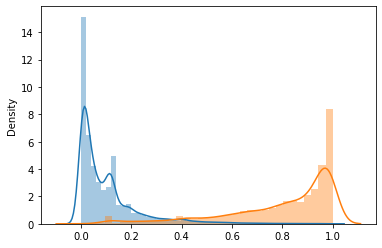

In [18]:
sns.distplot(pred_train[y_train==0], kde=True)
sns.distplot(pred_train[y_train==1], kde=True)

<AxesSubplot:ylabel='Density'>

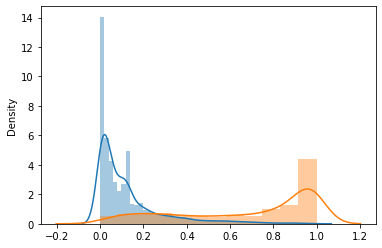

In [19]:
sns.distplot(pred_test[y_test==0], kde=True)
sns.distplot(pred_test[y_test==1], kde=True)

<AxesSubplot:ylabel='Density'>

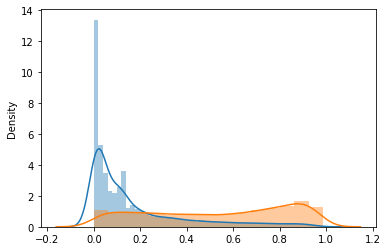

In [20]:
sns.distplot(pred_oot[y_oot==0], kde=True)
sns.distplot(pred_oot[y_oot==1], kde=True)

In [21]:
prediction_data_oot_total = data_oot.copy()
prediction_data_oot_total['pred'] = total_pred_oot

In [22]:
prediction_data_oot = data_oot_with_weight.copy()
prediction_data_oot['pred'] = pred_oot

<AxesSubplot:xlabel='pred', ylabel='Density'>

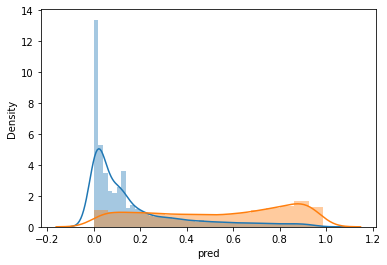

In [23]:
prediction_data_oot_grad = prediction_data_oot[prediction_data_oot.grad != 0]
sns.distplot(prediction_data_oot_grad[prediction_data_oot_grad[target] <= 1].pred, kde=True)
sns.distplot(prediction_data_oot_grad[prediction_data_oot_grad[target] >= 2].pred, kde=True)

#sns.distplot(prediction_data_oot_grad[prediction_data_oot_grad[target] == 2].pred, kde=True)
#sns.distplot(prediction_data_oot_grad[prediction_data_oot_grad[target] == 3].pred, kde=True)
#sns.distplot(prediction_data_oot_grad[prediction_data_oot_grad[target] == 4].pred, kde=True)


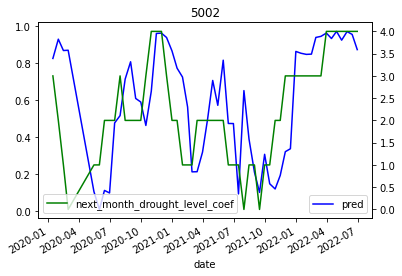

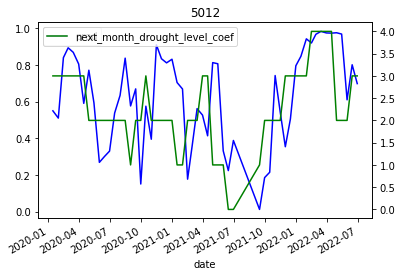

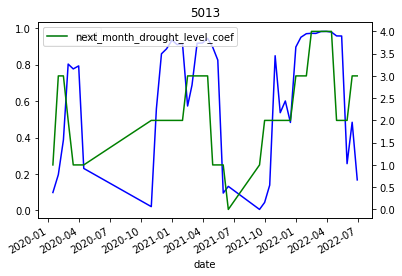

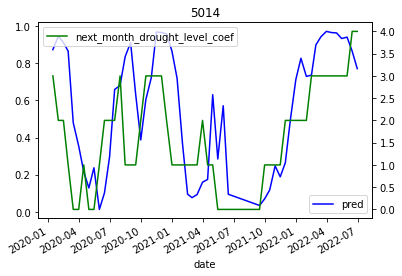

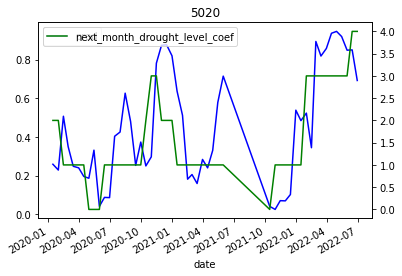

...

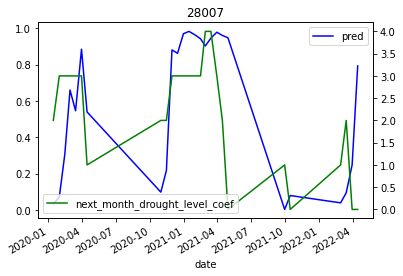

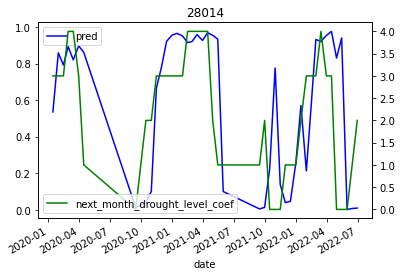

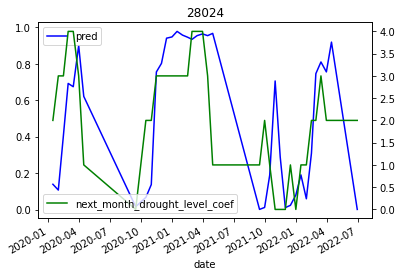

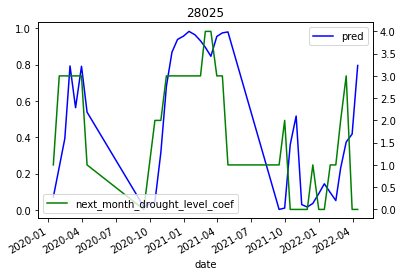

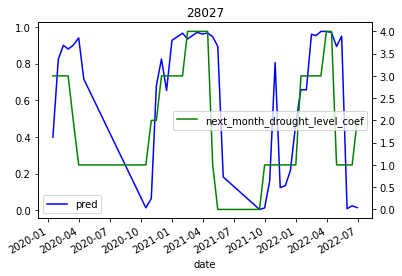

In [24]:
for mun in prediction_data_oot_grad[prediction_data_oot_grad[target] >= 4].CVE_CONCAT.unique():
    ax = prediction_data_oot_total[prediction_data_oot_total.CVE_CONCAT==mun].plot(x='date', y='pred', color='b')
    ax2 = ax.twinx()
    prediction_data_oot_total[prediction_data_oot_total.CVE_CONCAT==mun].plot(x='date', y='next_month_drought_level_coef', ax=ax2, color='g')
    #prediction_data_oot_total[prediction_data_oot_total.CVE_CONCAT==mun].plot(x='date', y='drought_level_coef', ax=ax2, color='r')
    plt.title(mun)
    plt.show()
    plt.close()

In [25]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


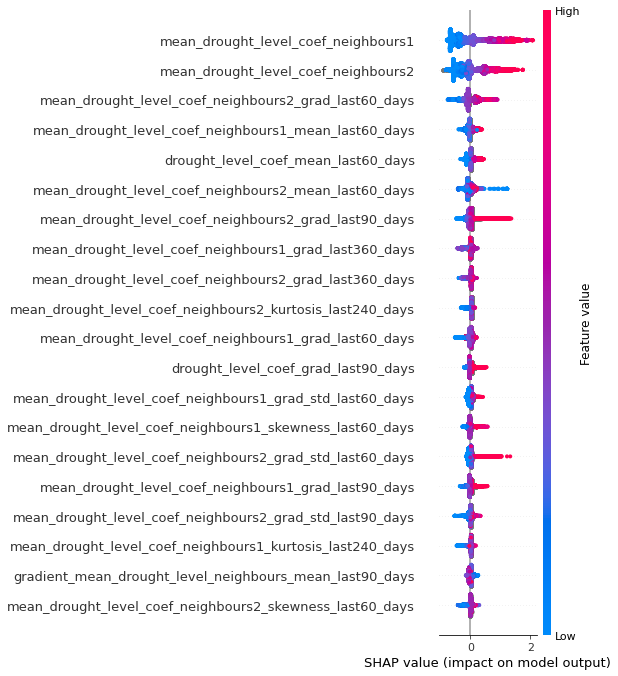

In [26]:
shap.summary_plot(shap_values, x_train)

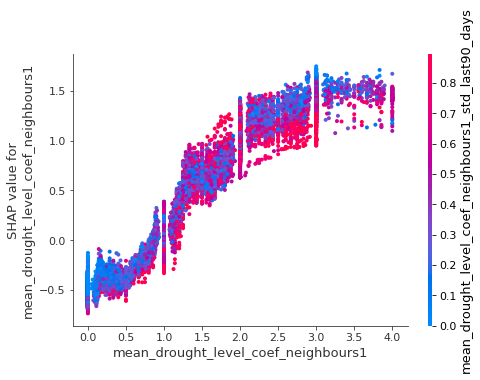

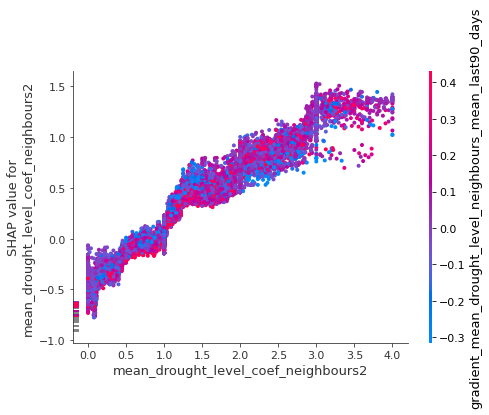

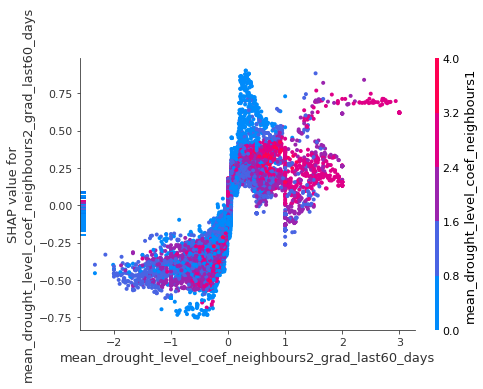

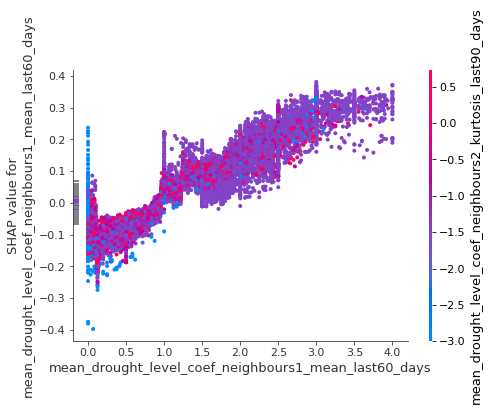

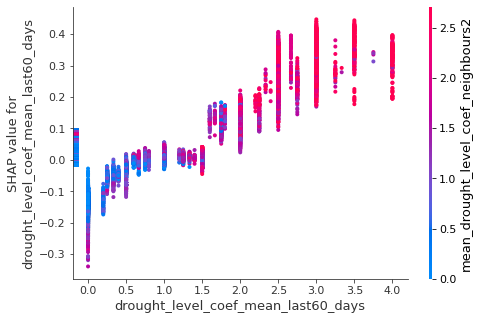

...

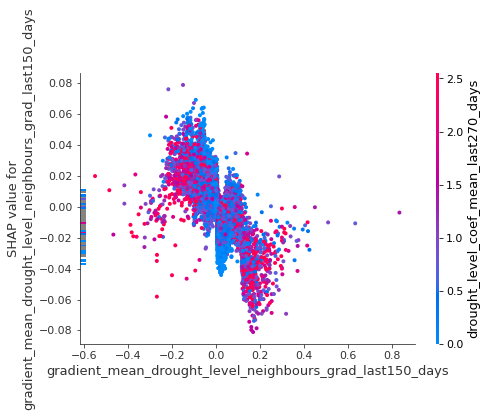

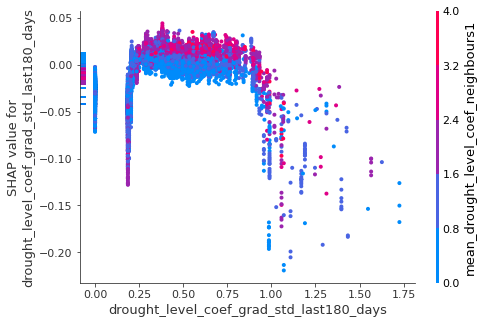

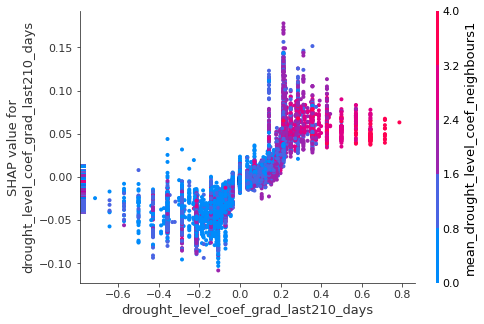

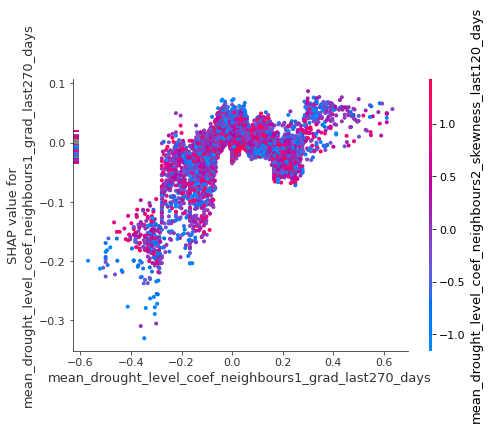

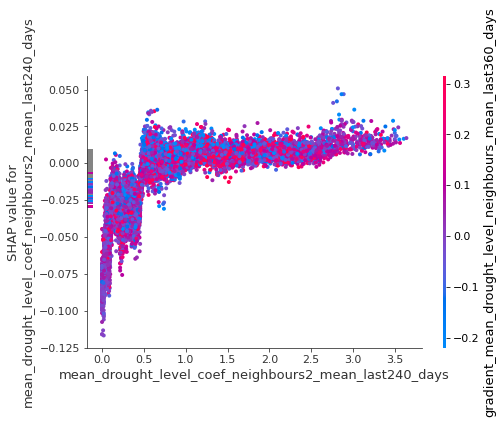

KeyboardInterrupt: 

<Figure size 540x360 with 0 Axes>

In [27]:
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))

for ind in top_inds:
    shap.dependence_plot(ind , shap_values, x_train)

In [ ]:
oot = {}
shap_values_oot = {}
for i in range(5):
    oot[f'{i}'] = prediction_data_oot_grad[prediction_data_oot_grad[target] == i]
    shap_values_oot[f'{i}'] = explainer.shap_values(oot[f'{i}'][feature_columns])
    shap.summary_plot(shap_values_oot[f'{i}'], np.array(oot[f'{i}'][feature_columns]))

In [ ]:
 shap.summary_plot(shap_values_oot[f'{i}'], np.array(oot[f'{i}'][feature_columns]))

In [29]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


In [57]:
space = {
    'n_estimators': hp.quniform('n_estimators', 100, 10000, 100),
    'reg_alpha': hp.quniform('reg_alpha', 40, 180, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0, 1),
    'gamma': hp.quniform ('gamma', 1, 9, 1),
    'eta': hp.quniform('eta', 0.025, 0.5, 0.025),
    'max_depth': hp.choice('max_depth', np.arange(1, 14, dtype=int)),
    'min_child_weight': hp.quniform('min_child_weight', 1, 6, 1),
    'subsample': hp.quniform('subsample', 0.5, 1, 0.05),
    'colsample_bytree': hp.quniform('colsample_bytree', 0.5, 1, 0.05),
    'nthread': 4,
    'seed': 42,
}

In [58]:
def hyperparameter_tuning(space):
    model = XGBClassifier(
        n_estimators=int(space['n_estimators']),
        max_depth=space['max_depth'], 
        reg_alpha=space['reg_alpha'],
        reg_lambda=space['reg_lambda'],
        gamma=space['gamma'],
        eta=space['eta'],
        min_child_weight=space['min_child_weight'],
        subsample=space['subsample'],
        colsample_bytree=space['colsample_bytree'],
    )
    evaluation_sets = [
        (x_train, y_train),
        (x_dev, y_dev)
    ]
    evaluation_sets
    model.fit(
        x_train, y_train,
        eval_set=evaluation_sets, 
        eval_metric="auc",
        early_stopping_rounds=100,
        verbose=False
    )
    pred = model.predict_proba(x_dev)[:,1]
    score = roc_auc_score(y_dev, pred)
    print ("SCORE:", score)
    return {'loss': -score, 'status': STATUS_OK, 'model': model}

In [65]:
trials_obj = Trials()
best = fmin(
    fn=hyperparameter_tuning,
    space=space,
    algo=tpe.suggest,
    max_evals=200,
    trials=trials_obj,
)

  0%|                                                                   | 0/200 [00:00<?, ?trial/s, best loss=?]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8724787521573479                                                                                              
  0%|▏                                    | 1/200 [02:55<9:42:46, 175.71s/trial, best loss: -0.8724787521573479]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8672538037325711                                                                                              
  1%|▎                                    | 2/200 [04:00<6:04:46, 110.54s/trial, best loss: -0.8724787521573479]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8736043562626784                                                                                              
  2%|▌                                     | 3/200 [05:13<5:05:59, 93.19s/trial, best loss: -0.8736043562626784]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8751781428322412                                                                                              
  2%|▊                                     | 4/200 [05:24<3:18:57, 60.91s/trial, best loss: -0.8751781428322412]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8684972119688997                                                                                              
  2%|▉                                     | 5/200 [05:43<2:28:54, 45.82s/trial, best loss: -0.8751781428322412]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8882283982660764                                                                                              
  3%|█▏                                    | 6/200 [06:16<2:13:42, 41.35s/trial, best loss: -0.8882283982660764]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8927691728617593                                                                                              
  4%|█▎                                   | 7/200 [10:27<5:53:30, 109.90s/trial, best loss: -0.8927691728617593]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8912954240278287                                                                                              
  4%|█▍                                  | 8/200 [18:27<12:08:32, 227.67s/trial, best loss: -0.8927691728617593]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8885987629608488                                                                                              
  4%|█▋                                   | 9/200 [19:27<9:18:27, 175.43s/trial, best loss: -0.8927691728617593]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8846038141721243                                                                                              
  5%|█▊                                 | 10/200 [23:39<10:30:16, 199.04s/trial, best loss: -0.8927691728617593]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8985907082231114                                                                                              
  6%|█▉                                  | 11/200 [25:37<9:09:10, 174.34s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8824038938575203                                                                                              
  6%|██▏                                 | 12/200 [27:07<7:45:25, 148.54s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8825328079716045                                                                                              
  6%|██▎                                 | 13/200 [27:32<5:46:01, 111.02s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8518427726686754                                                                                              
  7%|██▌                                  | 14/200 [27:55<4:21:34, 84.38s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8879246934698202                                                                                              
  8%|██▊                                  | 15/200 [28:34<3:38:24, 70.83s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8947096846488767                                                                                              
  8%|██▉                                  | 16/200 [30:12<4:02:42, 79.14s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8696518840041145                                                                                              
  8%|███▏                                 | 17/200 [30:45<3:18:14, 65.00s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8751499368838027                                                                                              
  9%|███▎                                 | 18/200 [31:15<2:46:05, 54.76s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8840030131040335                                                                                              
 10%|███▌                                 | 19/200 [32:03<2:39:04, 52.73s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.877934807385457                                                                                               
 10%|███▋                                 | 20/200 [33:14<2:53:48, 57.94s/trial, best loss: -0.8985907082231114]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9065436842619428                                                                                              
 10%|███▉                                 | 21/200 [34:24<3:04:17, 61.78s/trial, best loss: -0.9065436842619428]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9090121596849362                                                                                              
 11%|████                                 | 22/200 [36:00<3:33:28, 71.96s/trial, best loss: -0.9090121596849362]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9128683294608019                                                                                              
 12%|████▎                                | 23/200 [38:02<4:16:36, 86.99s/trial, best loss: -0.9128683294608019]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8687776432661051                                                                                              
 12%|████▍                                | 24/200 [38:12<3:07:39, 63.98s/trial, best loss: -0.9128683294608019]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.91516005079944                                                                                                
 12%|████▉                                  | 25/200 [40:00<3:44:28, 76.96s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8914089661394533                                                                                              
 13%|█████                                  | 26/200 [41:19<3:45:31, 77.77s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8761929344338601                                                                                              
 14%|█████▎                                 | 27/200 [41:26<2:42:43, 56.43s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8973617621199379                                                                                              
 14%|█████▍                                 | 28/200 [41:38<2:03:57, 43.24s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.857073563412144                                                                                               
 14%|█████▋                                 | 29/200 [41:45<1:32:21, 32.41s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9120260778120229                                                                                              
 15%|█████▊                                 | 30/200 [43:51<2:51:11, 60.42s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8748825789718668                                                                                              
 16%|██████                                 | 31/200 [44:01<2:07:29, 45.26s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9101591217749923                                                                                              
 16%|██████▏                                | 32/200 [45:15<2:31:02, 53.94s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8854618688140858                                                                                              
 16%|██████▍                                | 33/200 [45:46<2:10:35, 46.92s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8820218924132225                                                                                              
 17%|██████▋                                | 34/200 [46:00<1:42:21, 37.00s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8669004871152928                                                                                              
 18%|██████▊                                | 35/200 [46:32<1:37:29, 35.45s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8854024399821474                                                                                              
 18%|███████                                | 36/200 [46:44<1:17:38, 28.41s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8939929949641129                                                                                              
 18%|███████▏                               | 37/200 [47:21<1:24:44, 31.19s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9022071992690397                                                                                              
 19%|███████▍                               | 38/200 [47:54<1:25:35, 31.70s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8795488197558485                                                                                              
 20%|███████▌                               | 39/200 [48:04<1:07:53, 25.30s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8763060455547617                                                                                              
 20%|███████▊                               | 40/200 [48:32<1:09:23, 26.02s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8996870528471248                                                                                              
 20%|███████▉                               | 41/200 [49:48<1:48:55, 41.10s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8994576700066851                                                                                              
 21%|████████▏                              | 42/200 [50:27<1:46:35, 40.48s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9050125657739732                                                                                              
 22%|████████▍                              | 43/200 [52:01<2:27:44, 56.46s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8959812988336433                                                                                              
 22%|████████▌                              | 44/200 [52:22<1:58:55, 45.74s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8496731174804091                                                                                              
 22%|████████▊                              | 45/200 [52:32<1:30:16, 34.94s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.880224996312635                                                                                               
 23%|████████▉                              | 46/200 [52:55<1:20:26, 31.34s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9002639099861509                                                                                              
 24%|█████████▏                             | 47/200 [54:44<2:19:24, 54.67s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8677040932625615                                                                                              
 24%|█████████▎                             | 48/200 [54:49<1:40:55, 39.84s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9020721076212569                                                                                              
 24%|█████████▌                             | 49/200 [55:17<1:31:32, 36.37s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8748299981036407                                                                                              
 25%|█████████▊                             | 50/200 [56:03<1:38:15, 39.30s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8565235234736702                                                                                              
 26%|█████████▉                             | 51/200 [56:32<1:29:40, 36.11s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8898660672383837                                                                                              
 26%|██████████▏                            | 52/200 [57:32<1:46:54, 43.34s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8788143636757186                                                                                              
 26%|██████████▎                            | 53/200 [58:02<1:36:05, 39.22s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8818156394082594                                                                                              
 27%|██████████▌                            | 54/200 [58:26<1:24:04, 34.55s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.909617797426698                                                                                               
 28%|██████████▋                            | 55/200 [59:26<1:41:55, 42.18s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8908112298942829                                                                                              
 28%|██████████                          | 56/200 [1:05:18<5:24:37, 135.26s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8731761430352857                                                                                              
 28%|██████████▌                          | 57/200 [1:05:26<3:51:33, 97.16s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8900468439028222                                                                                              
 29%|██████████▋                          | 58/200 [1:06:12<3:13:23, 81.72s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8930141192560909                                                                                              
 30%|██████████▌                         | 59/200 [1:08:40<3:58:39, 101.56s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8739249175849962                                                                                              
 30%|███████████                          | 60/200 [1:08:52<2:54:09, 74.64s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8963294914501019                                                                                              
 30%|███████████▎                         | 61/200 [1:09:33<2:30:09, 64.81s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8502142023894126                                                                                              
 31%|███████████▍                         | 62/200 [1:09:44<1:51:29, 48.48s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8940281925398379                                                                                              
 32%|███████████▋                         | 63/200 [1:11:07<2:14:27, 58.88s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.864383405516298                                                                                               
 32%|███████████▊                         | 64/200 [1:11:38<1:54:12, 50.39s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8954737833131884                                                                                              
 32%|████████████                         | 65/200 [1:12:19<1:47:13, 47.66s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9058310171572618                                                                                              
 33%|████████████▏                        | 66/200 [1:15:19<3:15:07, 87.37s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9132733649648599                                                                                              
 34%|████████████▍                        | 67/200 [1:16:49<3:15:49, 88.34s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9101645331029607                                                                                              
 34%|████████████▌                        | 68/200 [1:18:07<3:07:05, 85.04s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9111915361084028                                                                                              
 34%|████████████▊                        | 69/200 [1:20:11<3:31:19, 96.79s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9150846753107442                                                                                              
 35%|████████████▉                        | 70/200 [1:21:45<3:27:45, 95.89s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9053427046679168                                                                                              
 36%|█████████████▏                       | 71/200 [1:23:21<3:26:36, 96.10s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9091356624710517                                                                                              
 36%|█████████████▎                       | 72/200 [1:24:37<3:12:10, 90.08s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9087473877173391                                                                                              
 36%|█████████████▌                       | 73/200 [1:26:27<3:22:43, 95.78s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.895959318306762                                                                                               
 37%|█████████████▋                       | 74/200 [1:27:01<2:42:30, 77.38s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9142209220136654                                                                                              
 38%|█████████████▉                       | 75/200 [1:29:09<3:12:45, 92.52s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9108711184496592                                                                                              
 38%|█████████████▋                      | 76/200 [1:31:08<3:27:30, 100.41s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8891695862297507                                                                                              
 38%|█████████████▊                      | 77/200 [1:33:01<3:33:38, 104.22s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8831808264678108                                                                                              
 39%|██████████████▍                      | 78/200 [1:33:55<3:01:19, 89.18s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9108709268982267                                                                                              
 40%|██████████████▏                     | 79/200 [1:36:17<3:31:55, 105.08s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9008047554558636                                                                                              
 40%|██████████████▍                     | 80/200 [1:39:40<4:28:40, 134.34s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8948256211534078                                                                                              
 40%|██████████████▌                     | 81/200 [1:40:08<3:23:33, 102.64s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.875059237280506                                                                                               
 41%|███████████████▏                     | 82/200 [1:40:22<2:29:10, 75.86s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9082928840558335                                                                                              
 42%|███████████████▎                     | 83/200 [1:42:31<2:59:05, 91.85s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8840858590985972                                                                                              
 42%|███████████████▌                     | 84/200 [1:43:29<2:38:08, 81.80s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9041161050697917                                                                                              
 42%|███████████████▋                     | 85/200 [1:44:28<2:23:38, 74.95s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8498228628127795                                                                                              
 43%|███████████████▉                     | 86/200 [1:44:35<1:43:41, 54.57s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9006054461903293                                                                                              
 44%|████████████████                     | 87/200 [1:45:40<1:48:45, 57.75s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9041875537541209                                                                                              
 44%|████████████████▎                    | 88/200 [1:46:56<1:57:34, 62.99s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9120724811465502                                                                                              
 44%|████████████████▍                    | 89/200 [1:47:48<1:50:41, 59.83s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8972917021834946                                                                                              
 45%|████████████████▋                    | 90/200 [1:50:10<2:34:52, 84.47s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8692416766113785                                                                                              
 46%|████████████████▊                    | 91/200 [1:50:40<2:03:32, 68.00s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9055536506829766                                                                                              
 46%|█████████████████                    | 92/200 [1:52:02<2:10:13, 72.34s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9099710661561182                                                                                              
 46%|████████████████▋                   | 93/200 [1:54:59<3:05:12, 103.86s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9029952897502744                                                                                              
 47%|████████████████▉                   | 94/200 [1:56:54<3:08:56, 106.95s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8699796285051518                                                                                              
 48%|█████████████████▌                   | 95/200 [1:57:01<2:14:54, 77.09s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8894123776704663                                                                                              
 48%|█████████████████▊                   | 96/200 [1:57:22<1:44:28, 60.27s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8939592340241316                                                                                              
 48%|█████████████████▉                   | 97/200 [1:57:56<1:30:01, 52.44s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8752933131310422                                                                                              
 49%|██████████████████▏                  | 98/200 [1:58:25<1:17:04, 45.34s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.888823931669773                                                                                               
 50%|██████████████████▎                  | 99/200 [2:01:30<2:27:02, 87.35s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8823888570700675                                                                                              
 50%|██████████████████                  | 100/200 [2:01:54<1:53:36, 68.17s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9012555238644353                                                                                              
 50%|██████████████████▏                 | 101/200 [2:02:49<1:46:00, 64.25s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8483172685531928                                                                                              
 51%|██████████████████▎                 | 102/200 [2:03:06<1:21:47, 50.07s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8923328186984846                                                                                              
 52%|██████████████████▌                 | 103/200 [2:03:48<1:17:16, 47.80s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8805078220027469                                                                                              
 52%|██████████████████▋                 | 104/200 [2:04:12<1:04:57, 40.60s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8852216633177092                                                                                              
 52%|██████████████████▉                 | 105/200 [2:05:17<1:15:35, 47.75s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9032418643317826                                                                                              
 53%|███████████████████                 | 106/200 [2:05:57<1:11:08, 45.41s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8658313906825552                                                                                              
 54%|████████████████████▎                 | 107/200 [2:06:05<53:12, 34.33s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.898157370994899                                                                                               
 54%|███████████████████▍                | 108/200 [2:08:09<1:33:46, 61.16s/trial, best loss: -0.91516005079944]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9155831879138708                                                                                              
 55%|█████████████████▉               | 109/200 [2:11:56<2:48:20, 110.99s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8990091523274457                                                                                              
 55%|██████████████████▏              | 110/200 [2:15:53<3:43:06, 148.74s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8936311543080876                                                                                              
 56%|██████████████████▎              | 111/200 [2:21:21<5:00:38, 202.68s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9030156420899794                                                                                              
 56%|██████████████████▍              | 112/200 [2:24:37<4:54:04, 200.51s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8964316841393499                                                                                              
 56%|██████████████████▋              | 113/200 [2:25:43<3:52:13, 160.16s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8726295510225973                                                                                              
 57%|██████████████████▊              | 114/200 [2:26:03<2:49:33, 118.29s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9143634362794583                                                                                              
 57%|██████████████████▉              | 115/200 [2:32:01<4:29:19, 190.12s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8854410854836579                                                                                              
 58%|███████████████████▏             | 116/200 [2:32:14<3:11:39, 136.90s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8827275200027584                                                                                              
 58%|███████████████████▎             | 117/200 [2:33:45<2:50:11, 123.03s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9013331500824631                                                                                              
 59%|███████████████████▍             | 118/200 [2:37:57<3:41:04, 161.76s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.877069569564776                                                                                               
 60%|███████████████████▋             | 119/200 [2:38:13<2:39:26, 118.11s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8594440123895466                                                                                              
 60%|████████████████████▍             | 120/200 [2:38:44<2:02:34, 91.93s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8903754024974475                                                                                              
 60%|████████████████████▌             | 121/200 [2:39:42<1:47:35, 81.72s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8708926105203878                                                                                              
 61%|████████████████████▋             | 122/200 [2:39:58<1:20:33, 61.97s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9079438773457869                                                                                              
 62%|████████████████████▎            | 123/200 [2:45:07<2:54:52, 136.27s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8996293000902207                                                                                              
 62%|████████████████████▍            | 124/200 [2:47:51<3:02:53, 144.39s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8893869971056579                                                                                              
 62%|████████████████████▋            | 125/200 [2:48:20<2:17:16, 109.82s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8869460093132306                                                                                              
 63%|█████████████████████▍            | 126/200 [2:49:12<1:54:17, 92.67s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8737464874256062                                                                                              
 64%|█████████████████████▌            | 127/200 [2:49:35<1:27:13, 71.69s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8922815308024281                                                                                              
 64%|█████████████████████▊            | 128/200 [2:51:49<1:48:20, 90.29s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8974995833756344                                                                                              
 64%|█████████████████████▉            | 129/200 [2:53:07<1:42:32, 86.65s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9050292307486021                                                                                              
 65%|█████████████████████▍           | 130/200 [2:55:37<2:03:19, 105.71s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8928733289531906                                                                                              
 66%|█████████████████████▌           | 131/200 [2:59:08<2:37:45, 137.18s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8982541044683203                                                                                              
 66%|█████████████████████▊           | 132/200 [3:00:13<2:10:53, 115.49s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8832252185122966                                                                                              
 66%|██████████████████████▌           | 133/200 [3:00:26<1:34:45, 84.85s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8661597577257482                                                                                              
 67%|██████████████████████▊           | 134/200 [3:02:16<1:41:41, 92.45s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9063974347432158                                                                                              
 68%|██████████████████████▎          | 135/200 [3:04:54<2:01:15, 111.93s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8874651615832109                                                                                              
 68%|███████████████████████           | 136/200 [3:05:59<1:44:23, 97.86s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9081651192503444                                                                                              
 68%|███████████████████████▎          | 137/200 [3:07:42<1:44:22, 99.40s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9028288794432747                                                                                              
 69%|███████████████████████▍          | 138/200 [3:07:57<1:16:35, 74.12s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8706671544843149                                                                                              
 70%|███████████████████████▋          | 139/200 [3:08:22<1:00:20, 59.35s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8600317400723682                                                                                              
 70%|█████████████████████████▏          | 140/200 [3:08:55<51:26, 51.43s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8657359022934452                                                                                              
 70%|█████████████████████████▍          | 141/200 [3:09:04<38:05, 38.74s/trial, best loss: -0.9155831879138708]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9157777083935922                                                                                              
 71%|█████████████████████████▌          | 142/200 [3:10:45<55:42, 57.62s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8950447081043496                                                                                              
 72%|█████████████████████████▋          | 143/200 [3:11:19<47:54, 50.42s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8722406537267289                                                                                              
 72%|█████████████████████████▉          | 144/200 [3:11:33<36:46, 39.40s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9107619820209825                                                                                              
 72%|██████████████████████████          | 145/200 [3:12:37<42:52, 46.78s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9152631054701343                                                                                              
 73%|██████████████████████████▎         | 146/200 [3:13:37<45:50, 50.94s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9131410987007066                                                                                              
 74%|██████████████████████████▍         | 147/200 [3:14:41<48:17, 54.67s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9122140376551805                                                                                              
 74%|██████████████████████████▋         | 148/200 [3:16:24<59:57, 69.19s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9087885712753302                                                                                              
 74%|█████████████████████████▎        | 149/200 [3:17:45<1:01:56, 72.87s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9145376523073327                                                                                              
 75%|█████████████████████████▌        | 150/200 [3:18:56<1:00:16, 72.34s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9031331110059706                                                                                              
 76%|█████████████████████████▋        | 151/200 [3:20:29<1:03:57, 78.31s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9077897742183264                                                                                              
 76%|███████████████████████████▎        | 152/200 [3:21:14<54:41, 68.36s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9043756093729947                                                                                              
 76%|███████████████████████████▌        | 153/200 [3:22:14<51:42, 66.02s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8716701177849759                                                                                              
 77%|███████████████████████████▋        | 154/200 [3:23:36<54:09, 70.64s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9065677718545817                                                                                              
 78%|██████████████████████████▎       | 155/200 [3:25:19<1:00:26, 80.59s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9101826826011918                                                                                              
 78%|████████████████████████████        | 156/200 [3:26:36<58:16, 79.46s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9097929233238772                                                                                              
 78%|████████████████████████████▎       | 157/200 [3:27:48<55:17, 77.15s/trial, best loss: -0.9157777083935922]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9160101081690939                                                                                              
 79%|████████████████████████████▍       | 158/200 [3:28:52<51:20, 73.34s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9115659233832579                                                                                              
 80%|████████████████████████████▌       | 159/200 [3:29:48<46:28, 68.01s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9036392377785396                                                                                              
 80%|████████████████████████████▊       | 160/200 [3:30:26<39:17, 58.95s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9104643110948505                                                                                              
 80%|████████████████████████████▉       | 161/200 [3:31:10<35:25, 54.50s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9069204180418462                                                                                              
 81%|█████████████████████████████▏      | 162/200 [3:32:01<33:53, 53.52s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9139878518081497                                                                                              
 82%|█████████████████████████████▎      | 163/200 [3:33:16<36:57, 59.94s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.91075360164581                                                                                                
 82%|█████████████████████████████▌      | 164/200 [3:34:48<41:47, 69.64s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9089003415362041                                                                                              
 82%|█████████████████████████████▋      | 165/200 [3:35:36<36:47, 63.08s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8877693452580486                                                                                              
 83%|█████████████████████████████▉      | 166/200 [3:36:37<35:23, 62.46s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.900239918169228                                                                                               
 84%|██████████████████████████████      | 167/200 [3:37:04<28:26, 51.72s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9029891601044339                                                                                              
 84%|██████████████████████████████▏     | 168/200 [3:38:19<31:17, 58.66s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9151786791762522                                                                                              
 84%|██████████████████████████████▍     | 169/200 [3:40:59<46:07, 89.29s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9073134336935139                                                                                              
 85%|██████████████████████████████▌     | 170/200 [3:42:58<49:01, 98.05s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8849530124336035                                                                                              
 86%|██████████████████████████████▊     | 171/200 [3:43:41<39:27, 81.64s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9001302549741118                                                                                              
 86%|██████████████████████████████▉     | 172/200 [3:44:48<36:00, 77.15s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8697413864109582                                                                                              
 86%|███████████████████████████████▏    | 173/200 [3:45:00<25:59, 57.76s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9062233144910574                                                                                              
 87%|███████████████████████████████▎    | 174/200 [3:47:07<33:59, 78.45s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8585265289156465                                                                                              
 88%|███████████████████████████████▌    | 175/200 [3:47:46<27:40, 66.41s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9061514348160054                                                                                              
 88%|███████████████████████████████▋    | 176/200 [3:49:41<32:28, 81.18s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8888581714883355                                                                                              
 88%|███████████████████████████████▊    | 177/200 [3:50:14<25:30, 66.55s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8883361459468674                                                                                              
 89%|████████████████████████████████    | 178/200 [3:51:56<28:23, 77.43s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.876263569024601                                                                                               
 90%|████████████████████████████████▏   | 179/200 [3:52:28<22:19, 63.79s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9136174392255192                                                                                              
 90%|████████████████████████████████▍   | 180/200 [3:53:41<22:11, 66.56s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8739491009533514                                                                                              
 90%|████████████████████████████████▌   | 181/200 [3:54:02<16:42, 52.77s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9090084723198604                                                                                              
 91%|████████████████████████████████▊   | 182/200 [3:55:37<19:35, 65.33s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8866950769366329                                                                                              
 92%|████████████████████████████████▉   | 183/200 [3:56:14<16:09, 57.01s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9116227183829995                                                                                              
 92%|█████████████████████████████████   | 184/200 [3:57:21<15:57, 59.85s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8776642409870261                                                                                              
 92%|█████████████████████████████████▎  | 185/200 [3:57:49<12:38, 50.53s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9111981925206828                                                                                              
 93%|█████████████████████████████████▍  | 186/200 [3:59:08<13:44, 58.89s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8924926204810621                                                                                              
 94%|█████████████████████████████████▋  | 187/200 [4:00:15<13:19, 61.50s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9012669690625281                                                                                              
 94%|█████████████████████████████████▊  | 188/200 [4:01:00<11:15, 56.31s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8487032446897154                                                                                              
 94%|██████████████████████████████████  | 189/200 [4:01:13<07:58, 43.51s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8887895002997779                                                                                              
 95%|██████████████████████████████████▏ | 190/200 [4:01:32<06:02, 36.21s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8907695195698521                                                                                              
 96%|██████████████████████████████████▍ | 191/200 [4:03:18<08:31, 56.88s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8998832494018806                                                                                              
 96%|██████████████████████████████████▌ | 192/200 [4:03:46<06:27, 48.42s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8978327870924983                                                                                              
 96%|██████████████████████████████████▋ | 193/200 [4:04:25<05:19, 45.62s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8955175049276607                                                                                              
 97%|██████████████████████████████████▉ | 194/200 [4:05:15<04:41, 46.90s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.882147262825805                                                                                               
 98%|███████████████████████████████████ | 195/200 [4:06:09<04:04, 49.00s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9023234709885778                                                                                              
 98%|███████████████████████████████████▎| 196/200 [4:07:51<04:19, 64.84s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9136848653297653                                                                                              
 98%|███████████████████████████████████▍| 197/200 [4:09:19<03:35, 71.79s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.9050321040200899                                                                                              
 99%|███████████████████████████████████▋| 198/200 [4:10:49<02:34, 77.35s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.8883810168699348                                                                                              
100%|███████████████████████████████████▊| 199/200 [4:12:02<01:15, 75.89s/trial, best loss: -0.9160101081690939]

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



SCORE:                                                                                                          
0.909865138213936                                                                                               
100%|████████████████████████████████████| 200/200 [4:13:43<00:00, 76.12s/trial, best loss: -0.9160101081690939]


In [71]:
import pickle
with open('../models/trials.pkl', 'wb') as file:
    pickle.dump(trials_obj, file)
    
with open('../models/best_hyperparameters.pkl', 'wb') as file:
    pickle.dump(best, file)

In [117]:
trial_vals = pd.DataFrame(list(pd.DataFrame(trials_obj.trials)['misc'].apply(lambda x: x['vals'])))
trial_vals = trial_vals.applymap(lambda x: x[0])
trial_vals['result'] = (-1 * pd.DataFrame(trials_obj.trials)['result'].apply(lambda x: x['loss'])).astype(float)

In [118]:
from pandas.plotting import parallel_coordinates

In [119]:
trial_vals.loc[trial_vals.result >= trial_vals.result.mean(),'params_tag'] = 1
trial_vals.loc[trial_vals.result < trial_vals.result.mean(),'params_tag'] = 0

In [126]:
import plotly.express as px

fig = px.parallel_coordinates(
    trial_vals, 
    color="params_tag", 
    labels={"1": "Best Params","0": "Good Params"},
    color_continuous_scale=px.colors.diverging.Tealrose,
    color_continuous_midpoint=2)
fig.update_layout(coloraxis_showscale=False)
fig.show()


In [131]:
best['n_estimators'] = int(best['n_estimators'])

In [133]:
best_model = XGBClassifier(**best)
best_model.fit(
    x_train, y_train, 
    sample_weight=abs(w_train),
    eval_set=[(x_train, y_train), (x_test, y_test), (x_dev, y_dev)],
    sample_weight_eval_set = [abs(w_train), abs(w_test), abs(w_dev)],
    eval_metric=['aucpr', 'auc'],
    early_stopping_rounds=500,
)

[0]	validation_0-aucpr:0.68770	validation_0-auc:0.81520	validation_1-aucpr:0.67239	validation_1-auc:0.80150	validation_2-aucpr:0.65948	validation_2-auc:0.79887
[1]	validation_0-aucpr:0.72789	validation_0-auc:0.84623	validation_1-aucpr:0.70933	validation_1-auc:0.83001	validation_2-aucpr:0.69757	validation_2-auc:0.82444
[2]	validation_0-aucpr:0.74771	validation_0-auc:0.85425	validation_1-aucpr:0.72316	validation_1-auc:0.83510	validation_2-aucpr:0.71530	validation_2-auc:0.83265
[3]	validation_0-aucpr:0.76284	validation_0-auc:0.86242	validation_1-aucpr:0.73301	validation_1-auc:0.84051	validation_2-aucpr:0.72533	validation_2-auc:0.83854
[4]	validation_0-aucpr:0.77774	validation_0-auc:0.87261	validation_1-aucpr:0.74724	validation_1-auc:0.85067	validation_2-aucpr:0.74044	validation_2-auc:0.84621
[5]	validation_0-aucpr:0.78566	validation_0-auc:0.87728	validation_1-aucpr:0.75023	validation_1-auc:0.85070	validation_2-aucpr:0.74577	validation_2-auc:0.84797
[6]	validation_0-aucpr:0.79411	validatio

[51]	validation_0-aucpr:0.89072	validation_0-auc:0.94721	validation_1-aucpr:0.80621	validation_1-auc:0.89148	validation_2-aucpr:0.80514	validation_2-auc:0.89287
[52]	validation_0-aucpr:0.89127	validation_0-auc:0.94762	validation_1-aucpr:0.80616	validation_1-auc:0.89139	validation_2-aucpr:0.80513	validation_2-auc:0.89297
[53]	validation_0-aucpr:0.89189	validation_0-auc:0.94798	validation_1-aucpr:0.80671	validation_1-auc:0.89174	validation_2-aucpr:0.80564	validation_2-auc:0.89332
[54]	validation_0-aucpr:0.89263	validation_0-auc:0.94835	validation_1-aucpr:0.80706	validation_1-auc:0.89220	validation_2-aucpr:0.80584	validation_2-auc:0.89359
[55]	validation_0-aucpr:0.89356	validation_0-auc:0.94874	validation_1-aucpr:0.80753	validation_1-auc:0.89266	validation_2-aucpr:0.80589	validation_2-auc:0.89378
[56]	validation_0-aucpr:0.89419	validation_0-auc:0.94914	validation_1-aucpr:0.80763	validation_1-auc:0.89275	validation_2-aucpr:0.80617	validation_2-auc:0.89379
[57]	validation_0-aucpr:0.89452	va

[102]	validation_0-aucpr:0.91609	validation_0-auc:0.96074	validation_1-aucpr:0.81324	validation_1-auc:0.89418	validation_2-aucpr:0.81021	validation_2-auc:0.89573
[103]	validation_0-aucpr:0.91649	validation_0-auc:0.96104	validation_1-aucpr:0.81320	validation_1-auc:0.89410	validation_2-aucpr:0.81004	validation_2-auc:0.89555
[104]	validation_0-aucpr:0.91686	validation_0-auc:0.96100	validation_1-aucpr:0.81350	validation_1-auc:0.89438	validation_2-aucpr:0.81054	validation_2-auc:0.89590
[105]	validation_0-aucpr:0.91736	validation_0-auc:0.96131	validation_1-aucpr:0.81399	validation_1-auc:0.89459	validation_2-aucpr:0.81038	validation_2-auc:0.89557
[106]	validation_0-aucpr:0.91718	validation_0-auc:0.96126	validation_1-aucpr:0.81392	validation_1-auc:0.89463	validation_2-aucpr:0.81028	validation_2-auc:0.89557
[107]	validation_0-aucpr:0.91769	validation_0-auc:0.96143	validation_1-aucpr:0.81425	validation_1-auc:0.89495	validation_2-aucpr:0.81060	validation_2-auc:0.89571
[108]	validation_0-aucpr:0.9

[153]	validation_0-aucpr:0.92953	validation_0-auc:0.96733	validation_1-aucpr:0.81758	validation_1-auc:0.89666	validation_2-aucpr:0.81390	validation_2-auc:0.89758
[154]	validation_0-aucpr:0.92953	validation_0-auc:0.96733	validation_1-aucpr:0.81758	validation_1-auc:0.89666	validation_2-aucpr:0.81390	validation_2-auc:0.89758
[155]	validation_0-aucpr:0.92943	validation_0-auc:0.96724	validation_1-aucpr:0.81757	validation_1-auc:0.89674	validation_2-aucpr:0.81330	validation_2-auc:0.89729
[156]	validation_0-aucpr:0.92981	validation_0-auc:0.96741	validation_1-aucpr:0.81767	validation_1-auc:0.89691	validation_2-aucpr:0.81378	validation_2-auc:0.89750
[157]	validation_0-aucpr:0.93002	validation_0-auc:0.96720	validation_1-aucpr:0.81800	validation_1-auc:0.89730	validation_2-aucpr:0.81437	validation_2-auc:0.89783
[158]	validation_0-aucpr:0.93035	validation_0-auc:0.96758	validation_1-aucpr:0.81785	validation_1-auc:0.89717	validation_2-aucpr:0.81400	validation_2-auc:0.89774
[159]	validation_0-aucpr:0.9

[204]	validation_0-aucpr:0.93753	validation_0-auc:0.97106	validation_1-aucpr:0.82007	validation_1-auc:0.89843	validation_2-aucpr:0.81823	validation_2-auc:0.89978
[205]	validation_0-aucpr:0.93753	validation_0-auc:0.97106	validation_1-aucpr:0.82007	validation_1-auc:0.89843	validation_2-aucpr:0.81823	validation_2-auc:0.89978
[206]	validation_0-aucpr:0.93775	validation_0-auc:0.97109	validation_1-aucpr:0.82010	validation_1-auc:0.89843	validation_2-aucpr:0.81841	validation_2-auc:0.89991
[207]	validation_0-aucpr:0.93817	validation_0-auc:0.97144	validation_1-aucpr:0.82016	validation_1-auc:0.89833	validation_2-aucpr:0.81816	validation_2-auc:0.89977
[208]	validation_0-aucpr:0.93847	validation_0-auc:0.97143	validation_1-aucpr:0.82041	validation_1-auc:0.89854	validation_2-aucpr:0.81879	validation_2-auc:0.90022
[209]	validation_0-aucpr:0.93829	validation_0-auc:0.97128	validation_1-aucpr:0.82002	validation_1-auc:0.89837	validation_2-aucpr:0.81888	validation_2-auc:0.90025
[210]	validation_0-aucpr:0.9

[255]	validation_0-aucpr:0.94212	validation_0-auc:0.97305	validation_1-aucpr:0.82063	validation_1-auc:0.89867	validation_2-aucpr:0.81930	validation_2-auc:0.89979
[256]	validation_0-aucpr:0.94221	validation_0-auc:0.97318	validation_1-aucpr:0.82064	validation_1-auc:0.89861	validation_2-aucpr:0.81944	validation_2-auc:0.89986
[257]	validation_0-aucpr:0.94221	validation_0-auc:0.97318	validation_1-aucpr:0.82064	validation_1-auc:0.89861	validation_2-aucpr:0.81944	validation_2-auc:0.89986
[258]	validation_0-aucpr:0.94240	validation_0-auc:0.97323	validation_1-aucpr:0.82059	validation_1-auc:0.89851	validation_2-aucpr:0.81972	validation_2-auc:0.90004
[259]	validation_0-aucpr:0.94252	validation_0-auc:0.97330	validation_1-aucpr:0.82049	validation_1-auc:0.89846	validation_2-aucpr:0.81959	validation_2-auc:0.89990
[260]	validation_0-aucpr:0.94262	validation_0-auc:0.97334	validation_1-aucpr:0.82052	validation_1-auc:0.89848	validation_2-aucpr:0.81955	validation_2-auc:0.89992
[261]	validation_0-aucpr:0.9

[306]	validation_0-aucpr:0.94496	validation_0-auc:0.97443	validation_1-aucpr:0.82169	validation_1-auc:0.89941	validation_2-aucpr:0.82029	validation_2-auc:0.90052
[307]	validation_0-aucpr:0.94497	validation_0-auc:0.97440	validation_1-aucpr:0.82184	validation_1-auc:0.89952	validation_2-aucpr:0.82028	validation_2-auc:0.90049
[308]	validation_0-aucpr:0.94503	validation_0-auc:0.97452	validation_1-aucpr:0.82153	validation_1-auc:0.89914	validation_2-aucpr:0.81991	validation_2-auc:0.90018
[309]	validation_0-aucpr:0.94502	validation_0-auc:0.97445	validation_1-aucpr:0.82157	validation_1-auc:0.89925	validation_2-aucpr:0.82020	validation_2-auc:0.90043
[310]	validation_0-aucpr:0.94519	validation_0-auc:0.97462	validation_1-aucpr:0.82147	validation_1-auc:0.89925	validation_2-aucpr:0.82026	validation_2-auc:0.90035
[311]	validation_0-aucpr:0.94520	validation_0-auc:0.97461	validation_1-aucpr:0.82141	validation_1-auc:0.89922	validation_2-aucpr:0.82031	validation_2-auc:0.90048
[312]	validation_0-aucpr:0.9

[357]	validation_0-aucpr:0.94801	validation_0-auc:0.97581	validation_1-aucpr:0.82175	validation_1-auc:0.89921	validation_2-aucpr:0.82133	validation_2-auc:0.90115
[358]	validation_0-aucpr:0.94812	validation_0-auc:0.97597	validation_1-aucpr:0.82177	validation_1-auc:0.89930	validation_2-aucpr:0.82091	validation_2-auc:0.90084
[359]	validation_0-aucpr:0.94804	validation_0-auc:0.97585	validation_1-aucpr:0.82177	validation_1-auc:0.89924	validation_2-aucpr:0.82106	validation_2-auc:0.90101
[360]	validation_0-aucpr:0.94804	validation_0-auc:0.97585	validation_1-aucpr:0.82177	validation_1-auc:0.89924	validation_2-aucpr:0.82106	validation_2-auc:0.90101
[361]	validation_0-aucpr:0.94813	validation_0-auc:0.97595	validation_1-aucpr:0.82180	validation_1-auc:0.89927	validation_2-aucpr:0.82083	validation_2-auc:0.90084
[362]	validation_0-aucpr:0.94813	validation_0-auc:0.97595	validation_1-aucpr:0.82180	validation_1-auc:0.89927	validation_2-aucpr:0.82083	validation_2-auc:0.90084
[363]	validation_0-aucpr:0.9

[408]	validation_0-aucpr:0.94953	validation_0-auc:0.97645	validation_1-aucpr:0.82216	validation_1-auc:0.89926	validation_2-aucpr:0.82084	validation_2-auc:0.90075
[409]	validation_0-aucpr:0.94972	validation_0-auc:0.97668	validation_1-aucpr:0.82226	validation_1-auc:0.89920	validation_2-aucpr:0.82101	validation_2-auc:0.90098
[410]	validation_0-aucpr:0.94972	validation_0-auc:0.97668	validation_1-aucpr:0.82226	validation_1-auc:0.89920	validation_2-aucpr:0.82101	validation_2-auc:0.90098
[411]	validation_0-aucpr:0.94960	validation_0-auc:0.97660	validation_1-aucpr:0.82229	validation_1-auc:0.89922	validation_2-aucpr:0.82125	validation_2-auc:0.90114
[412]	validation_0-aucpr:0.94962	validation_0-auc:0.97663	validation_1-aucpr:0.82226	validation_1-auc:0.89916	validation_2-aucpr:0.82125	validation_2-auc:0.90113
[413]	validation_0-aucpr:0.94962	validation_0-auc:0.97663	validation_1-aucpr:0.82226	validation_1-auc:0.89916	validation_2-aucpr:0.82125	validation_2-auc:0.90113
[414]	validation_0-aucpr:0.9

[459]	validation_0-aucpr:0.95085	validation_0-auc:0.97721	validation_1-aucpr:0.82295	validation_1-auc:0.89961	validation_2-aucpr:0.82206	validation_2-auc:0.90155
[460]	validation_0-aucpr:0.95085	validation_0-auc:0.97721	validation_1-aucpr:0.82295	validation_1-auc:0.89961	validation_2-aucpr:0.82206	validation_2-auc:0.90155
[461]	validation_0-aucpr:0.95085	validation_0-auc:0.97721	validation_1-aucpr:0.82295	validation_1-auc:0.89961	validation_2-aucpr:0.82206	validation_2-auc:0.90155
[462]	validation_0-aucpr:0.95085	validation_0-auc:0.97721	validation_1-aucpr:0.82295	validation_1-auc:0.89961	validation_2-aucpr:0.82206	validation_2-auc:0.90155
[463]	validation_0-aucpr:0.95085	validation_0-auc:0.97721	validation_1-aucpr:0.82295	validation_1-auc:0.89961	validation_2-aucpr:0.82206	validation_2-auc:0.90155
[464]	validation_0-aucpr:0.95105	validation_0-auc:0.97735	validation_1-aucpr:0.82302	validation_1-auc:0.89958	validation_2-aucpr:0.82222	validation_2-auc:0.90169
[465]	validation_0-aucpr:0.9

[510]	validation_0-aucpr:0.95170	validation_0-auc:0.97748	validation_1-aucpr:0.82334	validation_1-auc:0.89997	validation_2-aucpr:0.82271	validation_2-auc:0.90200
[511]	validation_0-aucpr:0.95164	validation_0-auc:0.97742	validation_1-aucpr:0.82346	validation_1-auc:0.90006	validation_2-aucpr:0.82283	validation_2-auc:0.90205
[512]	validation_0-aucpr:0.95176	validation_0-auc:0.97743	validation_1-aucpr:0.82359	validation_1-auc:0.90009	validation_2-aucpr:0.82296	validation_2-auc:0.90217
[513]	validation_0-aucpr:0.95216	validation_0-auc:0.97775	validation_1-aucpr:0.82351	validation_1-auc:0.90009	validation_2-aucpr:0.82297	validation_2-auc:0.90215
[514]	validation_0-aucpr:0.95216	validation_0-auc:0.97775	validation_1-aucpr:0.82351	validation_1-auc:0.90009	validation_2-aucpr:0.82297	validation_2-auc:0.90215
[515]	validation_0-aucpr:0.95216	validation_0-auc:0.97775	validation_1-aucpr:0.82351	validation_1-auc:0.90009	validation_2-aucpr:0.82297	validation_2-auc:0.90215
[516]	validation_0-aucpr:0.9

[561]	validation_0-aucpr:0.95236	validation_0-auc:0.97783	validation_1-aucpr:0.82349	validation_1-auc:0.90018	validation_2-aucpr:0.82276	validation_2-auc:0.90205
[562]	validation_0-aucpr:0.95257	validation_0-auc:0.97796	validation_1-aucpr:0.82323	validation_1-auc:0.89976	validation_2-aucpr:0.82311	validation_2-auc:0.90211
[563]	validation_0-aucpr:0.95257	validation_0-auc:0.97796	validation_1-aucpr:0.82323	validation_1-auc:0.89976	validation_2-aucpr:0.82311	validation_2-auc:0.90211
[564]	validation_0-aucpr:0.95257	validation_0-auc:0.97796	validation_1-aucpr:0.82323	validation_1-auc:0.89976	validation_2-aucpr:0.82311	validation_2-auc:0.90211
[565]	validation_0-aucpr:0.95257	validation_0-auc:0.97792	validation_1-aucpr:0.82337	validation_1-auc:0.89983	validation_2-aucpr:0.82320	validation_2-auc:0.90211
[566]	validation_0-aucpr:0.95257	validation_0-auc:0.97792	validation_1-aucpr:0.82337	validation_1-auc:0.89983	validation_2-aucpr:0.82320	validation_2-auc:0.90211
[567]	validation_0-aucpr:0.9

[612]	validation_0-aucpr:0.95394	validation_0-auc:0.97873	validation_1-aucpr:0.82304	validation_1-auc:0.89943	validation_2-aucpr:0.82320	validation_2-auc:0.90202
[613]	validation_0-aucpr:0.95394	validation_0-auc:0.97873	validation_1-aucpr:0.82304	validation_1-auc:0.89943	validation_2-aucpr:0.82320	validation_2-auc:0.90202
[614]	validation_0-aucpr:0.95410	validation_0-auc:0.97886	validation_1-aucpr:0.82303	validation_1-auc:0.89938	validation_2-aucpr:0.82299	validation_2-auc:0.90191
[615]	validation_0-aucpr:0.95410	validation_0-auc:0.97881	validation_1-aucpr:0.82315	validation_1-auc:0.89950	validation_2-aucpr:0.82331	validation_2-auc:0.90217
[616]	validation_0-aucpr:0.95409	validation_0-auc:0.97881	validation_1-aucpr:0.82295	validation_1-auc:0.89937	validation_2-aucpr:0.82336	validation_2-auc:0.90219
[617]	validation_0-aucpr:0.95409	validation_0-auc:0.97880	validation_1-aucpr:0.82294	validation_1-auc:0.89941	validation_2-aucpr:0.82323	validation_2-auc:0.90213
[618]	validation_0-aucpr:0.9

[663]	validation_0-aucpr:0.95461	validation_0-auc:0.97876	validation_1-aucpr:0.82389	validation_1-auc:0.90005	validation_2-aucpr:0.82464	validation_2-auc:0.90313
[664]	validation_0-aucpr:0.95472	validation_0-auc:0.97887	validation_1-aucpr:0.82389	validation_1-auc:0.90001	validation_2-aucpr:0.82448	validation_2-auc:0.90296
[665]	validation_0-aucpr:0.95472	validation_0-auc:0.97887	validation_1-aucpr:0.82389	validation_1-auc:0.90001	validation_2-aucpr:0.82448	validation_2-auc:0.90296
[666]	validation_0-aucpr:0.95471	validation_0-auc:0.97893	validation_1-aucpr:0.82388	validation_1-auc:0.90006	validation_2-aucpr:0.82423	validation_2-auc:0.90282
[667]	validation_0-aucpr:0.95484	validation_0-auc:0.97897	validation_1-aucpr:0.82390	validation_1-auc:0.90002	validation_2-aucpr:0.82410	validation_2-auc:0.90278
[668]	validation_0-aucpr:0.95480	validation_0-auc:0.97900	validation_1-aucpr:0.82373	validation_1-auc:0.89975	validation_2-aucpr:0.82402	validation_2-auc:0.90267
[669]	validation_0-aucpr:0.9

[714]	validation_0-aucpr:0.95564	validation_0-auc:0.97938	validation_1-aucpr:0.82408	validation_1-auc:0.90021	validation_2-aucpr:0.82449	validation_2-auc:0.90315
[715]	validation_0-aucpr:0.95564	validation_0-auc:0.97938	validation_1-aucpr:0.82408	validation_1-auc:0.90021	validation_2-aucpr:0.82449	validation_2-auc:0.90315
[716]	validation_0-aucpr:0.95564	validation_0-auc:0.97938	validation_1-aucpr:0.82408	validation_1-auc:0.90021	validation_2-aucpr:0.82449	validation_2-auc:0.90315
[717]	validation_0-aucpr:0.95564	validation_0-auc:0.97938	validation_1-aucpr:0.82408	validation_1-auc:0.90021	validation_2-aucpr:0.82449	validation_2-auc:0.90315
[718]	validation_0-aucpr:0.95564	validation_0-auc:0.97938	validation_1-aucpr:0.82408	validation_1-auc:0.90021	validation_2-aucpr:0.82449	validation_2-auc:0.90315
[719]	validation_0-aucpr:0.95564	validation_0-auc:0.97938	validation_1-aucpr:0.82408	validation_1-auc:0.90021	validation_2-aucpr:0.82449	validation_2-auc:0.90315
[720]	validation_0-aucpr:0.9

[765]	validation_0-aucpr:0.95593	validation_0-auc:0.97953	validation_1-aucpr:0.82393	validation_1-auc:0.90015	validation_2-aucpr:0.82447	validation_2-auc:0.90333
[766]	validation_0-aucpr:0.95600	validation_0-auc:0.97951	validation_1-aucpr:0.82414	validation_1-auc:0.90023	validation_2-aucpr:0.82441	validation_2-auc:0.90330
[767]	validation_0-aucpr:0.95608	validation_0-auc:0.97956	validation_1-aucpr:0.82414	validation_1-auc:0.90016	validation_2-aucpr:0.82473	validation_2-auc:0.90343
[768]	validation_0-aucpr:0.95608	validation_0-auc:0.97956	validation_1-aucpr:0.82414	validation_1-auc:0.90016	validation_2-aucpr:0.82473	validation_2-auc:0.90343
[769]	validation_0-aucpr:0.95608	validation_0-auc:0.97956	validation_1-aucpr:0.82414	validation_1-auc:0.90016	validation_2-aucpr:0.82473	validation_2-auc:0.90343
[770]	validation_0-aucpr:0.95608	validation_0-auc:0.97956	validation_1-aucpr:0.82414	validation_1-auc:0.90016	validation_2-aucpr:0.82473	validation_2-auc:0.90343
[771]	validation_0-aucpr:0.9

[816]	validation_0-aucpr:0.95662	validation_0-auc:0.97982	validation_1-aucpr:0.82461	validation_1-auc:0.90058	validation_2-aucpr:0.82406	validation_2-auc:0.90292
[817]	validation_0-aucpr:0.95662	validation_0-auc:0.97982	validation_1-aucpr:0.82461	validation_1-auc:0.90058	validation_2-aucpr:0.82406	validation_2-auc:0.90292
[818]	validation_0-aucpr:0.95662	validation_0-auc:0.97982	validation_1-aucpr:0.82461	validation_1-auc:0.90058	validation_2-aucpr:0.82406	validation_2-auc:0.90292
[819]	validation_0-aucpr:0.95653	validation_0-auc:0.97975	validation_1-aucpr:0.82469	validation_1-auc:0.90053	validation_2-aucpr:0.82444	validation_2-auc:0.90313
[820]	validation_0-aucpr:0.95653	validation_0-auc:0.97975	validation_1-aucpr:0.82469	validation_1-auc:0.90053	validation_2-aucpr:0.82444	validation_2-auc:0.90313
[821]	validation_0-aucpr:0.95653	validation_0-auc:0.97975	validation_1-aucpr:0.82469	validation_1-auc:0.90053	validation_2-aucpr:0.82444	validation_2-auc:0.90313
[822]	validation_0-aucpr:0.9

[867]	validation_0-aucpr:0.95705	validation_0-auc:0.98007	validation_1-aucpr:0.82438	validation_1-auc:0.90051	validation_2-aucpr:0.82393	validation_2-auc:0.90295
[868]	validation_0-aucpr:0.95705	validation_0-auc:0.98007	validation_1-aucpr:0.82438	validation_1-auc:0.90051	validation_2-aucpr:0.82393	validation_2-auc:0.90295
[869]	validation_0-aucpr:0.95705	validation_0-auc:0.98007	validation_1-aucpr:0.82438	validation_1-auc:0.90051	validation_2-aucpr:0.82393	validation_2-auc:0.90295
[870]	validation_0-aucpr:0.95705	validation_0-auc:0.98007	validation_1-aucpr:0.82438	validation_1-auc:0.90051	validation_2-aucpr:0.82393	validation_2-auc:0.90295
[871]	validation_0-aucpr:0.95705	validation_0-auc:0.98007	validation_1-aucpr:0.82438	validation_1-auc:0.90051	validation_2-aucpr:0.82393	validation_2-auc:0.90295
[872]	validation_0-aucpr:0.95705	validation_0-auc:0.98008	validation_1-aucpr:0.82428	validation_1-auc:0.90042	validation_2-aucpr:0.82384	validation_2-auc:0.90293
[873]	validation_0-aucpr:0.9

[918]	validation_0-aucpr:0.95756	validation_0-auc:0.98031	validation_1-aucpr:0.82471	validation_1-auc:0.90055	validation_2-aucpr:0.82480	validation_2-auc:0.90336
[919]	validation_0-aucpr:0.95763	validation_0-auc:0.98037	validation_1-aucpr:0.82454	validation_1-auc:0.90043	validation_2-aucpr:0.82463	validation_2-auc:0.90320
[920]	validation_0-aucpr:0.95763	validation_0-auc:0.98037	validation_1-aucpr:0.82454	validation_1-auc:0.90043	validation_2-aucpr:0.82463	validation_2-auc:0.90320
[921]	validation_0-aucpr:0.95763	validation_0-auc:0.98037	validation_1-aucpr:0.82454	validation_1-auc:0.90043	validation_2-aucpr:0.82463	validation_2-auc:0.90320
[922]	validation_0-aucpr:0.95750	validation_0-auc:0.98027	validation_1-aucpr:0.82455	validation_1-auc:0.90053	validation_2-aucpr:0.82480	validation_2-auc:0.90335
[923]	validation_0-aucpr:0.95757	validation_0-auc:0.98030	validation_1-aucpr:0.82450	validation_1-auc:0.90060	validation_2-aucpr:0.82466	validation_2-auc:0.90337
[924]	validation_0-aucpr:0.9

[969]	validation_0-aucpr:0.95758	validation_0-auc:0.98021	validation_1-aucpr:0.82459	validation_1-auc:0.90058	validation_2-aucpr:0.82477	validation_2-auc:0.90339
[970]	validation_0-aucpr:0.95772	validation_0-auc:0.98031	validation_1-aucpr:0.82463	validation_1-auc:0.90061	validation_2-aucpr:0.82465	validation_2-auc:0.90336
[971]	validation_0-aucpr:0.95772	validation_0-auc:0.98031	validation_1-aucpr:0.82463	validation_1-auc:0.90061	validation_2-aucpr:0.82465	validation_2-auc:0.90336
[972]	validation_0-aucpr:0.95772	validation_0-auc:0.98031	validation_1-aucpr:0.82463	validation_1-auc:0.90061	validation_2-aucpr:0.82465	validation_2-auc:0.90336
[973]	validation_0-aucpr:0.95772	validation_0-auc:0.98031	validation_1-aucpr:0.82463	validation_1-auc:0.90061	validation_2-aucpr:0.82465	validation_2-auc:0.90336
[974]	validation_0-aucpr:0.95772	validation_0-auc:0.98031	validation_1-aucpr:0.82463	validation_1-auc:0.90061	validation_2-aucpr:0.82465	validation_2-auc:0.90336
[975]	validation_0-aucpr:0.9

[1020]	validation_0-aucpr:0.95802	validation_0-auc:0.98034	validation_1-aucpr:0.82475	validation_1-auc:0.90066	validation_2-aucpr:0.82505	validation_2-auc:0.90356
[1021]	validation_0-aucpr:0.95802	validation_0-auc:0.98034	validation_1-aucpr:0.82475	validation_1-auc:0.90066	validation_2-aucpr:0.82505	validation_2-auc:0.90356
[1022]	validation_0-aucpr:0.95802	validation_0-auc:0.98034	validation_1-aucpr:0.82475	validation_1-auc:0.90066	validation_2-aucpr:0.82505	validation_2-auc:0.90356
[1023]	validation_0-aucpr:0.95814	validation_0-auc:0.98045	validation_1-aucpr:0.82460	validation_1-auc:0.90046	validation_2-aucpr:0.82496	validation_2-auc:0.90343
[1024]	validation_0-aucpr:0.95815	validation_0-auc:0.98048	validation_1-aucpr:0.82463	validation_1-auc:0.90050	validation_2-aucpr:0.82494	validation_2-auc:0.90342
[1025]	validation_0-aucpr:0.95815	validation_0-auc:0.98048	validation_1-aucpr:0.82463	validation_1-auc:0.90050	validation_2-aucpr:0.82494	validation_2-auc:0.90342
[1026]	validation_0-au

[1071]	validation_0-aucpr:0.95866	validation_0-auc:0.98074	validation_1-aucpr:0.82466	validation_1-auc:0.90058	validation_2-aucpr:0.82474	validation_2-auc:0.90340
[1072]	validation_0-aucpr:0.95866	validation_0-auc:0.98074	validation_1-aucpr:0.82466	validation_1-auc:0.90058	validation_2-aucpr:0.82474	validation_2-auc:0.90340
[1073]	validation_0-aucpr:0.95873	validation_0-auc:0.98080	validation_1-aucpr:0.82451	validation_1-auc:0.90046	validation_2-aucpr:0.82455	validation_2-auc:0.90322
[1074]	validation_0-aucpr:0.95873	validation_0-auc:0.98080	validation_1-aucpr:0.82451	validation_1-auc:0.90046	validation_2-aucpr:0.82455	validation_2-auc:0.90322
[1075]	validation_0-aucpr:0.95873	validation_0-auc:0.98080	validation_1-aucpr:0.82451	validation_1-auc:0.90046	validation_2-aucpr:0.82455	validation_2-auc:0.90322
[1076]	validation_0-aucpr:0.95875	validation_0-auc:0.98078	validation_1-aucpr:0.82459	validation_1-auc:0.90046	validation_2-aucpr:0.82459	validation_2-auc:0.90329
[1077]	validation_0-au

[1122]	validation_0-aucpr:0.95871	validation_0-auc:0.98065	validation_1-aucpr:0.82486	validation_1-auc:0.90073	validation_2-aucpr:0.82498	validation_2-auc:0.90358
[1123]	validation_0-aucpr:0.95871	validation_0-auc:0.98065	validation_1-aucpr:0.82486	validation_1-auc:0.90073	validation_2-aucpr:0.82498	validation_2-auc:0.90358
[1124]	validation_0-aucpr:0.95871	validation_0-auc:0.98065	validation_1-aucpr:0.82486	validation_1-auc:0.90073	validation_2-aucpr:0.82498	validation_2-auc:0.90358
[1125]	validation_0-aucpr:0.95871	validation_0-auc:0.98065	validation_1-aucpr:0.82486	validation_1-auc:0.90073	validation_2-aucpr:0.82498	validation_2-auc:0.90358
[1126]	validation_0-aucpr:0.95870	validation_0-auc:0.98066	validation_1-aucpr:0.82480	validation_1-auc:0.90068	validation_2-aucpr:0.82480	validation_2-auc:0.90349
[1127]	validation_0-aucpr:0.95870	validation_0-auc:0.98066	validation_1-aucpr:0.82480	validation_1-auc:0.90068	validation_2-aucpr:0.82480	validation_2-auc:0.90349
[1128]	validation_0-au

[1173]	validation_0-aucpr:0.95899	validation_0-auc:0.98081	validation_1-aucpr:0.82423	validation_1-auc:0.90019	validation_2-aucpr:0.82469	validation_2-auc:0.90327
[1174]	validation_0-aucpr:0.95899	validation_0-auc:0.98081	validation_1-aucpr:0.82423	validation_1-auc:0.90019	validation_2-aucpr:0.82469	validation_2-auc:0.90327
[1175]	validation_0-aucpr:0.95899	validation_0-auc:0.98081	validation_1-aucpr:0.82423	validation_1-auc:0.90019	validation_2-aucpr:0.82469	validation_2-auc:0.90327
[1176]	validation_0-aucpr:0.95899	validation_0-auc:0.98081	validation_1-aucpr:0.82423	validation_1-auc:0.90019	validation_2-aucpr:0.82469	validation_2-auc:0.90327
[1177]	validation_0-aucpr:0.95899	validation_0-auc:0.98081	validation_1-aucpr:0.82423	validation_1-auc:0.90019	validation_2-aucpr:0.82469	validation_2-auc:0.90327
[1178]	validation_0-aucpr:0.95899	validation_0-auc:0.98081	validation_1-aucpr:0.82423	validation_1-auc:0.90019	validation_2-aucpr:0.82469	validation_2-auc:0.90327
[1179]	validation_0-au

[1224]	validation_0-aucpr:0.95909	validation_0-auc:0.98074	validation_1-aucpr:0.82451	validation_1-auc:0.90065	validation_2-aucpr:0.82502	validation_2-auc:0.90369
[1225]	validation_0-aucpr:0.95909	validation_0-auc:0.98074	validation_1-aucpr:0.82451	validation_1-auc:0.90065	validation_2-aucpr:0.82502	validation_2-auc:0.90369
[1226]	validation_0-aucpr:0.95909	validation_0-auc:0.98074	validation_1-aucpr:0.82451	validation_1-auc:0.90065	validation_2-aucpr:0.82502	validation_2-auc:0.90369
[1227]	validation_0-aucpr:0.95909	validation_0-auc:0.98074	validation_1-aucpr:0.82451	validation_1-auc:0.90065	validation_2-aucpr:0.82502	validation_2-auc:0.90369
[1228]	validation_0-aucpr:0.95909	validation_0-auc:0.98074	validation_1-aucpr:0.82451	validation_1-auc:0.90065	validation_2-aucpr:0.82502	validation_2-auc:0.90369
[1229]	validation_0-aucpr:0.95885	validation_0-auc:0.98055	validation_1-aucpr:0.82474	validation_1-auc:0.90094	validation_2-aucpr:0.82515	validation_2-auc:0.90381
[1230]	validation_0-au

[1275]	validation_0-aucpr:0.95952	validation_0-auc:0.98103	validation_1-aucpr:0.82446	validation_1-auc:0.90051	validation_2-aucpr:0.82529	validation_2-auc:0.90381
[1276]	validation_0-aucpr:0.95952	validation_0-auc:0.98103	validation_1-aucpr:0.82446	validation_1-auc:0.90051	validation_2-aucpr:0.82529	validation_2-auc:0.90381
[1277]	validation_0-aucpr:0.95952	validation_0-auc:0.98103	validation_1-aucpr:0.82446	validation_1-auc:0.90051	validation_2-aucpr:0.82529	validation_2-auc:0.90381
[1278]	validation_0-aucpr:0.95952	validation_0-auc:0.98103	validation_1-aucpr:0.82446	validation_1-auc:0.90051	validation_2-aucpr:0.82529	validation_2-auc:0.90381
[1279]	validation_0-aucpr:0.95953	validation_0-auc:0.98105	validation_1-aucpr:0.82445	validation_1-auc:0.90052	validation_2-aucpr:0.82521	validation_2-auc:0.90374
[1280]	validation_0-aucpr:0.95968	validation_0-auc:0.98112	validation_1-aucpr:0.82441	validation_1-auc:0.90045	validation_2-aucpr:0.82524	validation_2-auc:0.90372
[1281]	validation_0-au

[1326]	validation_0-aucpr:0.95989	validation_0-auc:0.98130	validation_1-aucpr:0.82463	validation_1-auc:0.90049	validation_2-aucpr:0.82522	validation_2-auc:0.90374
[1327]	validation_0-aucpr:0.95989	validation_0-auc:0.98130	validation_1-aucpr:0.82463	validation_1-auc:0.90049	validation_2-aucpr:0.82522	validation_2-auc:0.90374
[1328]	validation_0-aucpr:0.95989	validation_0-auc:0.98130	validation_1-aucpr:0.82463	validation_1-auc:0.90049	validation_2-aucpr:0.82522	validation_2-auc:0.90374
[1329]	validation_0-aucpr:0.95989	validation_0-auc:0.98130	validation_1-aucpr:0.82463	validation_1-auc:0.90049	validation_2-aucpr:0.82522	validation_2-auc:0.90374
[1330]	validation_0-aucpr:0.95989	validation_0-auc:0.98130	validation_1-aucpr:0.82463	validation_1-auc:0.90049	validation_2-aucpr:0.82522	validation_2-auc:0.90374
[1331]	validation_0-aucpr:0.95989	validation_0-auc:0.98130	validation_1-aucpr:0.82463	validation_1-auc:0.90049	validation_2-aucpr:0.82522	validation_2-auc:0.90374
[1332]	validation_0-au

[1377]	validation_0-aucpr:0.95994	validation_0-auc:0.98126	validation_1-aucpr:0.82485	validation_1-auc:0.90075	validation_2-aucpr:0.82519	validation_2-auc:0.90370
[1378]	validation_0-aucpr:0.95994	validation_0-auc:0.98126	validation_1-aucpr:0.82485	validation_1-auc:0.90075	validation_2-aucpr:0.82519	validation_2-auc:0.90370
[1379]	validation_0-aucpr:0.95995	validation_0-auc:0.98128	validation_1-aucpr:0.82482	validation_1-auc:0.90073	validation_2-aucpr:0.82518	validation_2-auc:0.90367
[1380]	validation_0-aucpr:0.95995	validation_0-auc:0.98128	validation_1-aucpr:0.82482	validation_1-auc:0.90073	validation_2-aucpr:0.82518	validation_2-auc:0.90367
[1381]	validation_0-aucpr:0.95995	validation_0-auc:0.98128	validation_1-aucpr:0.82482	validation_1-auc:0.90073	validation_2-aucpr:0.82518	validation_2-auc:0.90367
[1382]	validation_0-aucpr:0.95995	validation_0-auc:0.98128	validation_1-aucpr:0.82482	validation_1-auc:0.90073	validation_2-aucpr:0.82518	validation_2-auc:0.90367
[1383]	validation_0-au

[1428]	validation_0-aucpr:0.95999	validation_0-auc:0.98133	validation_1-aucpr:0.82527	validation_1-auc:0.90095	validation_2-aucpr:0.82544	validation_2-auc:0.90383
[1429]	validation_0-aucpr:0.95999	validation_0-auc:0.98133	validation_1-aucpr:0.82527	validation_1-auc:0.90095	validation_2-aucpr:0.82544	validation_2-auc:0.90383
[1430]	validation_0-aucpr:0.95999	validation_0-auc:0.98133	validation_1-aucpr:0.82527	validation_1-auc:0.90095	validation_2-aucpr:0.82544	validation_2-auc:0.90383
[1431]	validation_0-aucpr:0.95999	validation_0-auc:0.98133	validation_1-aucpr:0.82527	validation_1-auc:0.90095	validation_2-aucpr:0.82544	validation_2-auc:0.90383
[1432]	validation_0-aucpr:0.95999	validation_0-auc:0.98133	validation_1-aucpr:0.82527	validation_1-auc:0.90095	validation_2-aucpr:0.82544	validation_2-auc:0.90383
[1433]	validation_0-aucpr:0.95999	validation_0-auc:0.98133	validation_1-aucpr:0.82527	validation_1-auc:0.90095	validation_2-aucpr:0.82544	validation_2-auc:0.90383
[1434]	validation_0-au

[1479]	validation_0-aucpr:0.96062	validation_0-auc:0.98177	validation_1-aucpr:0.82509	validation_1-auc:0.90068	validation_2-aucpr:0.82496	validation_2-auc:0.90341
[1480]	validation_0-aucpr:0.96062	validation_0-auc:0.98177	validation_1-aucpr:0.82509	validation_1-auc:0.90068	validation_2-aucpr:0.82496	validation_2-auc:0.90341
[1481]	validation_0-aucpr:0.96062	validation_0-auc:0.98177	validation_1-aucpr:0.82509	validation_1-auc:0.90068	validation_2-aucpr:0.82496	validation_2-auc:0.90341
[1482]	validation_0-aucpr:0.96062	validation_0-auc:0.98177	validation_1-aucpr:0.82509	validation_1-auc:0.90068	validation_2-aucpr:0.82496	validation_2-auc:0.90341
[1483]	validation_0-aucpr:0.96062	validation_0-auc:0.98177	validation_1-aucpr:0.82509	validation_1-auc:0.90068	validation_2-aucpr:0.82496	validation_2-auc:0.90341
[1484]	validation_0-aucpr:0.96062	validation_0-auc:0.98177	validation_1-aucpr:0.82509	validation_1-auc:0.90068	validation_2-aucpr:0.82496	validation_2-auc:0.90341
[1485]	validation_0-au

[1530]	validation_0-aucpr:0.96059	validation_0-auc:0.98169	validation_1-aucpr:0.82512	validation_1-auc:0.90075	validation_2-aucpr:0.82499	validation_2-auc:0.90344
[1531]	validation_0-aucpr:0.96059	validation_0-auc:0.98169	validation_1-aucpr:0.82512	validation_1-auc:0.90075	validation_2-aucpr:0.82499	validation_2-auc:0.90344
[1532]	validation_0-aucpr:0.96059	validation_0-auc:0.98169	validation_1-aucpr:0.82512	validation_1-auc:0.90075	validation_2-aucpr:0.82499	validation_2-auc:0.90344
[1533]	validation_0-aucpr:0.96059	validation_0-auc:0.98169	validation_1-aucpr:0.82512	validation_1-auc:0.90075	validation_2-aucpr:0.82499	validation_2-auc:0.90344
[1534]	validation_0-aucpr:0.96046	validation_0-auc:0.98156	validation_1-aucpr:0.82521	validation_1-auc:0.90084	validation_2-aucpr:0.82517	validation_2-auc:0.90355
[1535]	validation_0-aucpr:0.96046	validation_0-auc:0.98156	validation_1-aucpr:0.82521	validation_1-auc:0.90084	validation_2-aucpr:0.82517	validation_2-auc:0.90355
[1536]	validation_0-au

[1581]	validation_0-aucpr:0.96075	validation_0-auc:0.98175	validation_1-aucpr:0.82514	validation_1-auc:0.90090	validation_2-aucpr:0.82537	validation_2-auc:0.90355
[1582]	validation_0-aucpr:0.96075	validation_0-auc:0.98175	validation_1-aucpr:0.82514	validation_1-auc:0.90090	validation_2-aucpr:0.82537	validation_2-auc:0.90355
[1583]	validation_0-aucpr:0.96075	validation_0-auc:0.98175	validation_1-aucpr:0.82514	validation_1-auc:0.90090	validation_2-aucpr:0.82537	validation_2-auc:0.90355
[1584]	validation_0-aucpr:0.96075	validation_0-auc:0.98175	validation_1-aucpr:0.82514	validation_1-auc:0.90090	validation_2-aucpr:0.82537	validation_2-auc:0.90355
[1585]	validation_0-aucpr:0.96075	validation_0-auc:0.98175	validation_1-aucpr:0.82514	validation_1-auc:0.90090	validation_2-aucpr:0.82537	validation_2-auc:0.90355
[1586]	validation_0-aucpr:0.96075	validation_0-auc:0.98175	validation_1-aucpr:0.82514	validation_1-auc:0.90090	validation_2-aucpr:0.82537	validation_2-auc:0.90355
[1587]	validation_0-au

[1632]	validation_0-aucpr:0.96076	validation_0-auc:0.98169	validation_1-aucpr:0.82560	validation_1-auc:0.90125	validation_2-aucpr:0.82552	validation_2-auc:0.90384
[1633]	validation_0-aucpr:0.96076	validation_0-auc:0.98169	validation_1-aucpr:0.82560	validation_1-auc:0.90125	validation_2-aucpr:0.82552	validation_2-auc:0.90384
[1634]	validation_0-aucpr:0.96076	validation_0-auc:0.98169	validation_1-aucpr:0.82560	validation_1-auc:0.90125	validation_2-aucpr:0.82552	validation_2-auc:0.90384
[1635]	validation_0-aucpr:0.96085	validation_0-auc:0.98170	validation_1-aucpr:0.82574	validation_1-auc:0.90134	validation_2-aucpr:0.82549	validation_2-auc:0.90390
[1636]	validation_0-aucpr:0.96085	validation_0-auc:0.98170	validation_1-aucpr:0.82574	validation_1-auc:0.90134	validation_2-aucpr:0.82549	validation_2-auc:0.90390
[1637]	validation_0-aucpr:0.96085	validation_0-auc:0.98170	validation_1-aucpr:0.82574	validation_1-auc:0.90134	validation_2-aucpr:0.82549	validation_2-auc:0.90390
[1638]	validation_0-au

[1683]	validation_0-aucpr:0.96104	validation_0-auc:0.98187	validation_1-aucpr:0.82559	validation_1-auc:0.90118	validation_2-aucpr:0.82535	validation_2-auc:0.90367
[1684]	validation_0-aucpr:0.96104	validation_0-auc:0.98187	validation_1-aucpr:0.82559	validation_1-auc:0.90118	validation_2-aucpr:0.82535	validation_2-auc:0.90367
[1685]	validation_0-aucpr:0.96104	validation_0-auc:0.98187	validation_1-aucpr:0.82559	validation_1-auc:0.90118	validation_2-aucpr:0.82535	validation_2-auc:0.90367
[1686]	validation_0-aucpr:0.96104	validation_0-auc:0.98187	validation_1-aucpr:0.82559	validation_1-auc:0.90118	validation_2-aucpr:0.82535	validation_2-auc:0.90367
[1687]	validation_0-aucpr:0.96105	validation_0-auc:0.98190	validation_1-aucpr:0.82556	validation_1-auc:0.90117	validation_2-aucpr:0.82534	validation_2-auc:0.90367
[1688]	validation_0-aucpr:0.96103	validation_0-auc:0.98187	validation_1-aucpr:0.82558	validation_1-auc:0.90120	validation_2-aucpr:0.82559	validation_2-auc:0.90379
[1689]	validation_0-au

[1734]	validation_0-aucpr:0.96103	validation_0-auc:0.98187	validation_1-aucpr:0.82558	validation_1-auc:0.90120	validation_2-aucpr:0.82559	validation_2-auc:0.90379
[1735]	validation_0-aucpr:0.96103	validation_0-auc:0.98187	validation_1-aucpr:0.82558	validation_1-auc:0.90120	validation_2-aucpr:0.82559	validation_2-auc:0.90379
[1736]	validation_0-aucpr:0.96103	validation_0-auc:0.98187	validation_1-aucpr:0.82558	validation_1-auc:0.90120	validation_2-aucpr:0.82559	validation_2-auc:0.90379
[1737]	validation_0-aucpr:0.96103	validation_0-auc:0.98187	validation_1-aucpr:0.82558	validation_1-auc:0.90120	validation_2-aucpr:0.82559	validation_2-auc:0.90379
[1738]	validation_0-aucpr:0.96103	validation_0-auc:0.98187	validation_1-aucpr:0.82558	validation_1-auc:0.90120	validation_2-aucpr:0.82559	validation_2-auc:0.90379
[1739]	validation_0-aucpr:0.96103	validation_0-auc:0.98187	validation_1-aucpr:0.82558	validation_1-auc:0.90120	validation_2-aucpr:0.82559	validation_2-auc:0.90379
[1740]	validation_0-au

[1785]	validation_0-aucpr:0.96112	validation_0-auc:0.98190	validation_1-aucpr:0.82563	validation_1-auc:0.90140	validation_2-aucpr:0.82552	validation_2-auc:0.90378
[1786]	validation_0-aucpr:0.96112	validation_0-auc:0.98190	validation_1-aucpr:0.82563	validation_1-auc:0.90140	validation_2-aucpr:0.82552	validation_2-auc:0.90378
[1787]	validation_0-aucpr:0.96112	validation_0-auc:0.98190	validation_1-aucpr:0.82563	validation_1-auc:0.90140	validation_2-aucpr:0.82552	validation_2-auc:0.90378
[1788]	validation_0-aucpr:0.96112	validation_0-auc:0.98190	validation_1-aucpr:0.82563	validation_1-auc:0.90140	validation_2-aucpr:0.82552	validation_2-auc:0.90378
[1789]	validation_0-aucpr:0.96112	validation_0-auc:0.98190	validation_1-aucpr:0.82563	validation_1-auc:0.90140	validation_2-aucpr:0.82552	validation_2-auc:0.90378
[1790]	validation_0-aucpr:0.96112	validation_0-auc:0.98190	validation_1-aucpr:0.82563	validation_1-auc:0.90140	validation_2-aucpr:0.82552	validation_2-auc:0.90378
[1791]	validation_0-au

[1836]	validation_0-aucpr:0.96128	validation_0-auc:0.98194	validation_1-aucpr:0.82569	validation_1-auc:0.90134	validation_2-aucpr:0.82594	validation_2-auc:0.90403
[1837]	validation_0-aucpr:0.96146	validation_0-auc:0.98208	validation_1-aucpr:0.82549	validation_1-auc:0.90110	validation_2-aucpr:0.82571	validation_2-auc:0.90387
[1838]	validation_0-aucpr:0.96146	validation_0-auc:0.98208	validation_1-aucpr:0.82549	validation_1-auc:0.90110	validation_2-aucpr:0.82571	validation_2-auc:0.90387
[1839]	validation_0-aucpr:0.96146	validation_0-auc:0.98208	validation_1-aucpr:0.82549	validation_1-auc:0.90110	validation_2-aucpr:0.82571	validation_2-auc:0.90387
[1840]	validation_0-aucpr:0.96146	validation_0-auc:0.98208	validation_1-aucpr:0.82549	validation_1-auc:0.90110	validation_2-aucpr:0.82571	validation_2-auc:0.90387
[1841]	validation_0-aucpr:0.96146	validation_0-auc:0.98208	validation_1-aucpr:0.82549	validation_1-auc:0.90110	validation_2-aucpr:0.82571	validation_2-auc:0.90387
[1842]	validation_0-au

[1887]	validation_0-aucpr:0.96152	validation_0-auc:0.98201	validation_1-aucpr:0.82604	validation_1-auc:0.90153	validation_2-aucpr:0.82552	validation_2-auc:0.90388
[1888]	validation_0-aucpr:0.96152	validation_0-auc:0.98201	validation_1-aucpr:0.82604	validation_1-auc:0.90153	validation_2-aucpr:0.82552	validation_2-auc:0.90388
[1889]	validation_0-aucpr:0.96152	validation_0-auc:0.98201	validation_1-aucpr:0.82604	validation_1-auc:0.90153	validation_2-aucpr:0.82552	validation_2-auc:0.90388
[1890]	validation_0-aucpr:0.96147	validation_0-auc:0.98198	validation_1-aucpr:0.82607	validation_1-auc:0.90160	validation_2-aucpr:0.82562	validation_2-auc:0.90400
[1891]	validation_0-aucpr:0.96147	validation_0-auc:0.98198	validation_1-aucpr:0.82607	validation_1-auc:0.90160	validation_2-aucpr:0.82562	validation_2-auc:0.90400
[1892]	validation_0-aucpr:0.96147	validation_0-auc:0.98198	validation_1-aucpr:0.82607	validation_1-auc:0.90160	validation_2-aucpr:0.82562	validation_2-auc:0.90400
[1893]	validation_0-au

[1938]	validation_0-aucpr:0.96154	validation_0-auc:0.98204	validation_1-aucpr:0.82618	validation_1-auc:0.90162	validation_2-aucpr:0.82578	validation_2-auc:0.90407
[1939]	validation_0-aucpr:0.96154	validation_0-auc:0.98204	validation_1-aucpr:0.82618	validation_1-auc:0.90162	validation_2-aucpr:0.82578	validation_2-auc:0.90407
[1940]	validation_0-aucpr:0.96154	validation_0-auc:0.98204	validation_1-aucpr:0.82618	validation_1-auc:0.90162	validation_2-aucpr:0.82578	validation_2-auc:0.90407
[1941]	validation_0-aucpr:0.96154	validation_0-auc:0.98204	validation_1-aucpr:0.82618	validation_1-auc:0.90162	validation_2-aucpr:0.82578	validation_2-auc:0.90407
[1942]	validation_0-aucpr:0.96154	validation_0-auc:0.98204	validation_1-aucpr:0.82618	validation_1-auc:0.90162	validation_2-aucpr:0.82578	validation_2-auc:0.90407
[1943]	validation_0-aucpr:0.96154	validation_0-auc:0.98204	validation_1-aucpr:0.82618	validation_1-auc:0.90162	validation_2-aucpr:0.82578	validation_2-auc:0.90407
[1944]	validation_0-au

[1989]	validation_0-aucpr:0.96142	validation_0-auc:0.98193	validation_1-aucpr:0.82618	validation_1-auc:0.90150	validation_2-aucpr:0.82582	validation_2-auc:0.90402
[1990]	validation_0-aucpr:0.96142	validation_0-auc:0.98193	validation_1-aucpr:0.82618	validation_1-auc:0.90150	validation_2-aucpr:0.82582	validation_2-auc:0.90402
[1991]	validation_0-aucpr:0.96164	validation_0-auc:0.98213	validation_1-aucpr:0.82611	validation_1-auc:0.90146	validation_2-aucpr:0.82567	validation_2-auc:0.90391
[1992]	validation_0-aucpr:0.96164	validation_0-auc:0.98213	validation_1-aucpr:0.82611	validation_1-auc:0.90146	validation_2-aucpr:0.82567	validation_2-auc:0.90391
[1993]	validation_0-aucpr:0.96172	validation_0-auc:0.98212	validation_1-aucpr:0.82626	validation_1-auc:0.90149	validation_2-aucpr:0.82567	validation_2-auc:0.90398
[1994]	validation_0-aucpr:0.96147	validation_0-auc:0.98187	validation_1-aucpr:0.82651	validation_1-auc:0.90173	validation_2-aucpr:0.82579	validation_2-auc:0.90417
[1995]	validation_0-au

[2040]	validation_0-aucpr:0.96162	validation_0-auc:0.98207	validation_1-aucpr:0.82674	validation_1-auc:0.90182	validation_2-aucpr:0.82563	validation_2-auc:0.90415
[2041]	validation_0-aucpr:0.96162	validation_0-auc:0.98207	validation_1-aucpr:0.82674	validation_1-auc:0.90182	validation_2-aucpr:0.82563	validation_2-auc:0.90415
[2042]	validation_0-aucpr:0.96162	validation_0-auc:0.98207	validation_1-aucpr:0.82674	validation_1-auc:0.90182	validation_2-aucpr:0.82563	validation_2-auc:0.90415
[2043]	validation_0-aucpr:0.96162	validation_0-auc:0.98207	validation_1-aucpr:0.82674	validation_1-auc:0.90182	validation_2-aucpr:0.82563	validation_2-auc:0.90415
[2044]	validation_0-aucpr:0.96162	validation_0-auc:0.98207	validation_1-aucpr:0.82674	validation_1-auc:0.90182	validation_2-aucpr:0.82563	validation_2-auc:0.90415
[2045]	validation_0-aucpr:0.96162	validation_0-auc:0.98207	validation_1-aucpr:0.82674	validation_1-auc:0.90182	validation_2-aucpr:0.82563	validation_2-auc:0.90415
[2046]	validation_0-au

[2091]	validation_0-aucpr:0.96172	validation_0-auc:0.98210	validation_1-aucpr:0.82638	validation_1-auc:0.90161	validation_2-aucpr:0.82546	validation_2-auc:0.90410
[2092]	validation_0-aucpr:0.96172	validation_0-auc:0.98210	validation_1-aucpr:0.82638	validation_1-auc:0.90161	validation_2-aucpr:0.82546	validation_2-auc:0.90410
[2093]	validation_0-aucpr:0.96172	validation_0-auc:0.98210	validation_1-aucpr:0.82638	validation_1-auc:0.90161	validation_2-aucpr:0.82546	validation_2-auc:0.90410
[2094]	validation_0-aucpr:0.96172	validation_0-auc:0.98210	validation_1-aucpr:0.82638	validation_1-auc:0.90161	validation_2-aucpr:0.82546	validation_2-auc:0.90410
[2095]	validation_0-aucpr:0.96172	validation_0-auc:0.98210	validation_1-aucpr:0.82638	validation_1-auc:0.90161	validation_2-aucpr:0.82546	validation_2-auc:0.90410
[2096]	validation_0-aucpr:0.96172	validation_0-auc:0.98210	validation_1-aucpr:0.82638	validation_1-auc:0.90161	validation_2-aucpr:0.82546	validation_2-auc:0.90410
[2097]	validation_0-au

[2142]	validation_0-aucpr:0.96156	validation_0-auc:0.98193	validation_1-aucpr:0.82637	validation_1-auc:0.90162	validation_2-aucpr:0.82523	validation_2-auc:0.90393
[2143]	validation_0-aucpr:0.96156	validation_0-auc:0.98193	validation_1-aucpr:0.82637	validation_1-auc:0.90162	validation_2-aucpr:0.82523	validation_2-auc:0.90393
[2144]	validation_0-aucpr:0.96141	validation_0-auc:0.98179	validation_1-aucpr:0.82656	validation_1-auc:0.90177	validation_2-aucpr:0.82546	validation_2-auc:0.90412
[2145]	validation_0-aucpr:0.96141	validation_0-auc:0.98179	validation_1-aucpr:0.82656	validation_1-auc:0.90177	validation_2-aucpr:0.82546	validation_2-auc:0.90412
[2146]	validation_0-aucpr:0.96141	validation_0-auc:0.98179	validation_1-aucpr:0.82656	validation_1-auc:0.90177	validation_2-aucpr:0.82546	validation_2-auc:0.90412
[2147]	validation_0-aucpr:0.96148	validation_0-auc:0.98187	validation_1-aucpr:0.82624	validation_1-auc:0.90158	validation_2-aucpr:0.82521	validation_2-auc:0.90389
[2148]	validation_0-au

[2193]	validation_0-aucpr:0.96173	validation_0-auc:0.98207	validation_1-aucpr:0.82616	validation_1-auc:0.90129	validation_2-aucpr:0.82557	validation_2-auc:0.90408
[2194]	validation_0-aucpr:0.96173	validation_0-auc:0.98207	validation_1-aucpr:0.82616	validation_1-auc:0.90129	validation_2-aucpr:0.82557	validation_2-auc:0.90408
[2195]	validation_0-aucpr:0.96173	validation_0-auc:0.98207	validation_1-aucpr:0.82616	validation_1-auc:0.90129	validation_2-aucpr:0.82557	validation_2-auc:0.90408
[2196]	validation_0-aucpr:0.96173	validation_0-auc:0.98207	validation_1-aucpr:0.82616	validation_1-auc:0.90129	validation_2-aucpr:0.82557	validation_2-auc:0.90408
[2197]	validation_0-aucpr:0.96173	validation_0-auc:0.98207	validation_1-aucpr:0.82616	validation_1-auc:0.90129	validation_2-aucpr:0.82557	validation_2-auc:0.90408
[2198]	validation_0-aucpr:0.96173	validation_0-auc:0.98207	validation_1-aucpr:0.82616	validation_1-auc:0.90129	validation_2-aucpr:0.82557	validation_2-auc:0.90408
[2199]	validation_0-au

[2244]	validation_0-aucpr:0.96194	validation_0-auc:0.98220	validation_1-aucpr:0.82605	validation_1-auc:0.90140	validation_2-aucpr:0.82554	validation_2-auc:0.90411
[2245]	validation_0-aucpr:0.96194	validation_0-auc:0.98220	validation_1-aucpr:0.82605	validation_1-auc:0.90140	validation_2-aucpr:0.82554	validation_2-auc:0.90411
[2246]	validation_0-aucpr:0.96194	validation_0-auc:0.98220	validation_1-aucpr:0.82605	validation_1-auc:0.90140	validation_2-aucpr:0.82554	validation_2-auc:0.90411
[2247]	validation_0-aucpr:0.96194	validation_0-auc:0.98220	validation_1-aucpr:0.82605	validation_1-auc:0.90140	validation_2-aucpr:0.82554	validation_2-auc:0.90411
[2248]	validation_0-aucpr:0.96194	validation_0-auc:0.98220	validation_1-aucpr:0.82605	validation_1-auc:0.90140	validation_2-aucpr:0.82554	validation_2-auc:0.90411
[2249]	validation_0-aucpr:0.96194	validation_0-auc:0.98220	validation_1-aucpr:0.82605	validation_1-auc:0.90140	validation_2-aucpr:0.82554	validation_2-auc:0.90411
[2250]	validation_0-au

[2295]	validation_0-aucpr:0.96179	validation_0-auc:0.98203	validation_1-aucpr:0.82637	validation_1-auc:0.90188	validation_2-aucpr:0.82574	validation_2-auc:0.90434
[2296]	validation_0-aucpr:0.96179	validation_0-auc:0.98203	validation_1-aucpr:0.82637	validation_1-auc:0.90188	validation_2-aucpr:0.82574	validation_2-auc:0.90434
[2297]	validation_0-aucpr:0.96179	validation_0-auc:0.98203	validation_1-aucpr:0.82637	validation_1-auc:0.90188	validation_2-aucpr:0.82574	validation_2-auc:0.90434
[2298]	validation_0-aucpr:0.96179	validation_0-auc:0.98203	validation_1-aucpr:0.82637	validation_1-auc:0.90188	validation_2-aucpr:0.82574	validation_2-auc:0.90434
[2299]	validation_0-aucpr:0.96179	validation_0-auc:0.98203	validation_1-aucpr:0.82637	validation_1-auc:0.90188	validation_2-aucpr:0.82574	validation_2-auc:0.90434
[2300]	validation_0-aucpr:0.96179	validation_0-auc:0.98203	validation_1-aucpr:0.82637	validation_1-auc:0.90188	validation_2-aucpr:0.82574	validation_2-auc:0.90434
[2301]	validation_0-au

[2346]	validation_0-aucpr:0.96225	validation_0-auc:0.98235	validation_1-aucpr:0.82610	validation_1-auc:0.90144	validation_2-aucpr:0.82549	validation_2-auc:0.90412
[2347]	validation_0-aucpr:0.96225	validation_0-auc:0.98235	validation_1-aucpr:0.82610	validation_1-auc:0.90144	validation_2-aucpr:0.82549	validation_2-auc:0.90412
[2348]	validation_0-aucpr:0.96225	validation_0-auc:0.98235	validation_1-aucpr:0.82610	validation_1-auc:0.90144	validation_2-aucpr:0.82549	validation_2-auc:0.90412
[2349]	validation_0-aucpr:0.96225	validation_0-auc:0.98235	validation_1-aucpr:0.82610	validation_1-auc:0.90144	validation_2-aucpr:0.82549	validation_2-auc:0.90412
[2350]	validation_0-aucpr:0.96225	validation_0-auc:0.98237	validation_1-aucpr:0.82599	validation_1-auc:0.90134	validation_2-aucpr:0.82546	validation_2-auc:0.90406
[2351]	validation_0-aucpr:0.96225	validation_0-auc:0.98237	validation_1-aucpr:0.82599	validation_1-auc:0.90134	validation_2-aucpr:0.82546	validation_2-auc:0.90406
[2352]	validation_0-au

[2397]	validation_0-aucpr:0.96208	validation_0-auc:0.98222	validation_1-aucpr:0.82628	validation_1-auc:0.90148	validation_2-aucpr:0.82596	validation_2-auc:0.90444
[2398]	validation_0-aucpr:0.96208	validation_0-auc:0.98222	validation_1-aucpr:0.82628	validation_1-auc:0.90148	validation_2-aucpr:0.82596	validation_2-auc:0.90444
[2399]	validation_0-aucpr:0.96208	validation_0-auc:0.98222	validation_1-aucpr:0.82628	validation_1-auc:0.90148	validation_2-aucpr:0.82596	validation_2-auc:0.90444
[2400]	validation_0-aucpr:0.96208	validation_0-auc:0.98222	validation_1-aucpr:0.82628	validation_1-auc:0.90148	validation_2-aucpr:0.82596	validation_2-auc:0.90444
[2401]	validation_0-aucpr:0.96208	validation_0-auc:0.98222	validation_1-aucpr:0.82628	validation_1-auc:0.90148	validation_2-aucpr:0.82596	validation_2-auc:0.90444
[2402]	validation_0-aucpr:0.96208	validation_0-auc:0.98222	validation_1-aucpr:0.82628	validation_1-auc:0.90148	validation_2-aucpr:0.82596	validation_2-auc:0.90444
[2403]	validation_0-au

[2448]	validation_0-aucpr:0.96227	validation_0-auc:0.98233	validation_1-aucpr:0.82627	validation_1-auc:0.90147	validation_2-aucpr:0.82625	validation_2-auc:0.90456
[2449]	validation_0-aucpr:0.96227	validation_0-auc:0.98233	validation_1-aucpr:0.82627	validation_1-auc:0.90147	validation_2-aucpr:0.82625	validation_2-auc:0.90456
[2450]	validation_0-aucpr:0.96227	validation_0-auc:0.98233	validation_1-aucpr:0.82627	validation_1-auc:0.90147	validation_2-aucpr:0.82625	validation_2-auc:0.90456
[2451]	validation_0-aucpr:0.96227	validation_0-auc:0.98233	validation_1-aucpr:0.82627	validation_1-auc:0.90147	validation_2-aucpr:0.82625	validation_2-auc:0.90456
[2452]	validation_0-aucpr:0.96227	validation_0-auc:0.98233	validation_1-aucpr:0.82627	validation_1-auc:0.90147	validation_2-aucpr:0.82625	validation_2-auc:0.90456
[2453]	validation_0-aucpr:0.96227	validation_0-auc:0.98233	validation_1-aucpr:0.82627	validation_1-auc:0.90147	validation_2-aucpr:0.82625	validation_2-auc:0.90456
[2454]	validation_0-au

[2499]	validation_0-aucpr:0.96244	validation_0-auc:0.98241	validation_1-aucpr:0.82610	validation_1-auc:0.90140	validation_2-aucpr:0.82599	validation_2-auc:0.90437
[2500]	validation_0-aucpr:0.96244	validation_0-auc:0.98241	validation_1-aucpr:0.82610	validation_1-auc:0.90140	validation_2-aucpr:0.82599	validation_2-auc:0.90437
[2501]	validation_0-aucpr:0.96244	validation_0-auc:0.98241	validation_1-aucpr:0.82610	validation_1-auc:0.90140	validation_2-aucpr:0.82599	validation_2-auc:0.90437
[2502]	validation_0-aucpr:0.96244	validation_0-auc:0.98241	validation_1-aucpr:0.82610	validation_1-auc:0.90140	validation_2-aucpr:0.82599	validation_2-auc:0.90437
[2503]	validation_0-aucpr:0.96244	validation_0-auc:0.98241	validation_1-aucpr:0.82610	validation_1-auc:0.90140	validation_2-aucpr:0.82599	validation_2-auc:0.90437
[2504]	validation_0-aucpr:0.96254	validation_0-auc:0.98251	validation_1-aucpr:0.82601	validation_1-auc:0.90131	validation_2-aucpr:0.82583	validation_2-auc:0.90427
[2505]	validation_0-au

[2550]	validation_0-aucpr:0.96241	validation_0-auc:0.98234	validation_1-aucpr:0.82605	validation_1-auc:0.90150	validation_2-aucpr:0.82612	validation_2-auc:0.90442
[2551]	validation_0-aucpr:0.96228	validation_0-auc:0.98226	validation_1-aucpr:0.82606	validation_1-auc:0.90149	validation_2-aucpr:0.82617	validation_2-auc:0.90447
[2552]	validation_0-aucpr:0.96228	validation_0-auc:0.98226	validation_1-aucpr:0.82606	validation_1-auc:0.90149	validation_2-aucpr:0.82617	validation_2-auc:0.90447
[2553]	validation_0-aucpr:0.96228	validation_0-auc:0.98226	validation_1-aucpr:0.82606	validation_1-auc:0.90149	validation_2-aucpr:0.82617	validation_2-auc:0.90447
[2554]	validation_0-aucpr:0.96228	validation_0-auc:0.98226	validation_1-aucpr:0.82606	validation_1-auc:0.90149	validation_2-aucpr:0.82617	validation_2-auc:0.90447
[2555]	validation_0-aucpr:0.96228	validation_0-auc:0.98226	validation_1-aucpr:0.82606	validation_1-auc:0.90149	validation_2-aucpr:0.82617	validation_2-auc:0.90447
[2556]	validation_0-au

[2601]	validation_0-aucpr:0.96266	validation_0-auc:0.98257	validation_1-aucpr:0.82608	validation_1-auc:0.90135	validation_2-aucpr:0.82596	validation_2-auc:0.90445
[2602]	validation_0-aucpr:0.96266	validation_0-auc:0.98257	validation_1-aucpr:0.82608	validation_1-auc:0.90135	validation_2-aucpr:0.82596	validation_2-auc:0.90445
[2603]	validation_0-aucpr:0.96266	validation_0-auc:0.98257	validation_1-aucpr:0.82608	validation_1-auc:0.90135	validation_2-aucpr:0.82596	validation_2-auc:0.90445
[2604]	validation_0-aucpr:0.96266	validation_0-auc:0.98257	validation_1-aucpr:0.82608	validation_1-auc:0.90135	validation_2-aucpr:0.82596	validation_2-auc:0.90445
[2605]	validation_0-aucpr:0.96266	validation_0-auc:0.98257	validation_1-aucpr:0.82608	validation_1-auc:0.90135	validation_2-aucpr:0.82596	validation_2-auc:0.90445
[2606]	validation_0-aucpr:0.96266	validation_0-auc:0.98255	validation_1-aucpr:0.82617	validation_1-auc:0.90145	validation_2-aucpr:0.82616	validation_2-auc:0.90453
[2607]	validation_0-au

[2652]	validation_0-aucpr:0.96276	validation_0-auc:0.98254	validation_1-aucpr:0.82651	validation_1-auc:0.90166	validation_2-aucpr:0.82623	validation_2-auc:0.90457
[2653]	validation_0-aucpr:0.96276	validation_0-auc:0.98254	validation_1-aucpr:0.82651	validation_1-auc:0.90166	validation_2-aucpr:0.82623	validation_2-auc:0.90457
[2654]	validation_0-aucpr:0.96276	validation_0-auc:0.98254	validation_1-aucpr:0.82651	validation_1-auc:0.90166	validation_2-aucpr:0.82623	validation_2-auc:0.90457
[2655]	validation_0-aucpr:0.96276	validation_0-auc:0.98254	validation_1-aucpr:0.82651	validation_1-auc:0.90166	validation_2-aucpr:0.82623	validation_2-auc:0.90457
[2656]	validation_0-aucpr:0.96276	validation_0-auc:0.98254	validation_1-aucpr:0.82651	validation_1-auc:0.90166	validation_2-aucpr:0.82623	validation_2-auc:0.90457
[2657]	validation_0-aucpr:0.96276	validation_0-auc:0.98254	validation_1-aucpr:0.82651	validation_1-auc:0.90166	validation_2-aucpr:0.82623	validation_2-auc:0.90457
[2658]	validation_0-au

[2703]	validation_0-aucpr:0.96296	validation_0-auc:0.98268	validation_1-aucpr:0.82599	validation_1-auc:0.90107	validation_2-aucpr:0.82589	validation_2-auc:0.90435
[2704]	validation_0-aucpr:0.96296	validation_0-auc:0.98268	validation_1-aucpr:0.82599	validation_1-auc:0.90107	validation_2-aucpr:0.82589	validation_2-auc:0.90435
[2705]	validation_0-aucpr:0.96296	validation_0-auc:0.98268	validation_1-aucpr:0.82599	validation_1-auc:0.90107	validation_2-aucpr:0.82589	validation_2-auc:0.90435
[2706]	validation_0-aucpr:0.96296	validation_0-auc:0.98268	validation_1-aucpr:0.82599	validation_1-auc:0.90107	validation_2-aucpr:0.82589	validation_2-auc:0.90435
[2707]	validation_0-aucpr:0.96296	validation_0-auc:0.98268	validation_1-aucpr:0.82599	validation_1-auc:0.90107	validation_2-aucpr:0.82589	validation_2-auc:0.90435
[2708]	validation_0-aucpr:0.96296	validation_0-auc:0.98268	validation_1-aucpr:0.82599	validation_1-auc:0.90107	validation_2-aucpr:0.82589	validation_2-auc:0.90435
[2709]	validation_0-au

[2754]	validation_0-aucpr:0.96279	validation_0-auc:0.98253	validation_1-aucpr:0.82634	validation_1-auc:0.90145	validation_2-aucpr:0.82562	validation_2-auc:0.90416
[2755]	validation_0-aucpr:0.96279	validation_0-auc:0.98253	validation_1-aucpr:0.82634	validation_1-auc:0.90145	validation_2-aucpr:0.82562	validation_2-auc:0.90416
[2756]	validation_0-aucpr:0.96279	validation_0-auc:0.98253	validation_1-aucpr:0.82634	validation_1-auc:0.90145	validation_2-aucpr:0.82562	validation_2-auc:0.90416
[2757]	validation_0-aucpr:0.96279	validation_0-auc:0.98253	validation_1-aucpr:0.82634	validation_1-auc:0.90145	validation_2-aucpr:0.82562	validation_2-auc:0.90416
[2758]	validation_0-aucpr:0.96279	validation_0-auc:0.98253	validation_1-aucpr:0.82634	validation_1-auc:0.90145	validation_2-aucpr:0.82562	validation_2-auc:0.90416
[2759]	validation_0-aucpr:0.96279	validation_0-auc:0.98253	validation_1-aucpr:0.82634	validation_1-auc:0.90145	validation_2-aucpr:0.82562	validation_2-auc:0.90416
[2760]	validation_0-au

[2805]	validation_0-aucpr:0.96311	validation_0-auc:0.98278	validation_1-aucpr:0.82598	validation_1-auc:0.90108	validation_2-aucpr:0.82565	validation_2-auc:0.90403
[2806]	validation_0-aucpr:0.96311	validation_0-auc:0.98278	validation_1-aucpr:0.82598	validation_1-auc:0.90108	validation_2-aucpr:0.82565	validation_2-auc:0.90403
[2807]	validation_0-aucpr:0.96311	validation_0-auc:0.98278	validation_1-aucpr:0.82598	validation_1-auc:0.90108	validation_2-aucpr:0.82565	validation_2-auc:0.90403
[2808]	validation_0-aucpr:0.96311	validation_0-auc:0.98278	validation_1-aucpr:0.82598	validation_1-auc:0.90108	validation_2-aucpr:0.82565	validation_2-auc:0.90403
[2809]	validation_0-aucpr:0.96301	validation_0-auc:0.98267	validation_1-aucpr:0.82613	validation_1-auc:0.90125	validation_2-aucpr:0.82588	validation_2-auc:0.90420
[2810]	validation_0-aucpr:0.96301	validation_0-auc:0.98267	validation_1-aucpr:0.82613	validation_1-auc:0.90125	validation_2-aucpr:0.82588	validation_2-auc:0.90420
[2811]	validation_0-au

[2856]	validation_0-aucpr:0.96320	validation_0-auc:0.98278	validation_1-aucpr:0.82601	validation_1-auc:0.90115	validation_2-aucpr:0.82552	validation_2-auc:0.90394
[2857]	validation_0-aucpr:0.96320	validation_0-auc:0.98278	validation_1-aucpr:0.82601	validation_1-auc:0.90115	validation_2-aucpr:0.82552	validation_2-auc:0.90394
[2858]	validation_0-aucpr:0.96320	validation_0-auc:0.98278	validation_1-aucpr:0.82601	validation_1-auc:0.90115	validation_2-aucpr:0.82552	validation_2-auc:0.90394
[2859]	validation_0-aucpr:0.96320	validation_0-auc:0.98278	validation_1-aucpr:0.82601	validation_1-auc:0.90115	validation_2-aucpr:0.82552	validation_2-auc:0.90394
[2860]	validation_0-aucpr:0.96320	validation_0-auc:0.98278	validation_1-aucpr:0.82601	validation_1-auc:0.90115	validation_2-aucpr:0.82552	validation_2-auc:0.90394
[2861]	validation_0-aucpr:0.96320	validation_0-auc:0.98278	validation_1-aucpr:0.82601	validation_1-auc:0.90115	validation_2-aucpr:0.82552	validation_2-auc:0.90394
[2862]	validation_0-au

[2907]	validation_0-aucpr:0.96323	validation_0-auc:0.98276	validation_1-aucpr:0.82593	validation_1-auc:0.90117	validation_2-aucpr:0.82554	validation_2-auc:0.90389
[2908]	validation_0-aucpr:0.96323	validation_0-auc:0.98276	validation_1-aucpr:0.82593	validation_1-auc:0.90117	validation_2-aucpr:0.82554	validation_2-auc:0.90389
[2909]	validation_0-aucpr:0.96323	validation_0-auc:0.98276	validation_1-aucpr:0.82593	validation_1-auc:0.90117	validation_2-aucpr:0.82554	validation_2-auc:0.90389
[2910]	validation_0-aucpr:0.96323	validation_0-auc:0.98276	validation_1-aucpr:0.82593	validation_1-auc:0.90117	validation_2-aucpr:0.82554	validation_2-auc:0.90389
[2911]	validation_0-aucpr:0.96323	validation_0-auc:0.98276	validation_1-aucpr:0.82593	validation_1-auc:0.90117	validation_2-aucpr:0.82554	validation_2-auc:0.90389
[2912]	validation_0-aucpr:0.96323	validation_0-auc:0.98276	validation_1-aucpr:0.82593	validation_1-auc:0.90117	validation_2-aucpr:0.82554	validation_2-auc:0.90389
[2913]	validation_0-au

[2958]	validation_0-aucpr:0.96346	validation_0-auc:0.98298	validation_1-aucpr:0.82564	validation_1-auc:0.90098	validation_2-aucpr:0.82550	validation_2-auc:0.90379
[2959]	validation_0-aucpr:0.96346	validation_0-auc:0.98298	validation_1-aucpr:0.82564	validation_1-auc:0.90098	validation_2-aucpr:0.82550	validation_2-auc:0.90379
[2960]	validation_0-aucpr:0.96346	validation_0-auc:0.98298	validation_1-aucpr:0.82564	validation_1-auc:0.90098	validation_2-aucpr:0.82550	validation_2-auc:0.90379
[2961]	validation_0-aucpr:0.96346	validation_0-auc:0.98298	validation_1-aucpr:0.82564	validation_1-auc:0.90098	validation_2-aucpr:0.82550	validation_2-auc:0.90379
[2962]	validation_0-aucpr:0.96346	validation_0-auc:0.98298	validation_1-aucpr:0.82564	validation_1-auc:0.90098	validation_2-aucpr:0.82550	validation_2-auc:0.90379
[2963]	validation_0-aucpr:0.96346	validation_0-auc:0.98298	validation_1-aucpr:0.82564	validation_1-auc:0.90098	validation_2-aucpr:0.82550	validation_2-auc:0.90379
[2964]	validation_0-au

[3009]	validation_0-aucpr:0.96371	validation_0-auc:0.98313	validation_1-aucpr:0.82588	validation_1-auc:0.90098	validation_2-aucpr:0.82596	validation_2-auc:0.90413
[3010]	validation_0-aucpr:0.96357	validation_0-auc:0.98303	validation_1-aucpr:0.82593	validation_1-auc:0.90107	validation_2-aucpr:0.82617	validation_2-auc:0.90428
[3011]	validation_0-aucpr:0.96357	validation_0-auc:0.98303	validation_1-aucpr:0.82593	validation_1-auc:0.90107	validation_2-aucpr:0.82617	validation_2-auc:0.90428
[3012]	validation_0-aucpr:0.96357	validation_0-auc:0.98303	validation_1-aucpr:0.82593	validation_1-auc:0.90107	validation_2-aucpr:0.82617	validation_2-auc:0.90428
[3013]	validation_0-aucpr:0.96357	validation_0-auc:0.98303	validation_1-aucpr:0.82593	validation_1-auc:0.90107	validation_2-aucpr:0.82617	validation_2-auc:0.90428
[3014]	validation_0-aucpr:0.96357	validation_0-auc:0.98303	validation_1-aucpr:0.82593	validation_1-auc:0.90107	validation_2-aucpr:0.82617	validation_2-auc:0.90428
[3015]	validation_0-au

[3060]	validation_0-aucpr:0.96375	validation_0-auc:0.98318	validation_1-aucpr:0.82583	validation_1-auc:0.90098	validation_2-aucpr:0.82598	validation_2-auc:0.90415
[3061]	validation_0-aucpr:0.96375	validation_0-auc:0.98318	validation_1-aucpr:0.82583	validation_1-auc:0.90098	validation_2-aucpr:0.82598	validation_2-auc:0.90415
[3062]	validation_0-aucpr:0.96375	validation_0-auc:0.98318	validation_1-aucpr:0.82583	validation_1-auc:0.90098	validation_2-aucpr:0.82598	validation_2-auc:0.90415
[3063]	validation_0-aucpr:0.96375	validation_0-auc:0.98318	validation_1-aucpr:0.82583	validation_1-auc:0.90098	validation_2-aucpr:0.82598	validation_2-auc:0.90415
[3064]	validation_0-aucpr:0.96375	validation_0-auc:0.98318	validation_1-aucpr:0.82583	validation_1-auc:0.90098	validation_2-aucpr:0.82598	validation_2-auc:0.90415
[3065]	validation_0-aucpr:0.96375	validation_0-auc:0.98318	validation_1-aucpr:0.82583	validation_1-auc:0.90098	validation_2-aucpr:0.82598	validation_2-auc:0.90415
[3066]	validation_0-au

[3111]	validation_0-aucpr:0.96350	validation_0-auc:0.98296	validation_1-aucpr:0.82634	validation_1-auc:0.90129	validation_2-aucpr:0.82622	validation_2-auc:0.90429
[3112]	validation_0-aucpr:0.96318	validation_0-auc:0.98267	validation_1-aucpr:0.82645	validation_1-auc:0.90147	validation_2-aucpr:0.82646	validation_2-auc:0.90449
[3113]	validation_0-aucpr:0.96318	validation_0-auc:0.98267	validation_1-aucpr:0.82645	validation_1-auc:0.90147	validation_2-aucpr:0.82646	validation_2-auc:0.90449
[3114]	validation_0-aucpr:0.96318	validation_0-auc:0.98267	validation_1-aucpr:0.82645	validation_1-auc:0.90147	validation_2-aucpr:0.82646	validation_2-auc:0.90449
[3115]	validation_0-aucpr:0.96318	validation_0-auc:0.98267	validation_1-aucpr:0.82645	validation_1-auc:0.90147	validation_2-aucpr:0.82646	validation_2-auc:0.90449
[3116]	validation_0-aucpr:0.96352	validation_0-auc:0.98294	validation_1-aucpr:0.82622	validation_1-auc:0.90123	validation_2-aucpr:0.82625	validation_2-auc:0.90436


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.55,
              early_stopping_rounds=None, enable_categorical=False, eta=0.4,
              eval_metric=None, gamma=1.0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.400000006, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=9, max_leaves=0, min_child_weight=3.0,
              missing=nan, monotone_constraints='()', n_estimators=5200,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=44.0, ...)

In [135]:
best_pred_train = best_model.predict_proba(x_train)[:,1]
best_pred_test = best_model.predict_proba(x_test)[:,1]
best_pred_dev = best_model.predict_proba(x_dev)[:,1]
best_pred_oot = best_model.predict_proba(x_oot)[:,1]

In [136]:
best_total_pred_train = best_model.predict_proba(data_train[feature_columns])[:,1]
best_total_pred_oot = best_model.predict_proba(data_oot[feature_columns])[:,1]

<AxesSubplot:ylabel='Density'>

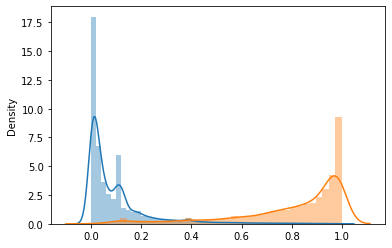

In [137]:
sns.distplot(best_pred_train[y_train==0], kde=True)
sns.distplot(best_pred_train[y_train==1], kde=True)

<AxesSubplot:xlabel='pred', ylabel='Density'>

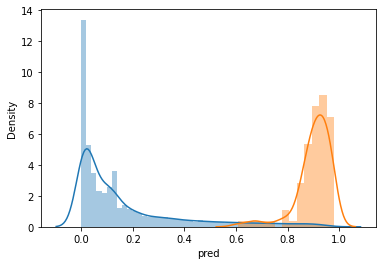

In [140]:
sns.distplot(prediction_data_oot_grad[prediction_data_oot_grad[target] <= 1].pred, kde=True)
sns.distplot(prediction_data_oot_grad[prediction_data_oot_grad[target] >= 4].pred, kde=True)


In [141]:
with open('../models/model.pkl', 'wb') as file:
    pickle.dump(best_model, file)